## Importing the relevant libraries

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings, joblib, pickle
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score, RepeatedStratifiedKFold, StratifiedKFold, KFold, RepeatedKFold
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, StandardScaler, FunctionTransformer, LabelEncoder
from sklearn.linear_model import LogisticRegression, SGDClassifier, RidgeClassifier, PassiveAggressiveClassifier, LassoCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.naive_bayes import GaussianNB, BernoulliNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier, HistGradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.feature_selection import SelectKBest, SelectPercentile, SelectFromModel, f_classif, mutual_info_classif, RFECV, SequentialFeatureSelector
from scipy.stats import probplot
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, accuracy_score
from imblearn.over_sampling import RandomOverSampler
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier
from sklearn.pipeline import Pipeline
from sklearn import set_config
set_config(display='diagram')
from collections import Counter
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

## Loading the dataset

In [2]:
df = pd.read_csv('winequalityN.csv')
df.head()

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,white,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,white,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,white,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


## Assessing the shape and dimensions of the dataset 

In [3]:
df.shape

(6497, 13)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   type                  6497 non-null   object 
 1   fixed acidity         6487 non-null   float64
 2   volatile acidity      6489 non-null   float64
 3   citric acid           6494 non-null   float64
 4   residual sugar        6495 non-null   float64
 5   chlorides             6495 non-null   float64
 6   free sulfur dioxide   6497 non-null   float64
 7   total sulfur dioxide  6497 non-null   float64
 8   density               6497 non-null   float64
 9   pH                    6488 non-null   float64
 10  sulphates             6493 non-null   float64
 11  alcohol               6497 non-null   float64
 12  quality               6497 non-null   int64  
dtypes: float64(11), int64(1), object(1)
memory usage: 660.0+ KB


In [5]:
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,6487.000000,6489.000000,6494.000000,6495.000000,6495.000000,6497.000000,6497.000000,6497.000000,6488.000000,6493.000000,6497.000000,6497.000000
mean,7.216579,0.339691,0.318722,5.444326,0.056042,30.525319,115.744574,0.994697,3.218395,0.531215,10.491801,5.818378
std,1.296750,0.164649,0.145265,4.758125,0.035036,17.749400,56.521855,0.002999,0.160748,0.148814,1.192712,0.873255
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000,5.000000
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000,6.000000
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000,6.000000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,9.000000


In [6]:
df.isnull().sum()

type                     0
fixed acidity           10
volatile acidity         8
citric acid              3
residual sugar           2
chlorides                2
free sulfur dioxide      0
total sulfur dioxide     0
density                  0
pH                       9
sulphates                4
alcohol                  0
quality                  0
dtype: int64

## Exploratory Data Analysis (EDA)

### Univariate Analysis

In [7]:
df.quality.value_counts()

6    2836
5    2138
7    1079
4     216
8     193
3      30
9       5
Name: quality, dtype: int64

<AxesSubplot: xlabel='type', ylabel='count'>

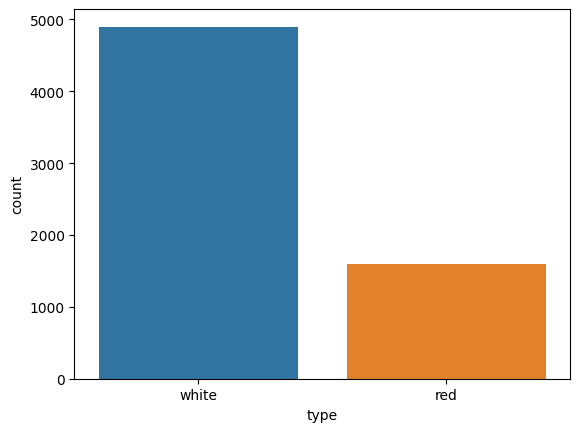

In [8]:
sns.countplot(df.type)

Majority of wines are of type white.

<AxesSubplot: xlabel='quality', ylabel='count'>

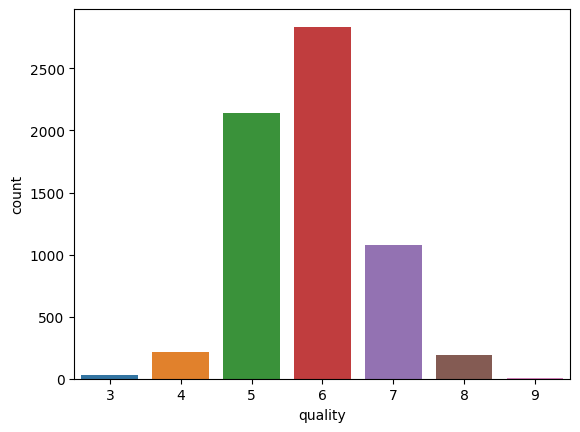

In [9]:
sns.countplot(df.quality)

The wine of quality "6" has the maximum instances among all wines. The classes are highly imbalanced so they need to be balanced out later.

Skewness of fixed acidity: 1.7228045308969795
Kurtosis of fixed acidity: 5.057726963492721


posx and posy should be finite values
posx and posy should be finite values


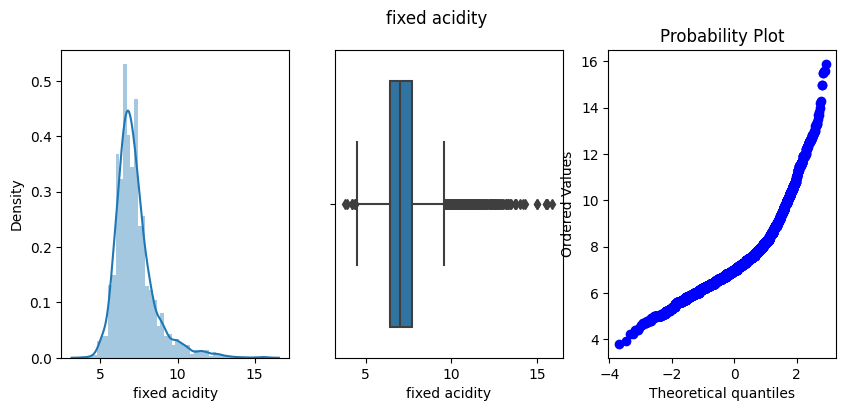

Skewness of volatile acidity: 1.4955115856471894
Kurtosis of volatile acidity: 2.827081281300937


<Figure size 640x480 with 0 Axes>

posx and posy should be finite values
posx and posy should be finite values


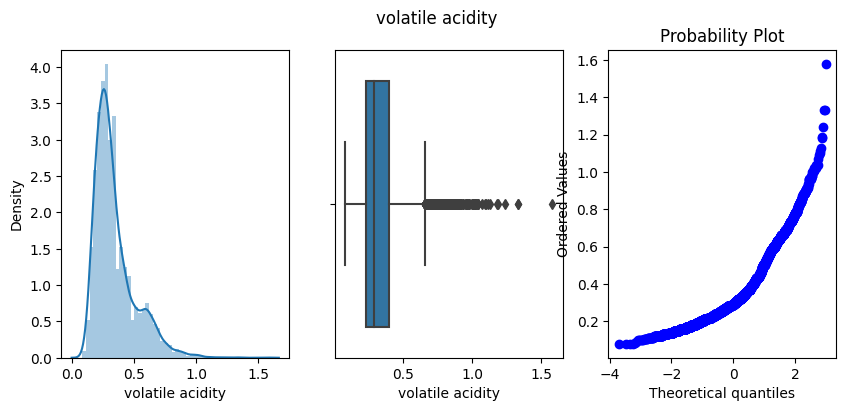

Skewness of citric acid: 0.4730324266140668
Kurtosis of citric acid: 2.401582074928648


<Figure size 640x480 with 0 Axes>

posx and posy should be finite values
posx and posy should be finite values


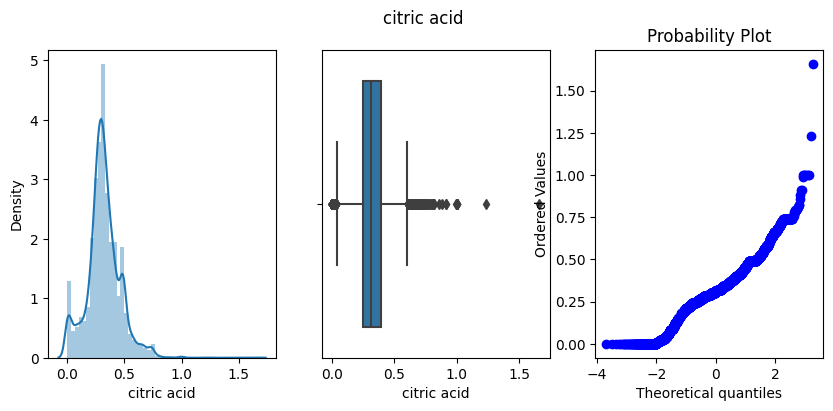

Skewness of residual sugar: 1.4349998392718966
Kurtosis of residual sugar: 4.358134414111722


<Figure size 640x480 with 0 Axes>

posx and posy should be finite values
posx and posy should be finite values


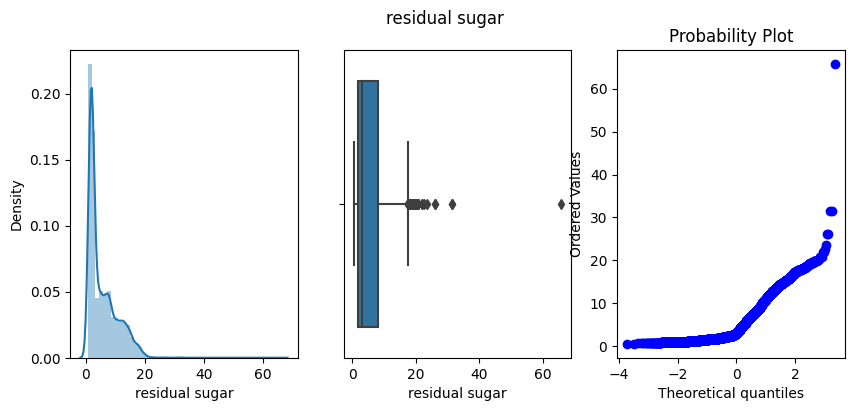

Skewness of chlorides: 5.399848762544374
Kurtosis of chlorides: 50.89487357895166


<Figure size 640x480 with 0 Axes>

posx and posy should be finite values
posx and posy should be finite values


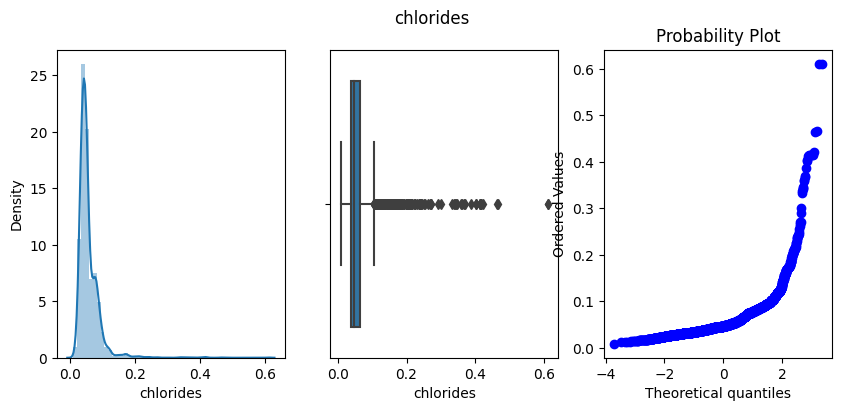

Skewness of free sulfur dioxide: 1.2200660740665203
Kurtosis of free sulfur dioxide: 7.906238067451564


<Figure size 640x480 with 0 Axes>

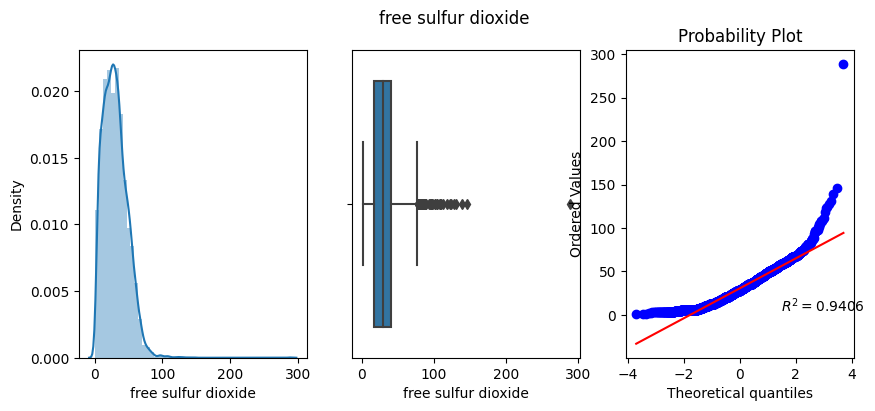

Skewness of total sulfur dioxide: -0.001177478234437964
Kurtosis of total sulfur dioxide: -0.37166365485713326


<Figure size 640x480 with 0 Axes>

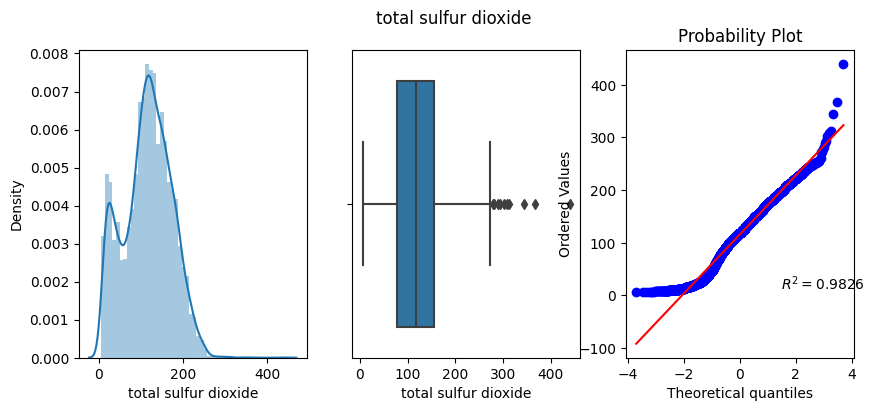

Skewness of density: 0.5036017301419994
Kurtosis of density: 6.6060669908766965


<Figure size 640x480 with 0 Axes>

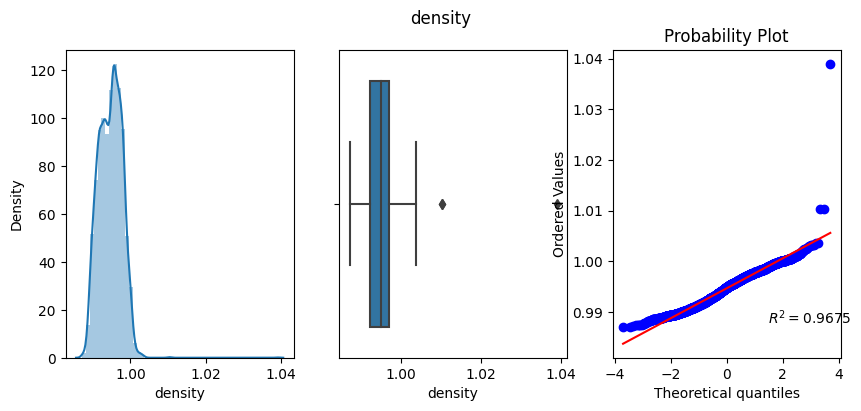

Skewness of pH: 0.3869659325699095
Kurtosis of pH: 0.37006810703189297


<Figure size 640x480 with 0 Axes>

posx and posy should be finite values
posx and posy should be finite values


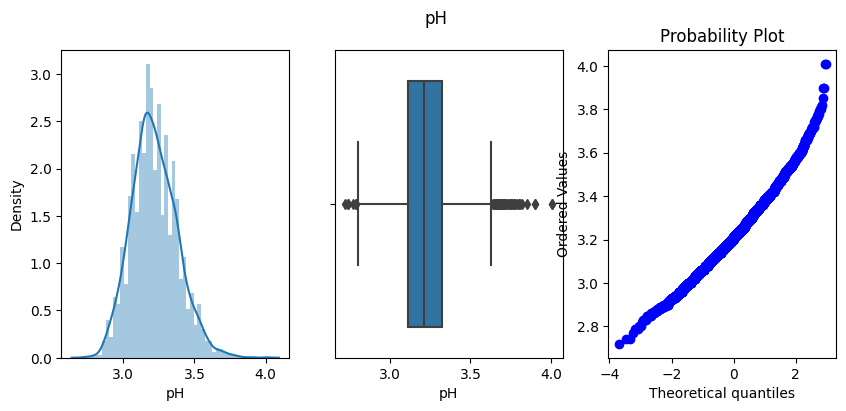

Skewness of sulphates: 1.798467034111248
Kurtosis of sulphates: 8.659892183033325


<Figure size 640x480 with 0 Axes>

posx and posy should be finite values
posx and posy should be finite values


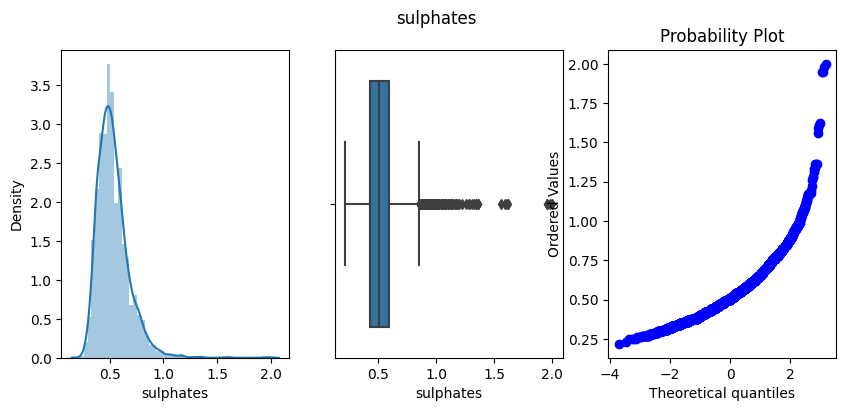

Skewness of alcohol: 0.5657177290960251
Kurtosis of alcohol: -0.531687382876683


<Figure size 640x480 with 0 Axes>

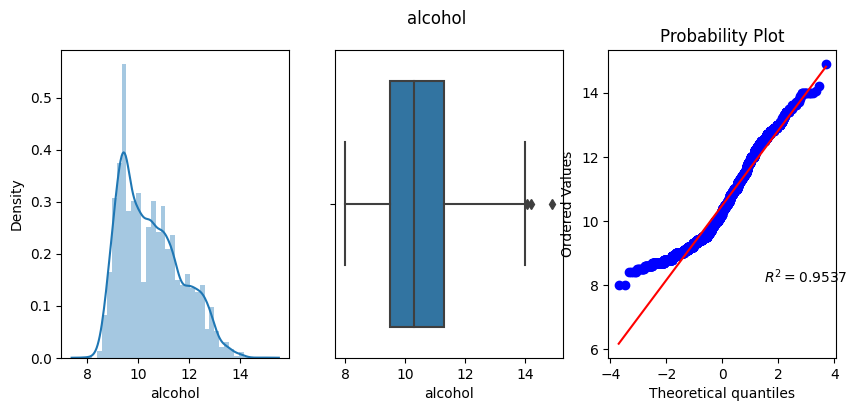

Skewness of quality: 0.1896226933726968
Kurtosis of quality: 0.2323222693432636


<Figure size 640x480 with 0 Axes>

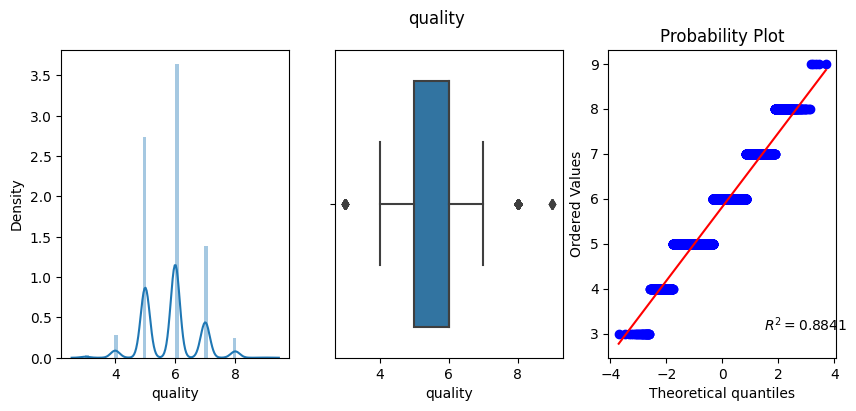

<Figure size 640x480 with 0 Axes>

In [10]:
for col in df.select_dtypes(np.number).columns:
    print(f"Skewness of {col}:",df[col].skew())
    print(f"Kurtosis of {col}:",df[col].kurtosis())
    fig, axes = plt.subplots(nrows=1,ncols=3,figsize=(10,4))
    sns.distplot(df[col],ax=axes[0])
    sns.boxplot(df[col],ax=axes[1])
    probplot(df[col],plot=axes[2],rvalue=True,dist='norm')
    plt.suptitle(col)
    plt.show()
    plt.tight_layout()

All the columns have right-skewed distributions and have outliers as well. 

In [11]:
# Custom function to apply a feature transformation on a specific feature
def apply_transform(transform,col):
    print(f"Skewness of {col}:",df[col].skew())
    print(f"Kurtosis of {col}:",df[col].kurtosis())
    
    plt.subplot(231)
    sns.distplot(df[col])
    plt.subplot(232)
    sns.boxplot(df[col])
    plt.subplot(233)
    probplot(df[col],plot=plt,rvalue=True,dist='norm')
    plt.suptitle(f'{col} before transform')
    plt.show()
    
    transformed_col = transform.fit_transform(df[col])
    plt.subplot(234)
    sns.distplot(transformed_col)
    plt.subplot(235)
    sns.boxplot(transformed_col)
    plt.subplot(236)
    probplot(transformed_col,plot=plt,rvalue=True,dist='norm')
    plt.suptitle(f'{col} after transform')
    plt.show()
    plt.tight_layout()

### Analyzing the effect of Log Transform

Skewness of fixed acidity: 1.7228045308969795
Kurtosis of fixed acidity: 5.057726963492721


posx and posy should be finite values
posx and posy should be finite values


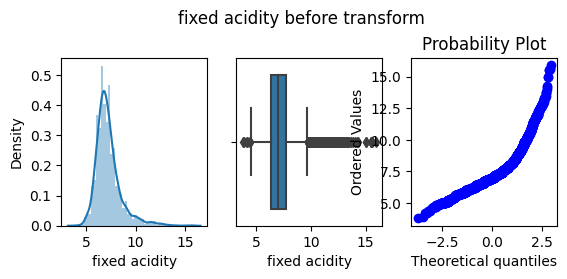

posx and posy should be finite values
posx and posy should be finite values


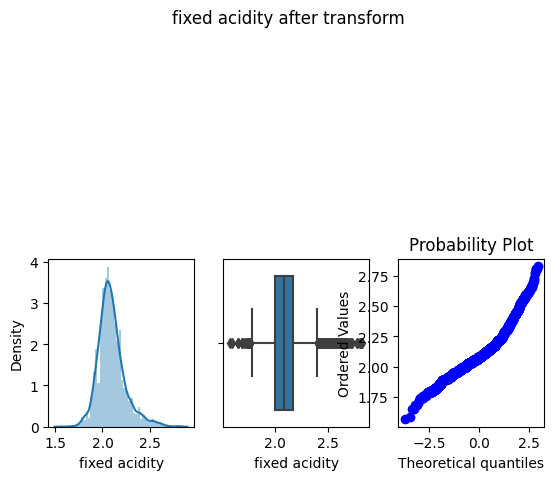

Skewness of volatile acidity: 1.4955115856471894
Kurtosis of volatile acidity: 2.827081281300937


posx and posy should be finite values
posx and posy should be finite values


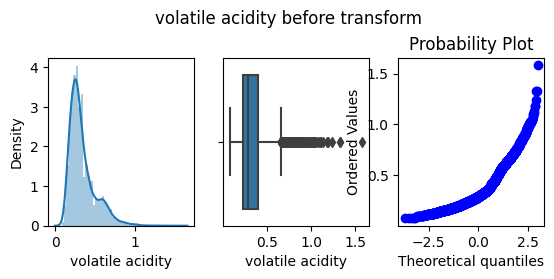

posx and posy should be finite values
posx and posy should be finite values


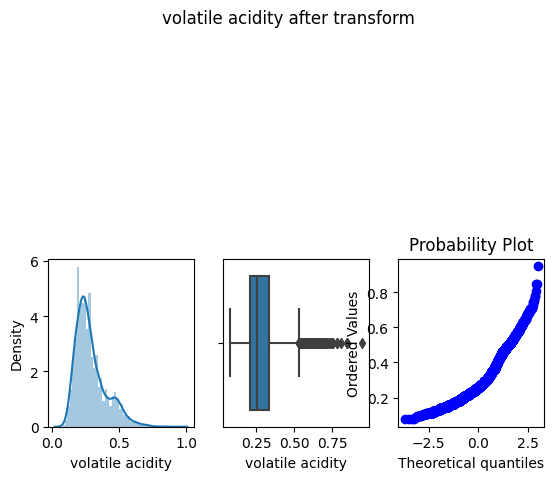

Skewness of citric acid: 0.4730324266140668
Kurtosis of citric acid: 2.401582074928648


posx and posy should be finite values
posx and posy should be finite values


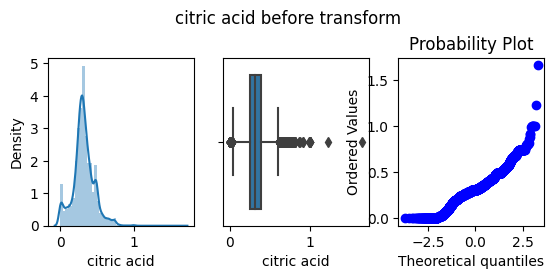

posx and posy should be finite values
posx and posy should be finite values


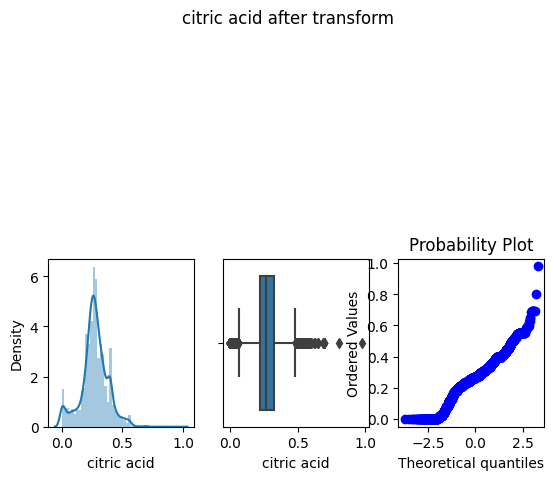

Skewness of residual sugar: 1.4349998392718966
Kurtosis of residual sugar: 4.358134414111722


posx and posy should be finite values
posx and posy should be finite values


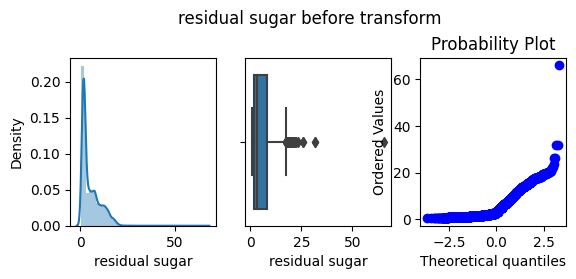

posx and posy should be finite values
posx and posy should be finite values


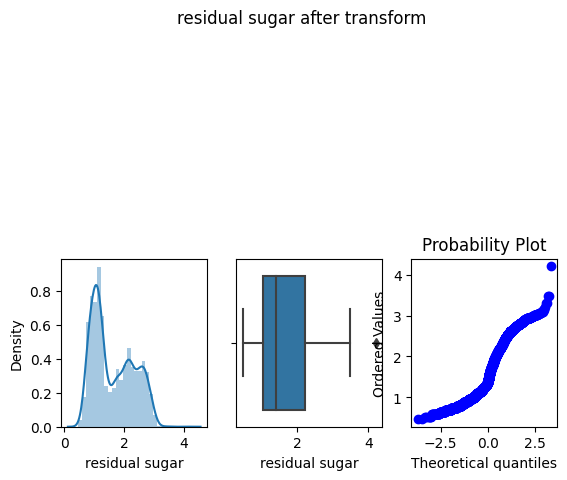

Skewness of chlorides: 5.399848762544374
Kurtosis of chlorides: 50.89487357895166


posx and posy should be finite values
posx and posy should be finite values


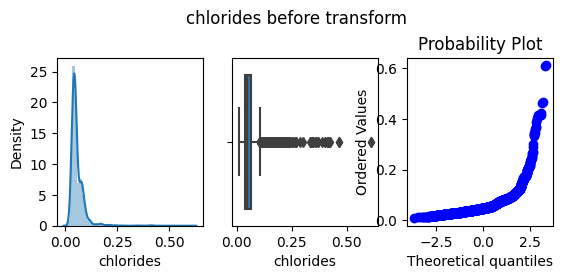

posx and posy should be finite values
posx and posy should be finite values


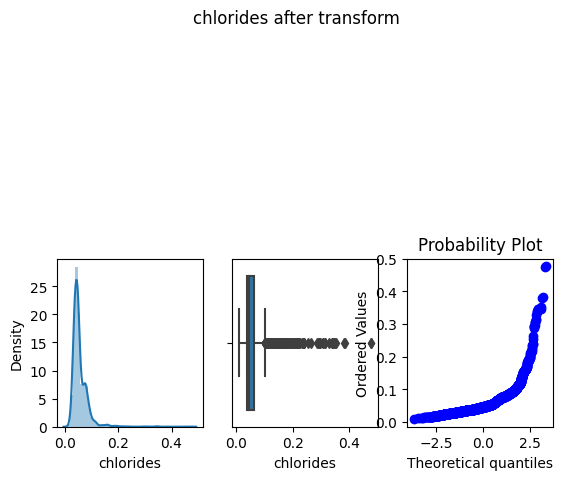

Skewness of free sulfur dioxide: 1.2200660740665203
Kurtosis of free sulfur dioxide: 7.906238067451564


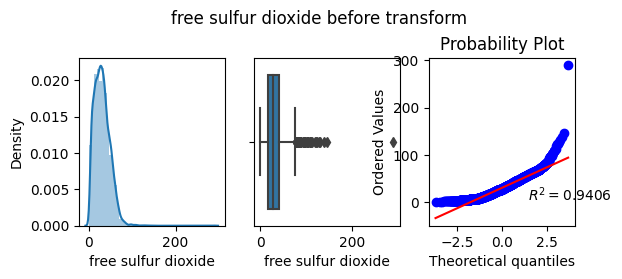

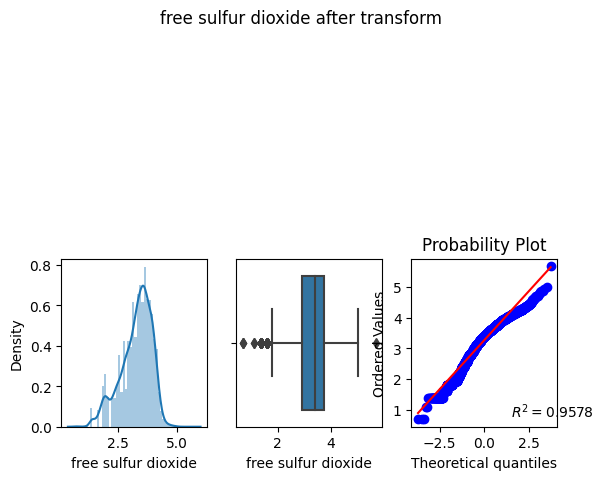

Skewness of total sulfur dioxide: -0.001177478234437964
Kurtosis of total sulfur dioxide: -0.37166365485713326


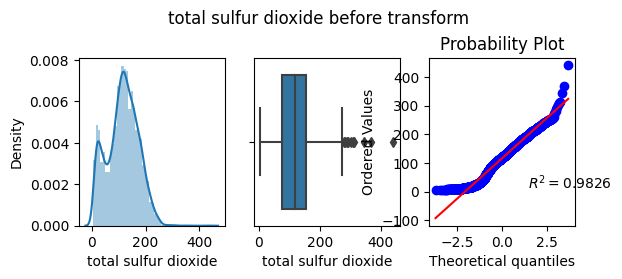

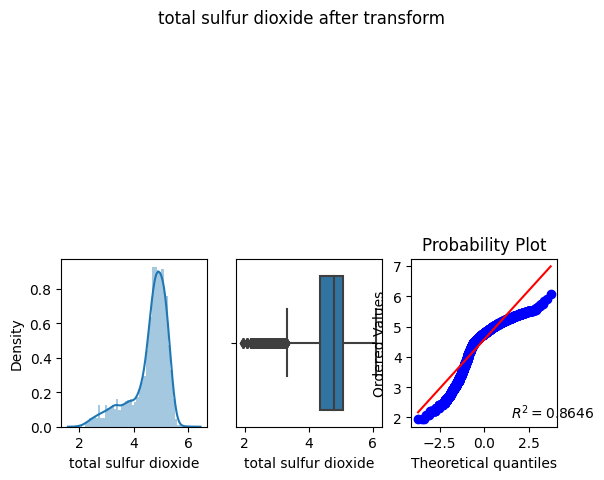

Skewness of density: 0.5036017301419994
Kurtosis of density: 6.6060669908766965


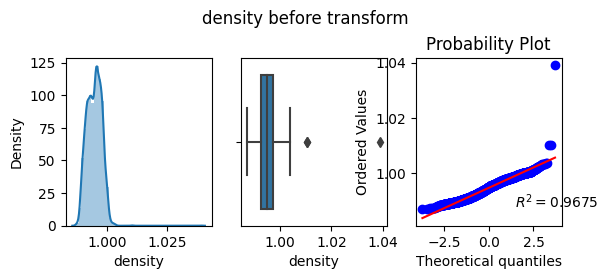

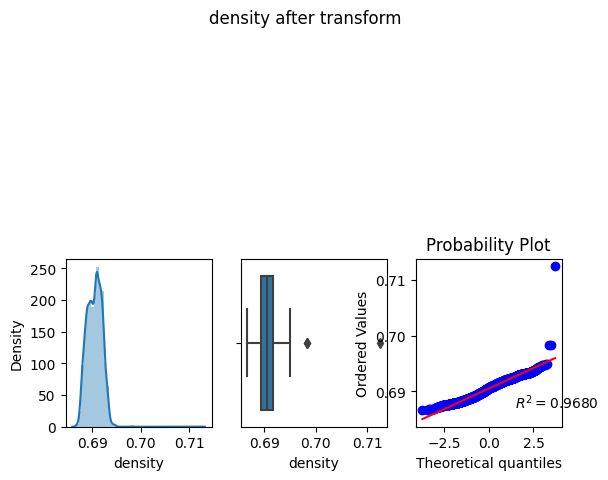

Skewness of pH: 0.3869659325699095
Kurtosis of pH: 0.37006810703189297


posx and posy should be finite values
posx and posy should be finite values


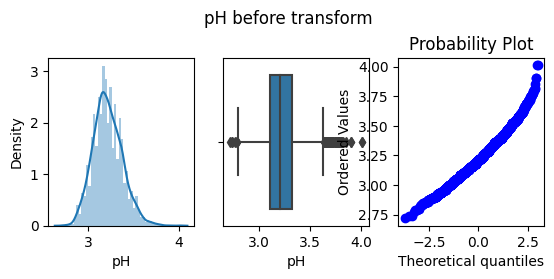

posx and posy should be finite values
posx and posy should be finite values


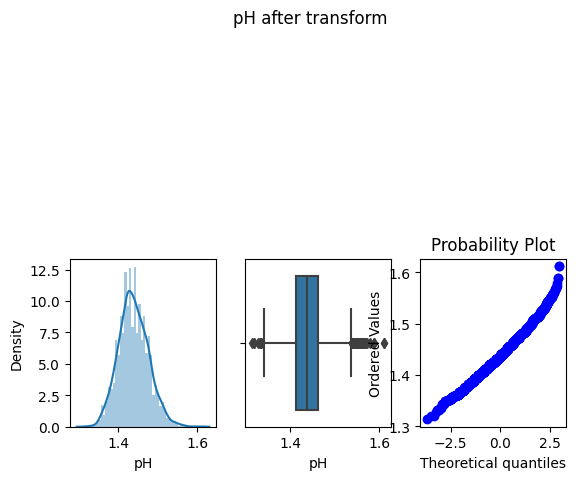

Skewness of sulphates: 1.798467034111248
Kurtosis of sulphates: 8.659892183033325


posx and posy should be finite values
posx and posy should be finite values


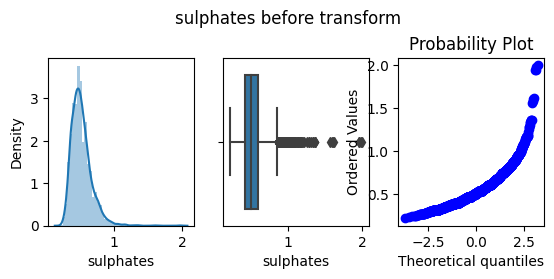

posx and posy should be finite values
posx and posy should be finite values


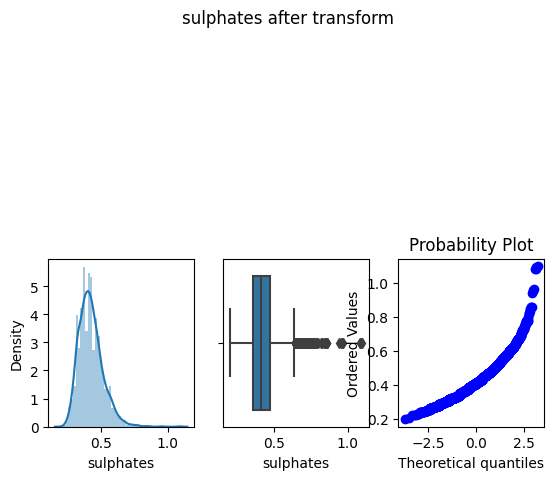

Skewness of alcohol: 0.5657177290960251
Kurtosis of alcohol: -0.531687382876683


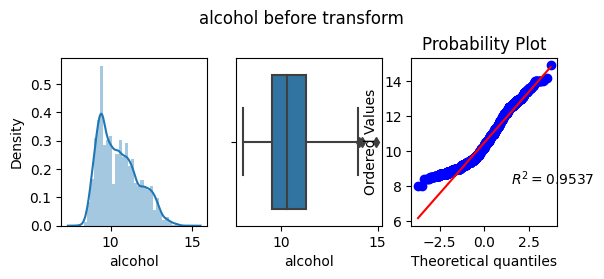

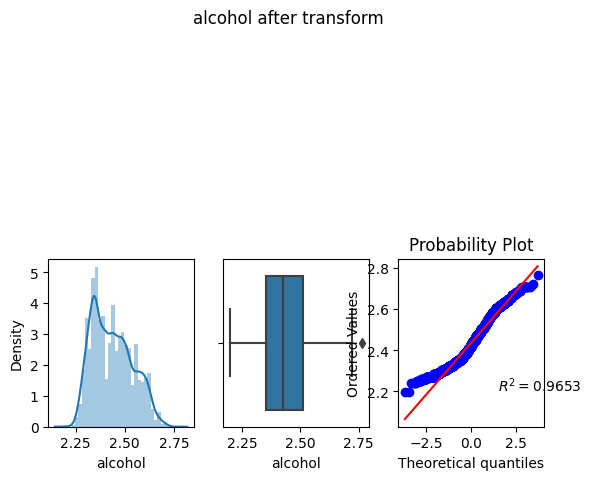

Skewness of quality: 0.1896226933726968
Kurtosis of quality: 0.2323222693432636


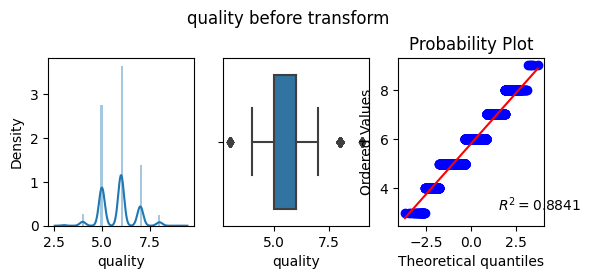

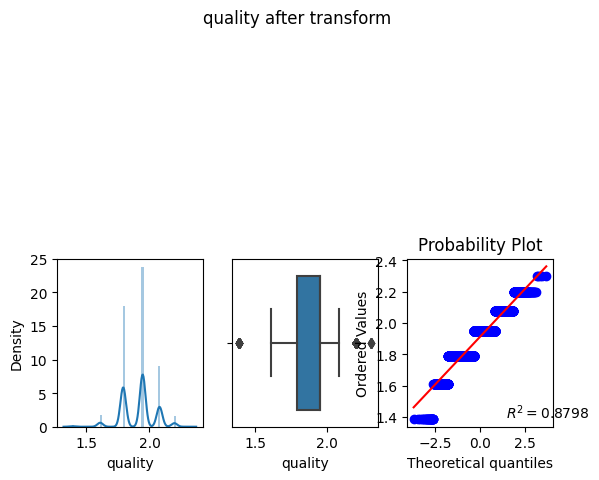

<Figure size 640x480 with 0 Axes>

In [12]:
for col in df.select_dtypes(np.number).columns:
    apply_transform(FunctionTransformer(np.log1p),col)

### Analyzing the effect of Square-Root Transform

posx and posy should be finite values


Skewness of chlorides: 5.399848762544374
Kurtosis of chlorides: 50.89487357895166


posx and posy should be finite values


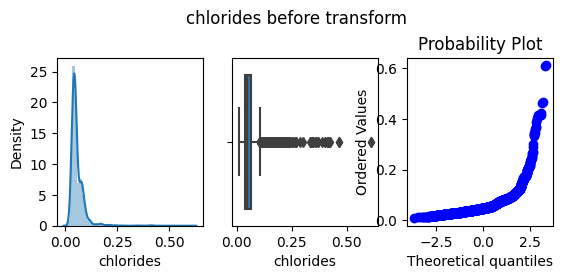

posx and posy should be finite values
posx and posy should be finite values


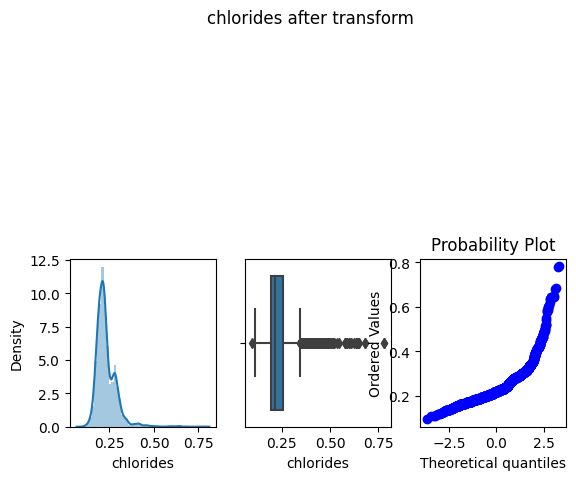

Skewness of volatile acidity: 1.4955115856471894
Kurtosis of volatile acidity: 2.827081281300937


posx and posy should be finite values
posx and posy should be finite values


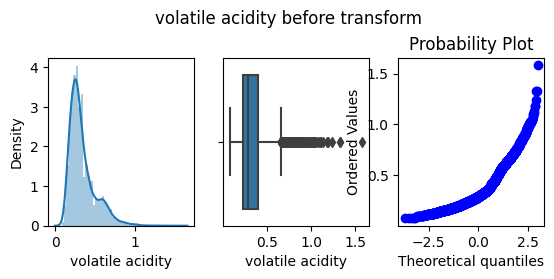

posx and posy should be finite values
posx and posy should be finite values


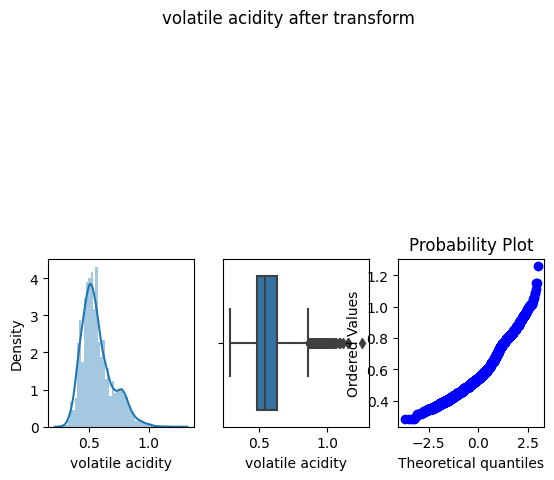

posx and posy should be finite values


Skewness of citric acid: 0.4730324266140668
Kurtosis of citric acid: 2.401582074928648


posx and posy should be finite values


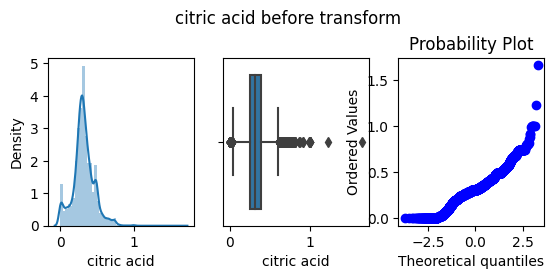

posx and posy should be finite values
posx and posy should be finite values


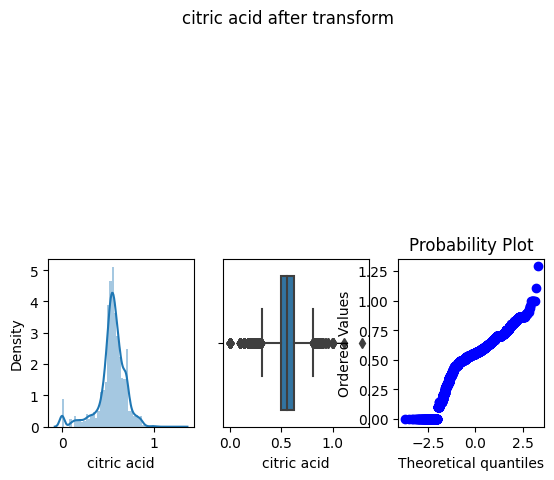

Skewness of total sulfur dioxide: -0.001177478234437964
Kurtosis of total sulfur dioxide: -0.37166365485713326


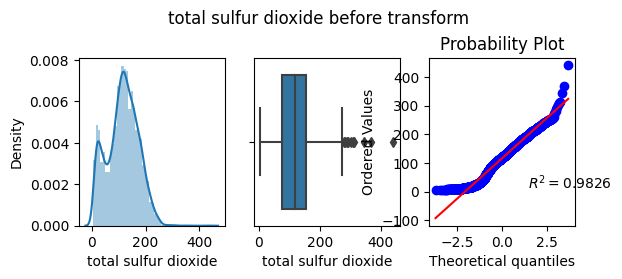

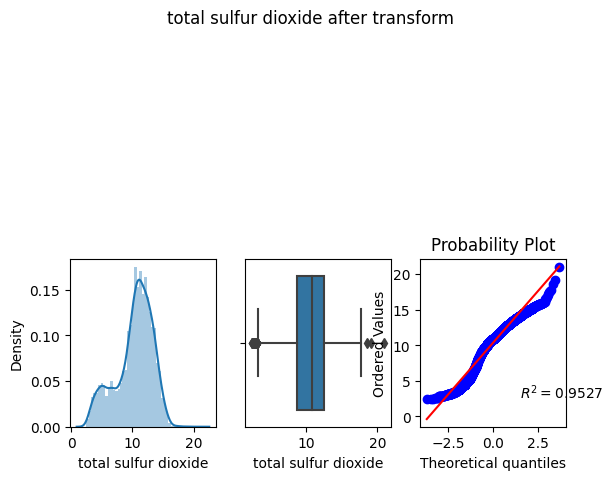

Skewness of pH: 0.3869659325699095
Kurtosis of pH: 0.37006810703189297


posx and posy should be finite values
posx and posy should be finite values


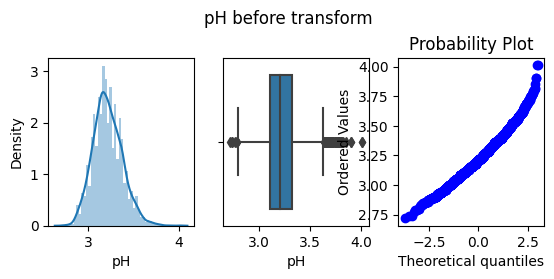

posx and posy should be finite values
posx and posy should be finite values


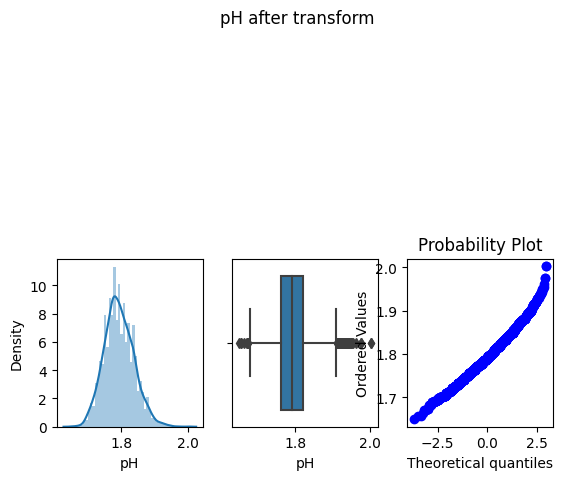

Skewness of sulphates: 1.798467034111248
Kurtosis of sulphates: 8.659892183033325


posx and posy should be finite values
posx and posy should be finite values


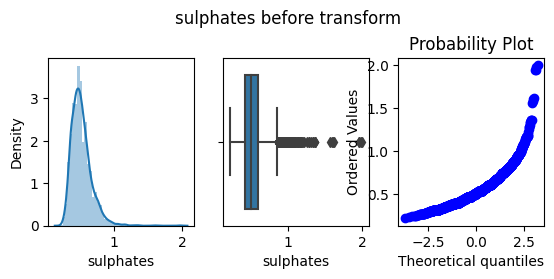

posx and posy should be finite values
posx and posy should be finite values


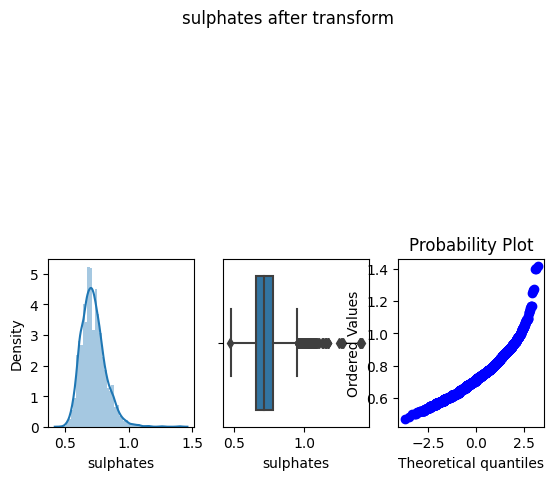

<Figure size 640x480 with 0 Axes>

In [13]:
cols = ['chlorides', 'volatile acidity', 'citric acid', 'total sulfur dioxide', 'pH', 'sulphates']
for col in cols:
    apply_transform(FunctionTransformer(np.sqrt),col)

### Analyzing the effect of Reciprocal Transform

posx and posy should be finite values


Skewness of chlorides: 5.399848762544374
Kurtosis of chlorides: 50.89487357895166


posx and posy should be finite values


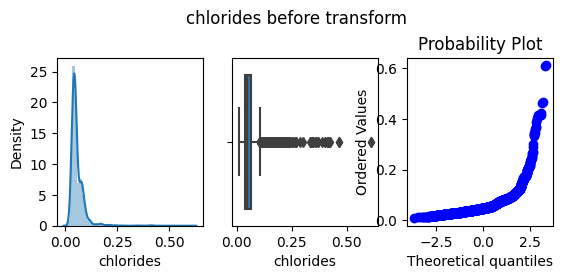

posx and posy should be finite values
posx and posy should be finite values


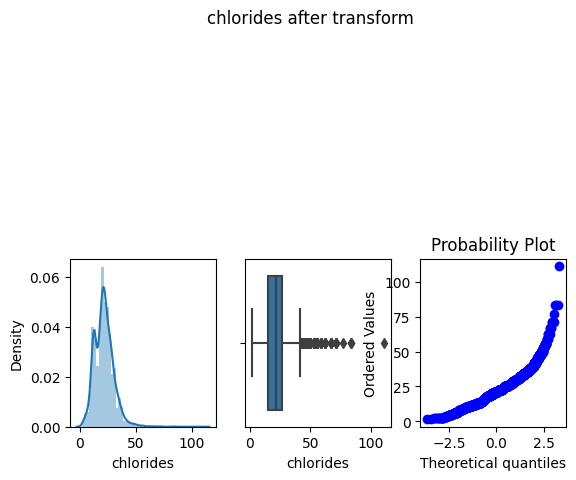

Skewness of volatile acidity: 1.4955115856471894
Kurtosis of volatile acidity: 2.827081281300937


posx and posy should be finite values
posx and posy should be finite values


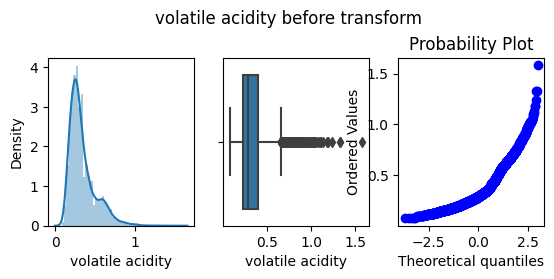

posx and posy should be finite values
posx and posy should be finite values


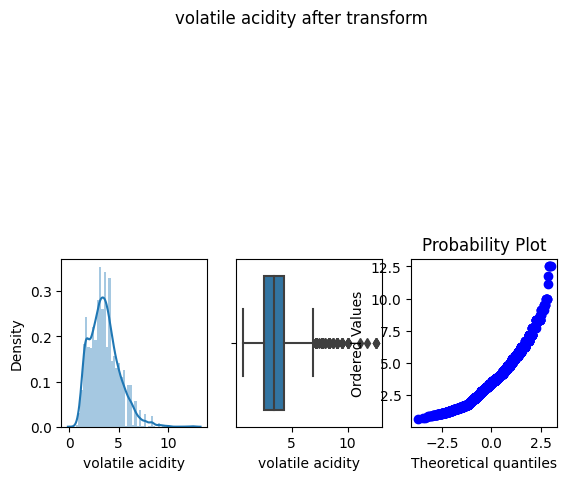

Skewness of citric acid: 0.4730324266140668
Kurtosis of citric acid: 2.401582074928648


posx and posy should be finite values
posx and posy should be finite values


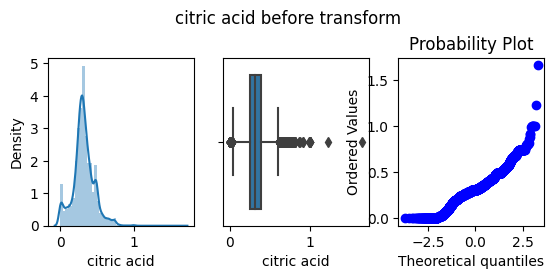

posx and posy should be finite values
posx and posy should be finite values


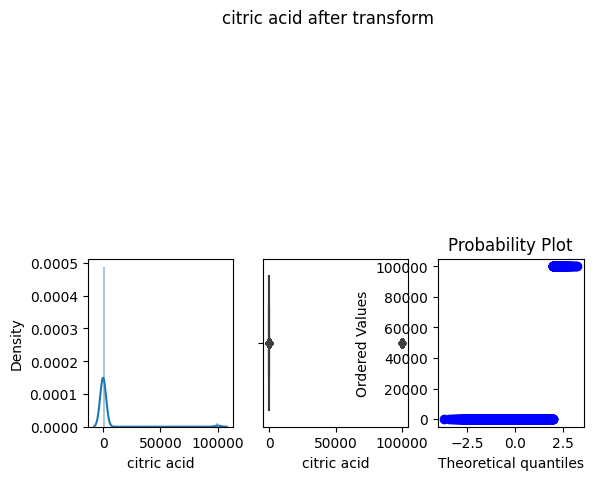

Skewness of total sulfur dioxide: -0.001177478234437964
Kurtosis of total sulfur dioxide: -0.37166365485713326


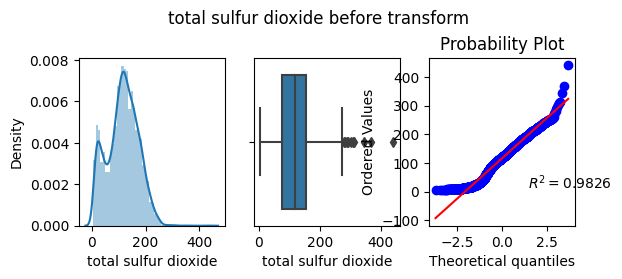

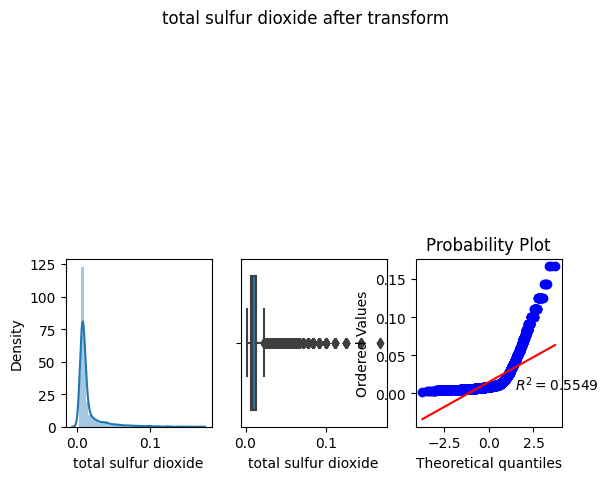

posx and posy should be finite values


Skewness of pH: 0.3869659325699095
Kurtosis of pH: 0.37006810703189297


posx and posy should be finite values


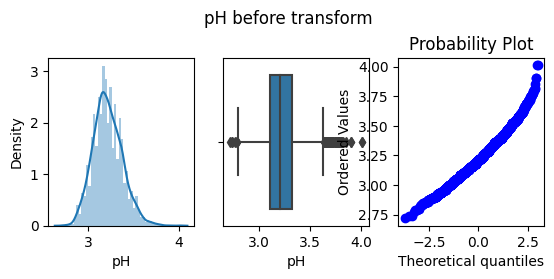

posx and posy should be finite values
posx and posy should be finite values


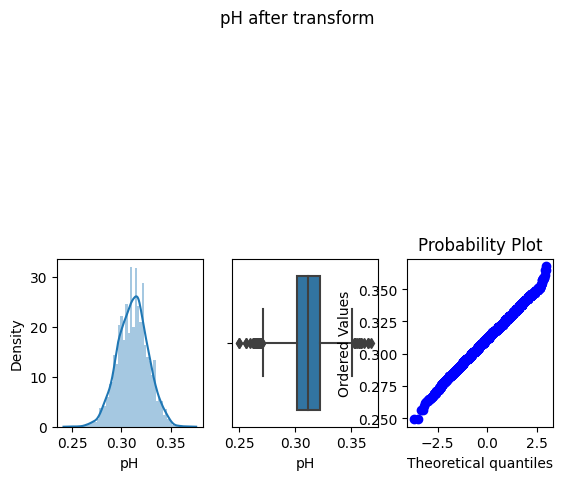

posx and posy should be finite values


Skewness of sulphates: 1.798467034111248
Kurtosis of sulphates: 8.659892183033325


posx and posy should be finite values


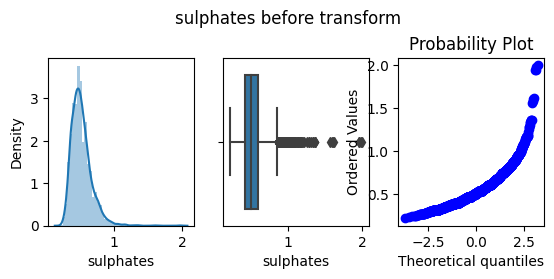

posx and posy should be finite values
posx and posy should be finite values


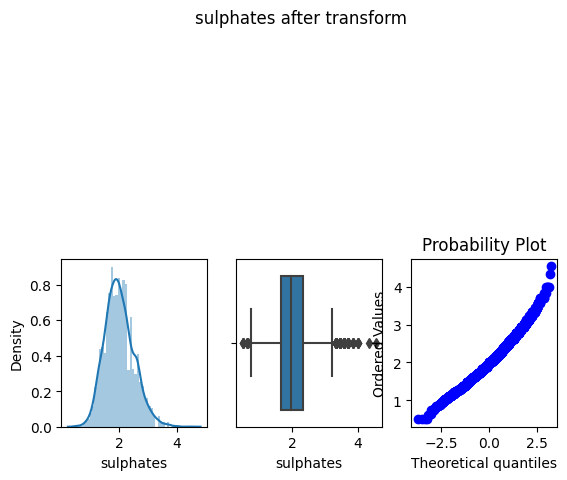

<Figure size 640x480 with 0 Axes>

In [14]:
cols = ['chlorides', 'volatile acidity', 'citric acid', 'total sulfur dioxide', 'pH', 'sulphates']
for col in cols:
    apply_transform(FunctionTransformer(lambda x: 1/(x+0.00001)),col)

### Bivariate Analysis

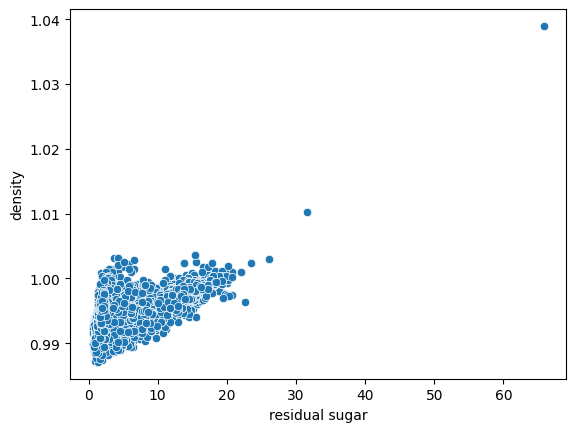

In [15]:
sns.scatterplot(x='residual sugar',y='density',data=df);

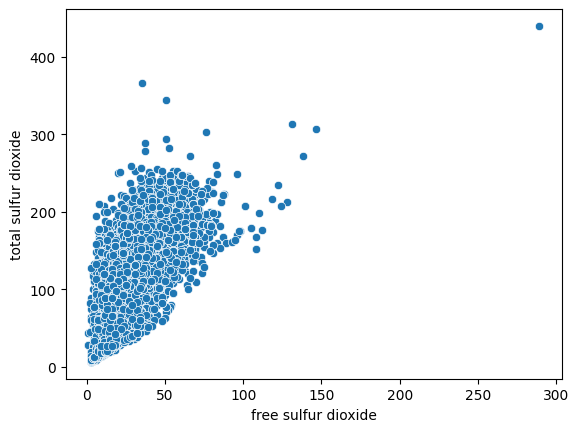

In [16]:
sns.scatterplot(x='free sulfur dioxide',y='total sulfur dioxide',data=df);

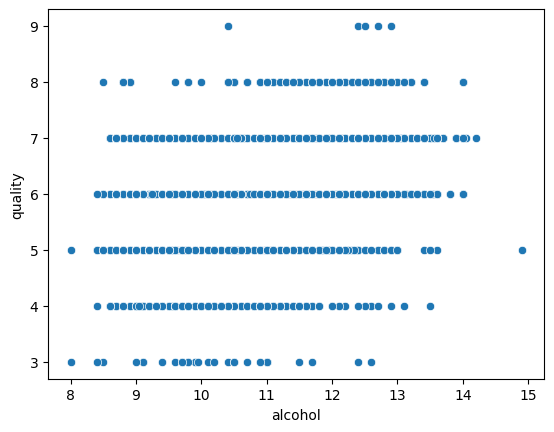

In [17]:
sns.scatterplot(x='alcohol',y='quality',data=df);

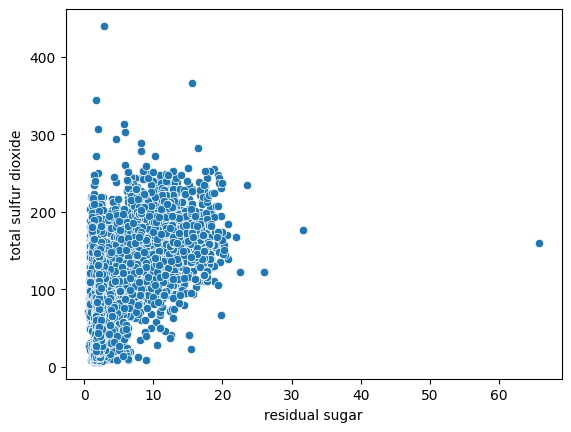

In [18]:
sns.scatterplot(x='residual sugar',y='total sulfur dioxide',data=df);

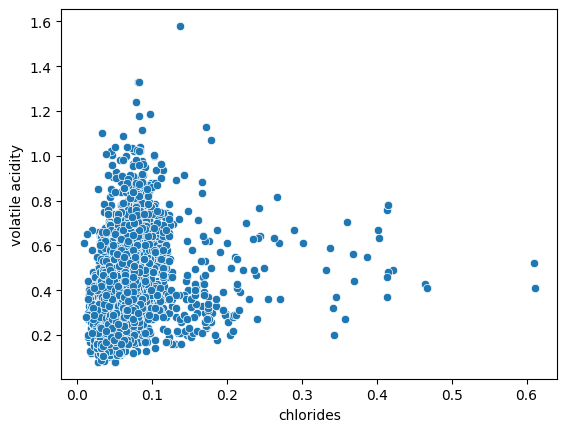

In [19]:
sns.scatterplot(x='chlorides',y='volatile acidity',data=df);

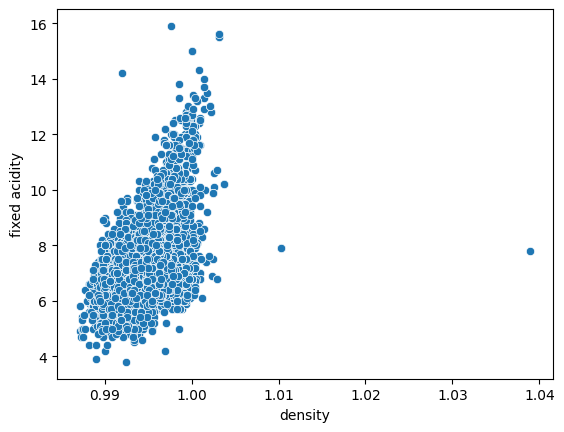

In [20]:
sns.scatterplot(x='density',y='fixed acidity',data=df);

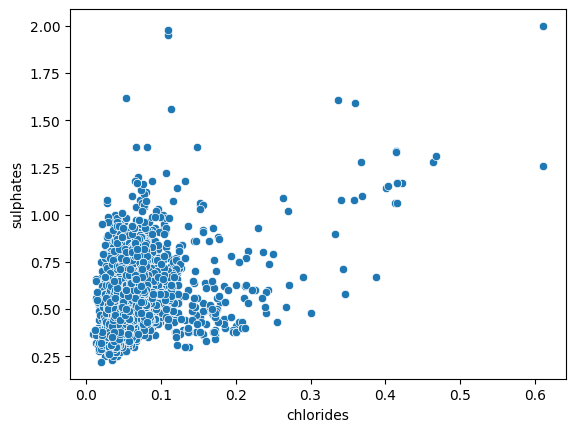

In [21]:
sns.scatterplot(x='chlorides',y='sulphates',data=df);

<b>Positive correlations:</b>
<ul>
    <li>Residual sugar and density</li>
    <li>Residual sugar and total sulfur dioxide</li>
    <li>Free sulfur dioxide and total sulfur dioxide</li>
    <li>Alcohol and quality</li>
    <li>Chlorides and volatile acidity</li>
    <li>Density and fixed acidity</li>
    <li>Chlorides and sulphates</li>
</ul>

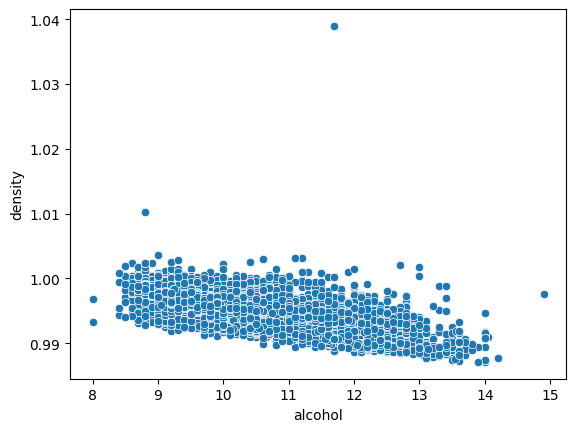

In [22]:
sns.scatterplot(x='alcohol',y='density',data=df);

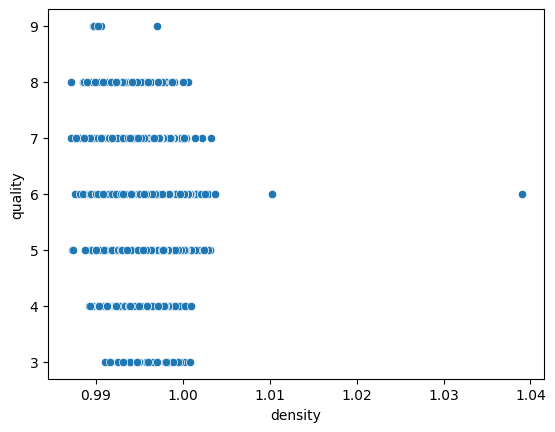

In [23]:
sns.scatterplot(x='density',y='quality',data=df);

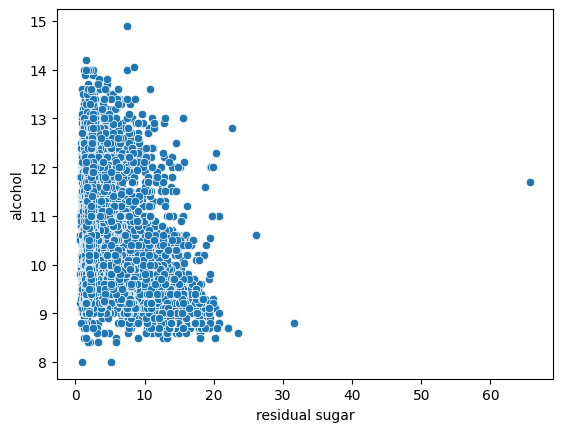

In [24]:
sns.scatterplot(x='residual sugar',y='alcohol',data=df);

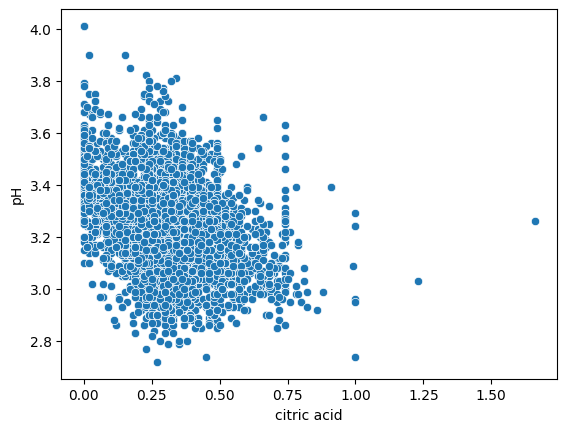

In [25]:
sns.scatterplot(x='citric acid',y='pH',data=df);

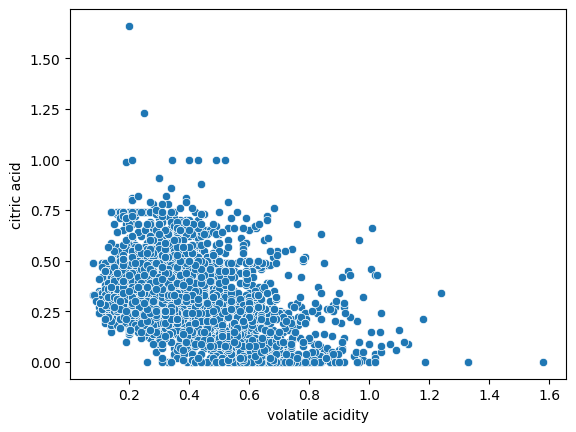

In [26]:
sns.scatterplot(x='volatile acidity',y='citric acid',data=df);

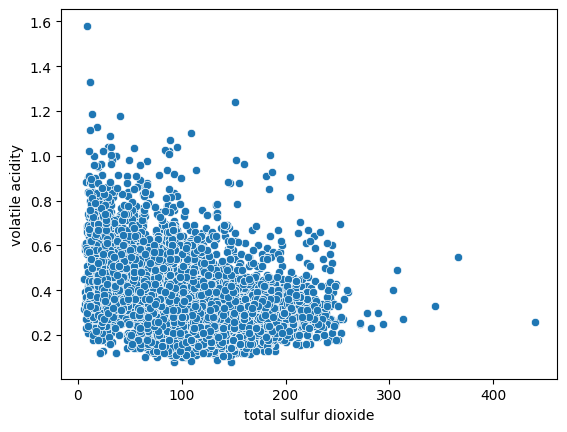

In [27]:
sns.scatterplot(x='total sulfur dioxide',y='volatile acidity',data=df);

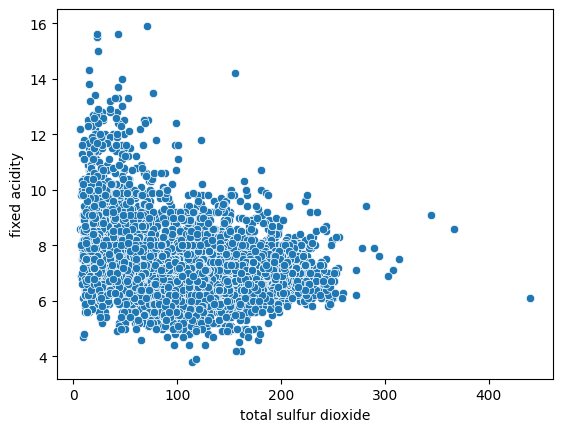

In [28]:
sns.scatterplot(x='total sulfur dioxide',y='fixed acidity',data=df);

<b>Negative correlations:</b>
<ul>
    <li>Residual sugar and alcohol</li>
    <li>Density and quality</li>
    <li>Alcohol and density</li>
    <li>Citric acid and pH</li>
    <li>Volatile acidity and citric acid</li>
    <li>Total sulfur dioxide and volatile acidity</li>
    <li>Total sulfur dioxide and fixed acidity</li>
</ul>

### Multivariate Analysis

<AxesSubplot: >

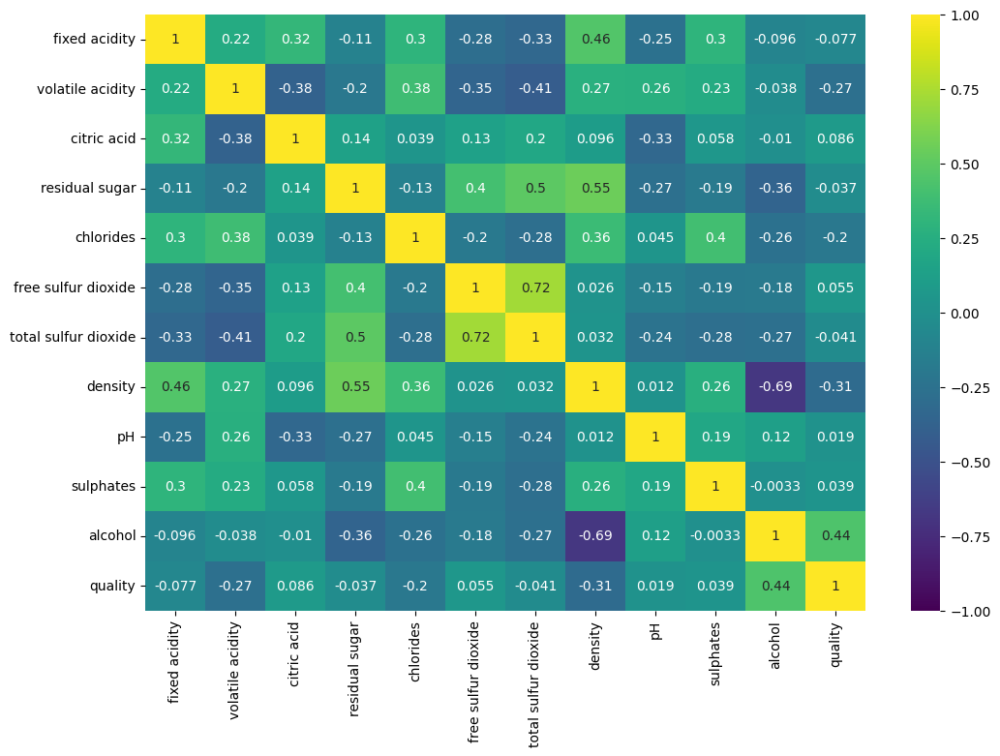

In [29]:
plt.figure(figsize=(12,8))
sns.heatmap(df.corr(),annot=True,cmap='viridis',vmin=-1,vmax=1)

In [30]:
df.corr()['quality'].sort_values(ascending=False)[1:]

alcohol                 0.444319
citric acid             0.085706
free sulfur dioxide     0.055463
sulphates               0.038729
pH                      0.019366
residual sugar         -0.036825
total sulfur dioxide   -0.041385
fixed acidity          -0.077031
chlorides              -0.200886
volatile acidity       -0.265953
density                -0.305858
Name: quality, dtype: float64

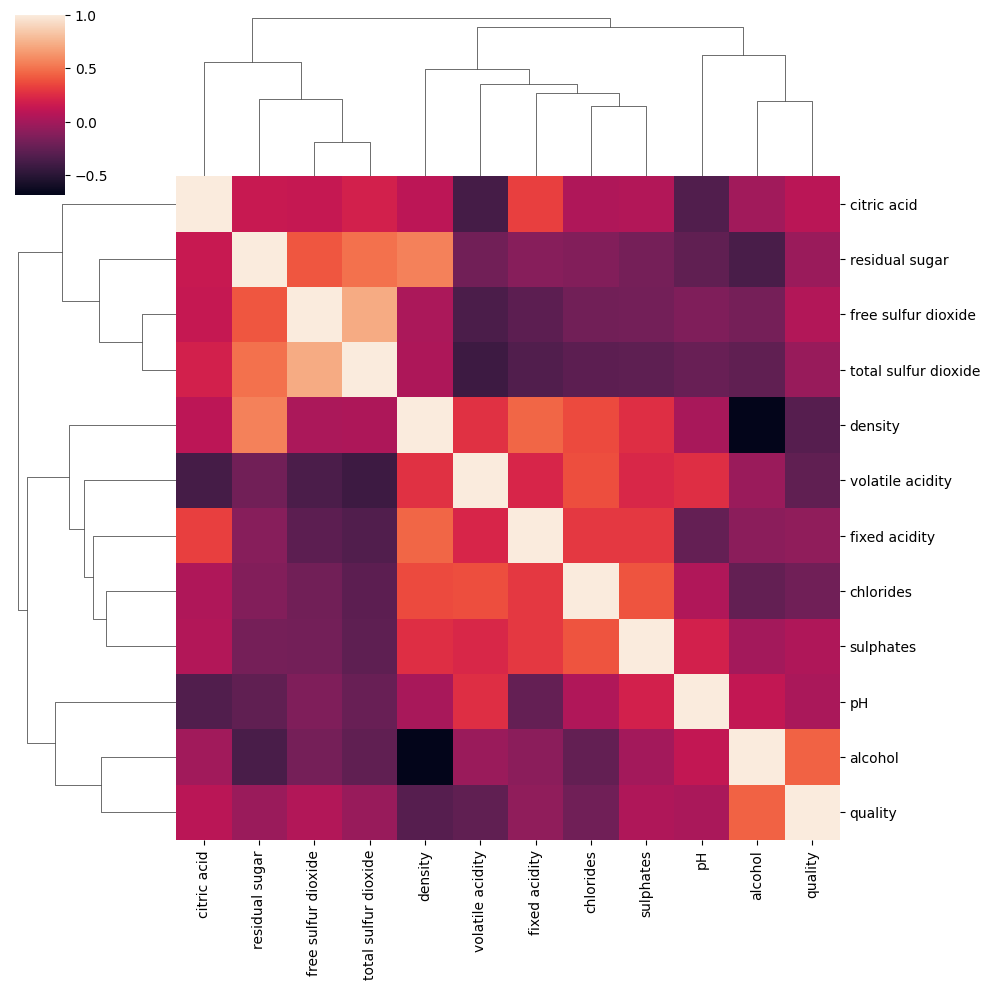

In [31]:
sns.clustermap(df.corr())

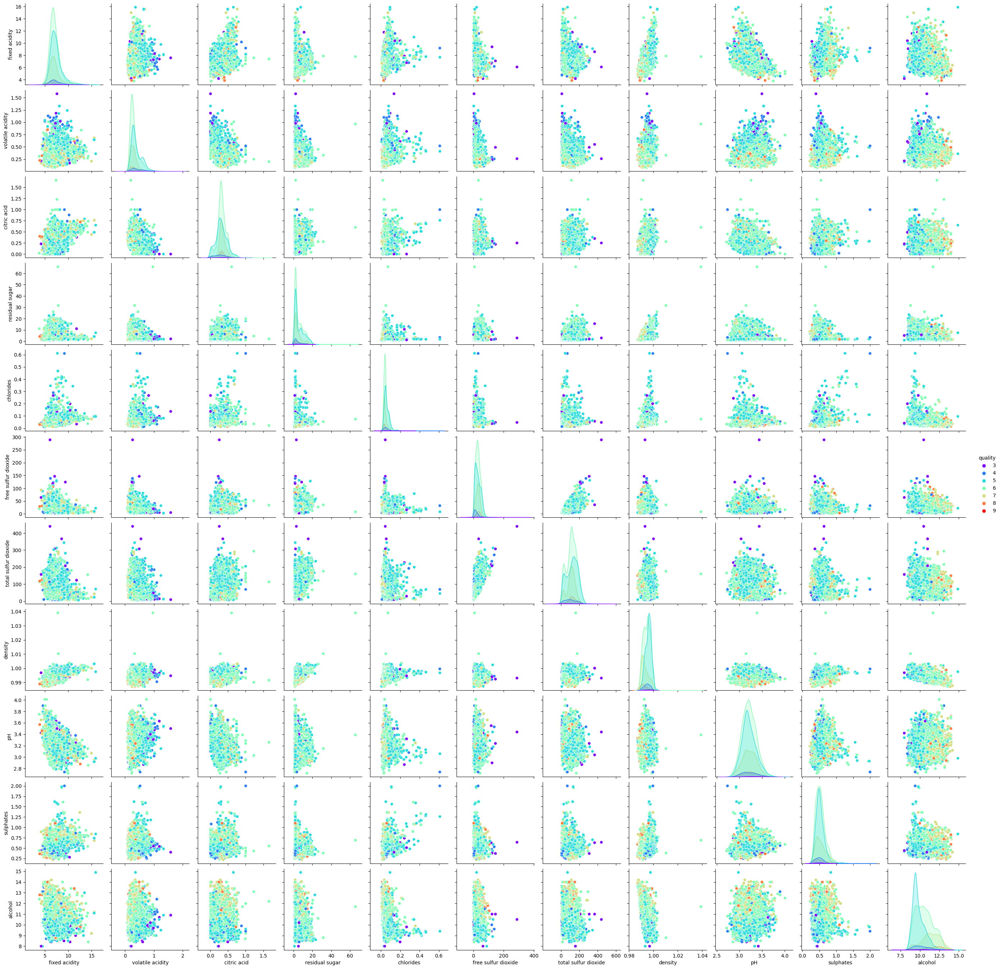

In [32]:
sns.pairplot(df,hue='quality',palette='rainbow');

## Feature Engineering

### Imputation of Missing Values

In [33]:
df.isna().sum() / len(df)

type                    0.000000
fixed acidity           0.001539
volatile acidity        0.001231
citric acid             0.000462
residual sugar          0.000308
chlorides               0.000308
free sulfur dioxide     0.000000
total sulfur dioxide    0.000000
density                 0.000000
pH                      0.001385
sulphates               0.000616
alcohol                 0.000000
quality                 0.000000
dtype: float64

## Separating the dataset into independent features and target variable

In [34]:
X = df.drop('quality',axis=1)
y = df.quality

In [35]:
numerical_features = X.select_dtypes(np.number).columns
categorical_features = X.select_dtypes(object).columns

In [36]:
numerical_transformer = Pipeline(steps=[
    ('imputer',SimpleImputer(strategy='median',add_indicator=True)), # Since all numerical features have highly right-skewed distributions, median is the most optimal imputation strategy
    ('scaler',StandardScaler())
])
numerical_transformer

Pipeline(steps=[('imputer',
                 SimpleImputer(add_indicator=True, strategy='median')),
                ('scaler', StandardScaler())])

In [37]:
categorical_transformer = Pipeline(steps=[
    ('imputer',SimpleImputer(strategy='most_frequent',add_indicator=True)),
    ('scaler',OneHotEncoder(handle_unknown='ignore',drop='first',sparse_output=False))
])
categorical_transformer

Pipeline(steps=[('imputer',
                 SimpleImputer(add_indicator=True, strategy='most_frequent')),
                ('scaler',
                 OneHotEncoder(drop='first', handle_unknown='ignore',
                               sparse_output=False))])

In [38]:
# Filling the missing values of numerical columns
for col in numerical_features:
    X[col] = numerical_transformer.fit_transform(X[[col]])

In [39]:
# Filling the missing values of categorical columns
for col in categorical_features:
    X[col] = categorical_transformer.fit_transform(X[[col]])

### Balancing out the target label classes using Random Over Sampler

In [40]:
ros = RandomOverSampler()
X, y = ros.fit_resample(X,y)

<AxesSubplot: xlabel='quality', ylabel='count'>

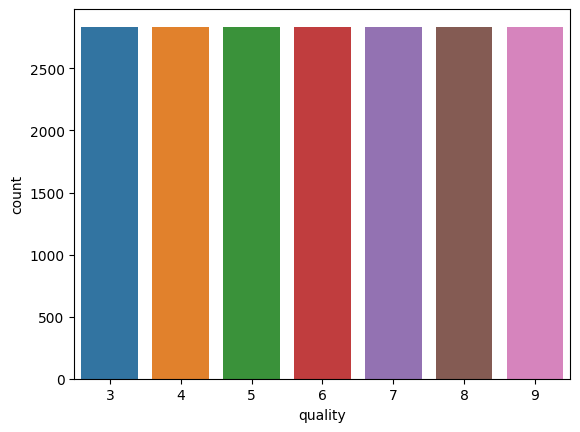

In [41]:
sns.countplot(y)

In [42]:
print("Resampled classes:",Counter(y))
print("Resampled dataset shape:",X.shape)

Resampled classes: Counter({6: 2836, 5: 2836, 7: 2836, 8: 2836, 4: 2836, 3: 2836, 9: 2836})
Resampled dataset shape: (19852, 12)


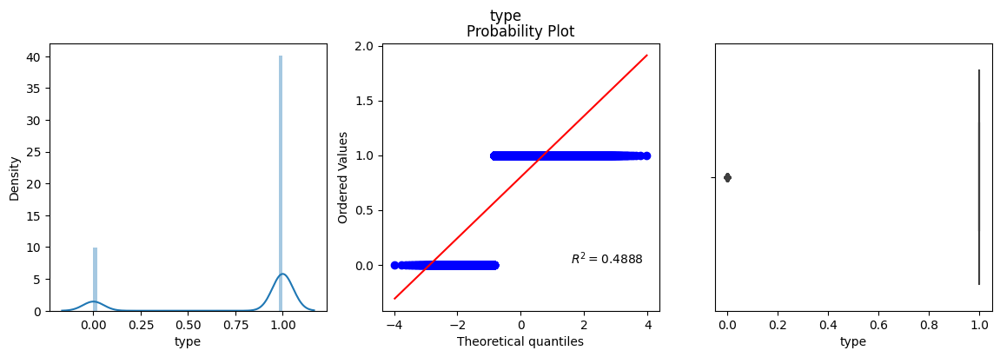

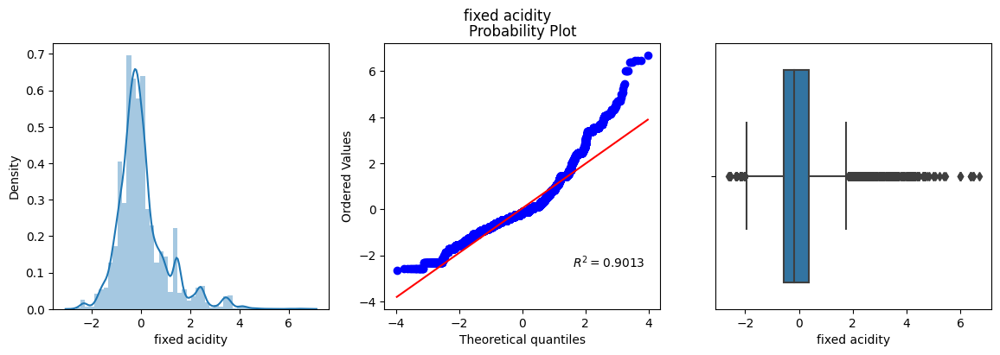

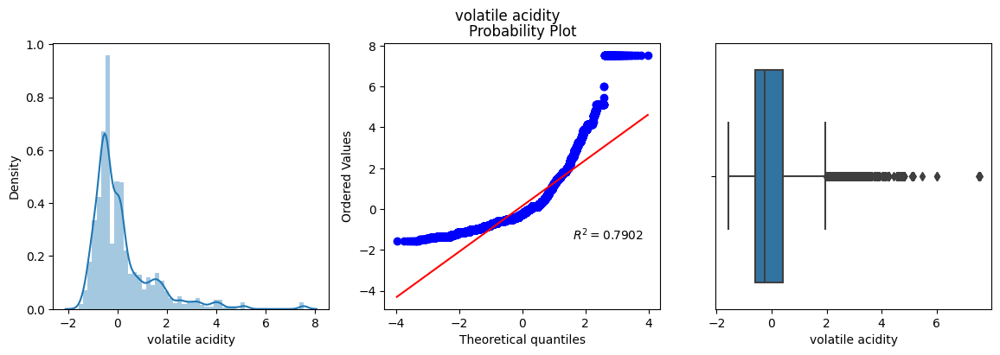

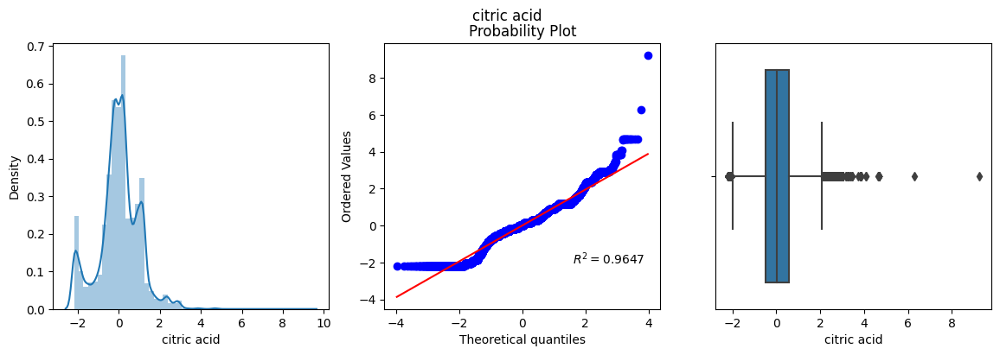

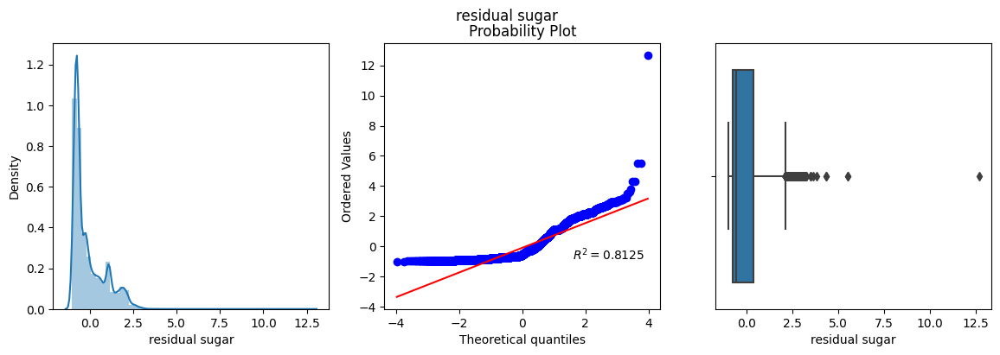

...

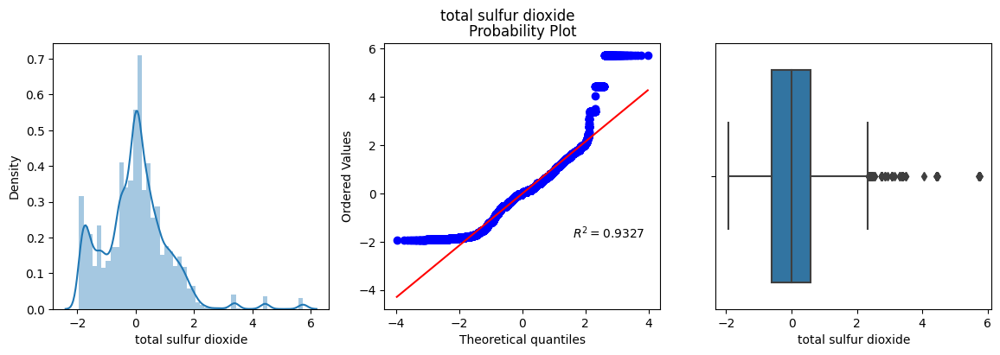

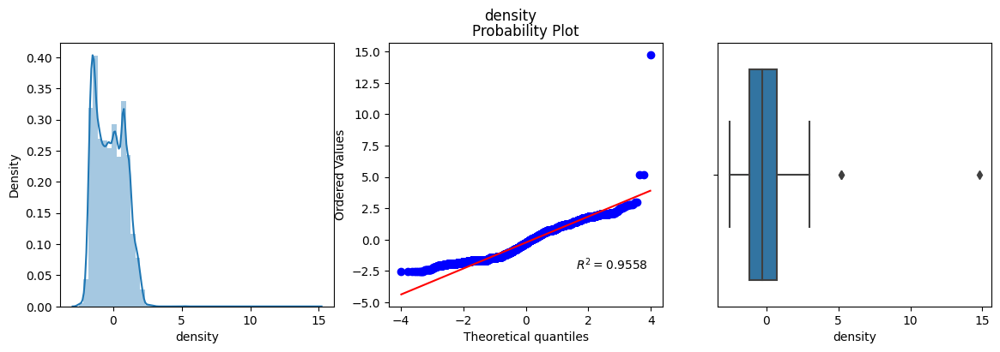

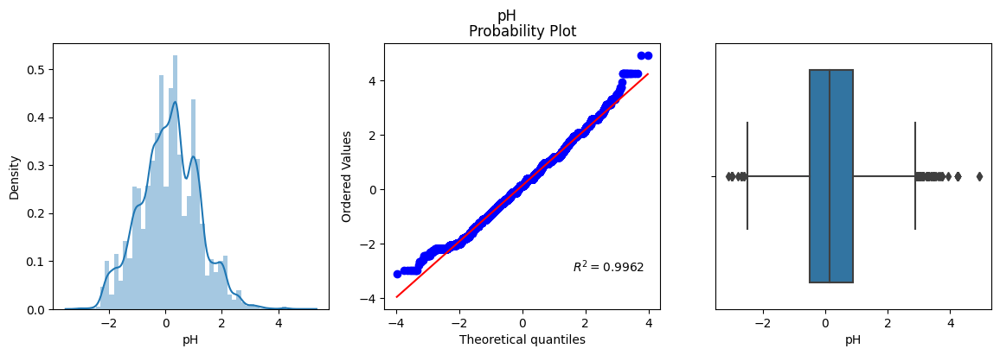

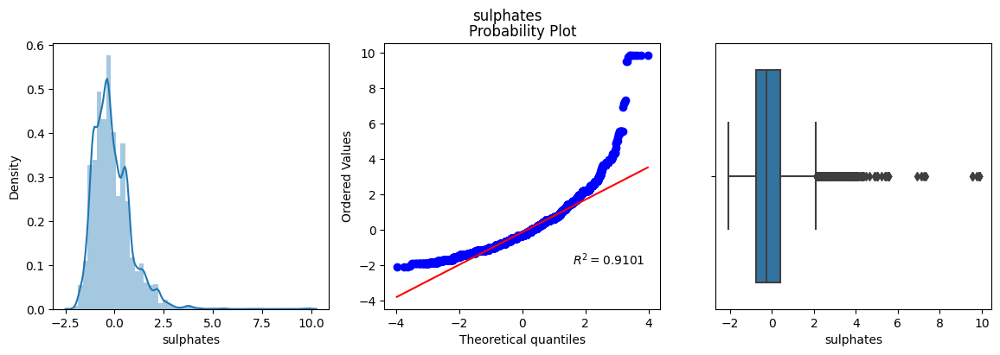

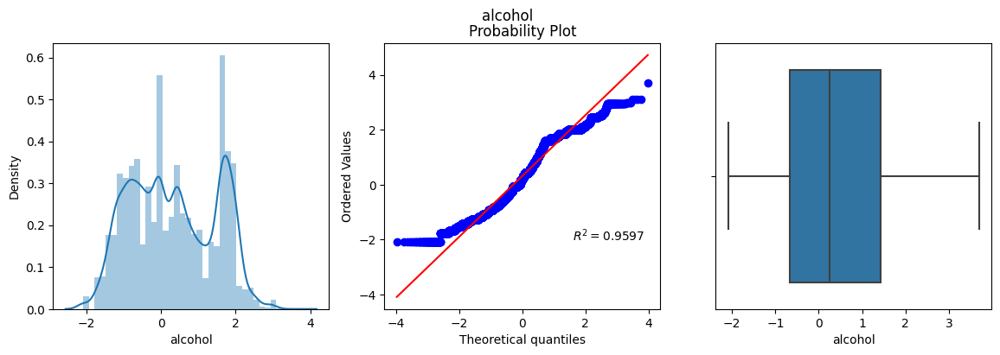

In [43]:
for col in X.columns:
    plt.figure(figsize=(14,4))
    plt.subplot(131)
    sns.distplot(X[col])
    plt.subplot(132)
    probplot(X[col],rvalue=True,plot=plt,dist='norm')
    plt.subplot(133)
    sns.boxplot(X[col])
    plt.suptitle(col)
    plt.show();

### Treatment of Outliers

In [44]:
def impute_outliers(col):
    Q1, Q3 = X[col].quantile([0.25,0.75])
    IQR = Q3 - Q1
    lower_whisker = Q1 - 1.5 * IQR
    upper_whisker = Q3 + 1.5 * IQR
    return np.where(X[col]>upper_whisker,upper_whisker,np.where(X[col]<lower_whisker,lower_whisker,X[col]))

In [45]:
for col in X.columns:
    if col != 'type':
        X[col] = impute_outliers(col)

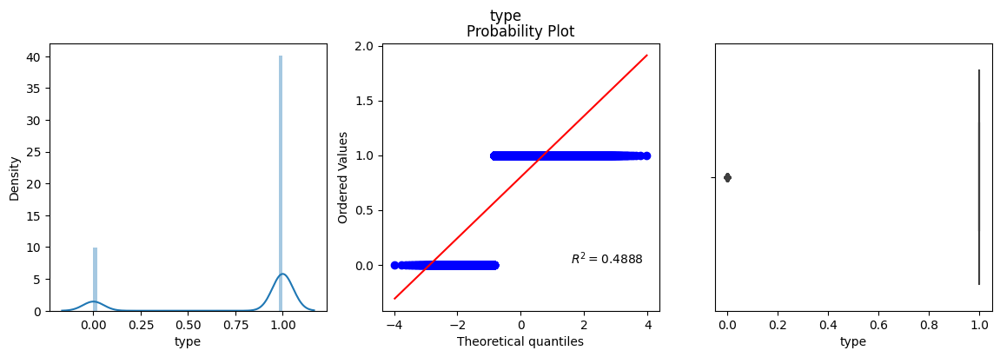

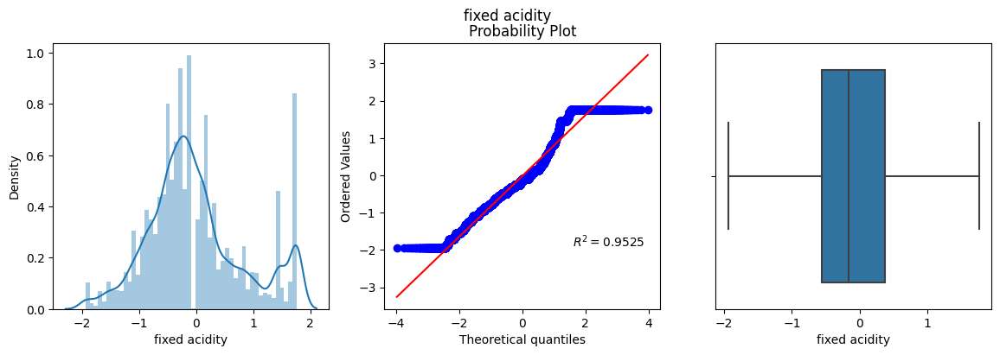

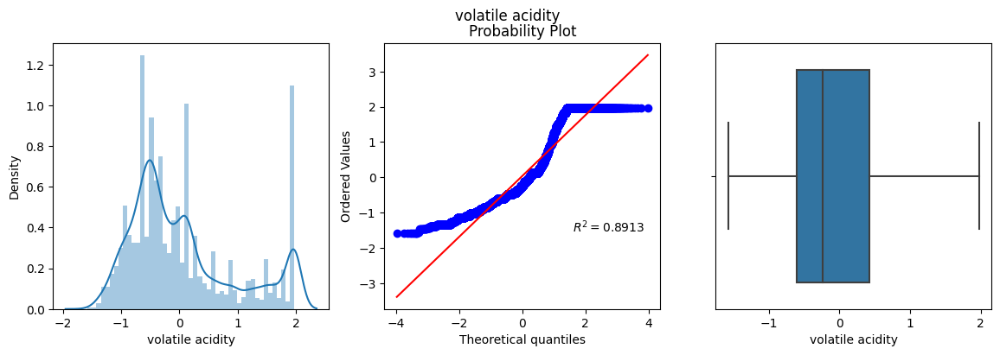

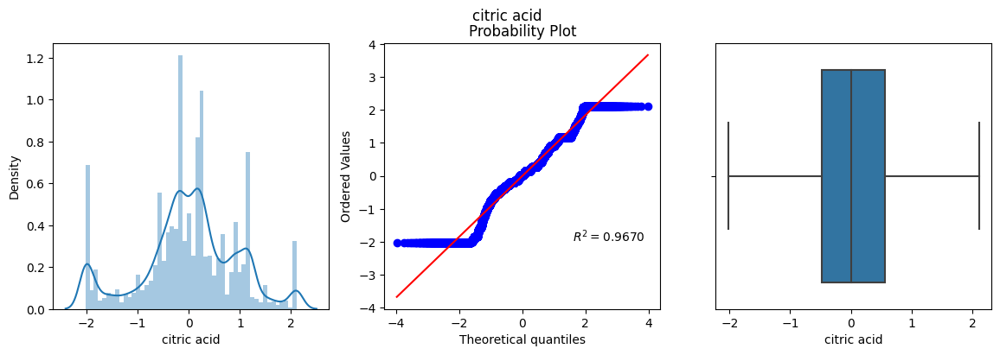

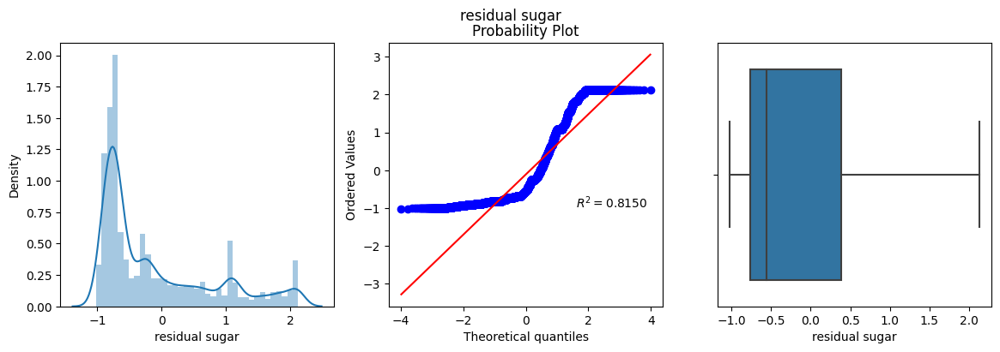

...

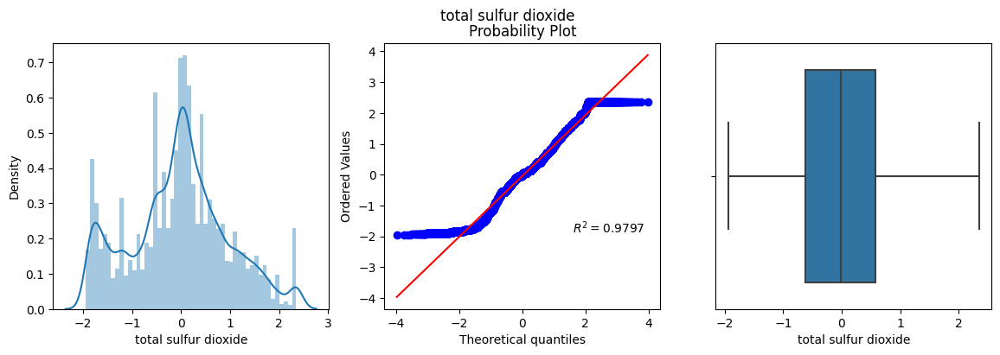

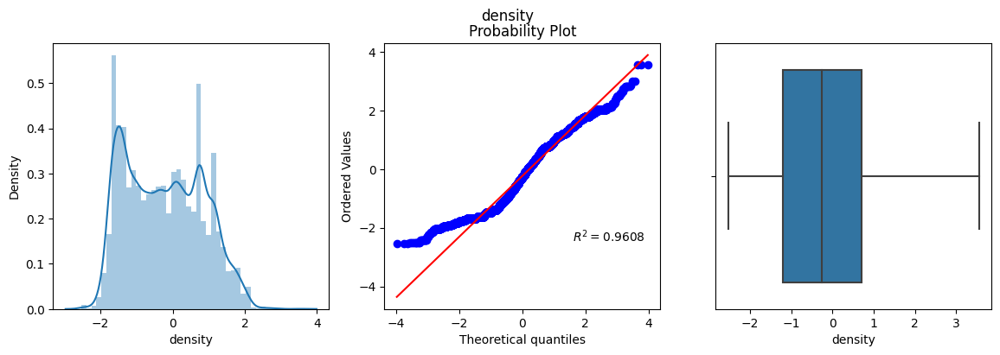

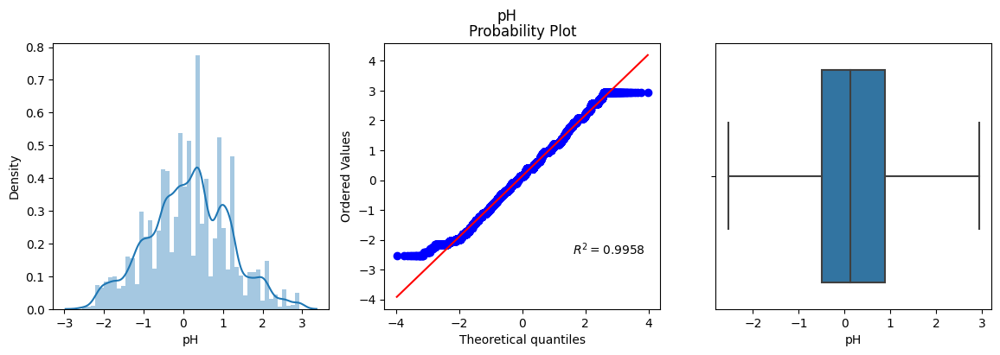

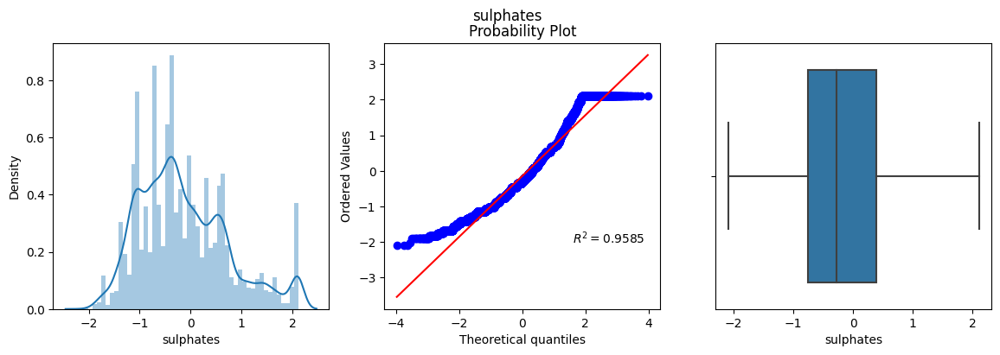

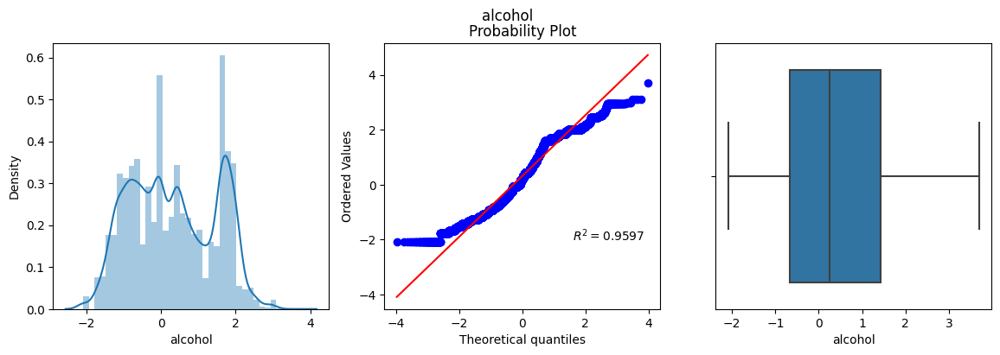

In [46]:
for col in X.columns:
    plt.figure(figsize=(14,4))
    plt.subplot(131)
    sns.distplot(X[col])
    plt.subplot(132)
    probplot(X[col],rvalue=True,plot=plt,dist='norm')
    plt.subplot(133)
    sns.boxplot(X[col])
    plt.suptitle(col)
    plt.show();

All the harmful outliers have been imputed with the extreme values and hence the skewness of the distributions of features has got reduced.

### Dividing the dataset into training and test sets

In [47]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.3,random_state=101)

### Log Transform

In [48]:
log_cols = ['fixed acidity','residual sugar','free sulfur dioxide','density','alcohol']
log_transform = FunctionTransformer(np.log1p)

for col in log_cols:
    X_train[col] = log_transform.fit_transform(X_train[col])
    X_test[col] = log_transform.transform(X_test[col])

### Square-Root Transform

In [49]:
sqrt_cols = ['volatile acidity','chlorides','citric acid']
sqrt_transform = FunctionTransformer(np.sqrt)

for col in sqrt_cols:
    X_train[col] = sqrt_transform.fit_transform(X_train[col])
    X_test[col] = sqrt_transform.transform(X_test[col])

### Reciprocal Transform

In [50]:
recp_cols = ['pH','sulphates']
reciprocal_transform = FunctionTransformer(lambda x: 1/(x+0.0000001))

for col in recp_cols:
    X_train[col] = reciprocal_transform.fit_transform(X_train[col])
    X_test[col] = reciprocal_transform.transform(X_test[col])

### Imputing the missing values of numerical features 

In [51]:
for col in numerical_features:
    X_train[col] = numerical_transformer.fit_transform(X_train[[col]])
    X_test[col] = numerical_transformer.transform(X_test[[col]])

### Imputing the missing values of categorical features

In [52]:
for col in categorical_features:
    X_train[col] = categorical_transformer.fit_transform(X_train[[col]])
    X_test[col] = categorical_transformer.transform(X_test[[col]])

In [53]:
# Encoding the target label classes
encoded_classes = dict()

for idx, quality in enumerate(df.quality.unique()):
    encoded_classes[quality] = idx

encoded_classes

{6: 0, 5: 1, 7: 2, 8: 3, 4: 4, 3: 5, 9: 6}

In [54]:
y_train = y_train.map(encoded_classes)
y_test = y_test.map(encoded_classes)

### Feature Selection

In [55]:
kbest = SelectKBest(score_func=f_classif,k=6)
kbest.fit(X_train,y_train)

SelectKBest(k=6)

In [56]:
selected_features = kbest.get_feature_names_out()
selected_features

array(['type', 'fixed acidity', 'volatile acidity', 'residual sugar',
       'density', 'alcohol'], dtype=object)

In [57]:
selected_subset_X_train = X_train[selected_features]
selected_subset_X_train.head()

,type,fixed acidity,volatile acidity,residual sugar,density,alcohol
18008,1.0,1.343785,0.016829,1.221538,0.570053,-0.125455
19775,1.0,-0.169584,-1.759991,0.318156,0.238302,0.786957
16538,1.0,0.069237,0.016829,-0.682560,0.238302,0.538302
11482,0.0,0.858424,1.961120,-0.257806,0.749066,-1.174846
11005,0.0,1.496090,1.961120,0.093140,1.163379,0.357866


In [58]:
lr = LogisticRegression()
lr.fit(selected_subset_X_train,y_train)

LogisticRegression()

In [59]:
lr_pred = lr.predict(X_test[selected_features])
print(classification_report(y_test,lr_pred))

              precision    recall  f1-score   support

           0       0.25      0.11      0.15       897
           1       0.39      0.34      0.36       837
           2       0.28      0.23      0.25       847
           3       0.41      0.47      0.44       866
           4       0.30      0.24      0.26       842
           5       0.42      0.49      0.46       848
           6       0.54      1.00      0.70       819

    accuracy                           0.41      5956
   macro avg       0.37      0.41      0.38      5956
weighted avg       0.37      0.41      0.37      5956



In [60]:
percentile = SelectPercentile(score_func=f_classif,percentile=30)
percentile.fit(X_train,y_train)

SelectPercentile(percentile=30)

In [61]:
selected_features = percentile.get_feature_names_out()
selected_features

array(['type', 'volatile acidity', 'density', 'alcohol'], dtype=object)

In [62]:
selected_subset_X_train = X_train[selected_features]
selected_subset_X_test = X_test[selected_features]

In [63]:
lr.fit(selected_subset_X_train,y_train)
lr_pred = lr.predict(selected_subset_X_test)
print(classification_report(y_test,lr_pred))

              precision    recall  f1-score   support

           0       0.27      0.03      0.06       897
           1       0.36      0.36      0.36       837
           2       0.23      0.23      0.23       847
           3       0.36      0.26      0.30       866
           4       0.23      0.17      0.20       842
           5       0.35      0.45      0.39       848
           6       0.36      0.82      0.50       819

    accuracy                           0.33      5956
   macro avg       0.31      0.33      0.29      5956
weighted avg       0.31      0.33      0.29      5956



In [64]:
sfm = SelectFromModel(estimator=RandomForestClassifier())
sfm.fit(X_train,y_train)

SelectFromModel(estimator=RandomForestClassifier())

In [65]:
selected_features = sfm.get_feature_names_out()
selected_features

array(['fixed acidity', 'residual sugar', 'free sulfur dioxide',
       'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol'],
      dtype=object)

In [66]:
selected_subset_X_train = X_train[selected_features]
selected_subset_X_test = X_test[selected_features]

In [67]:
lr.fit(selected_subset_X_train,y_train)
lr_pred = lr.predict(selected_subset_X_test)
print(classification_report(y_test,lr_pred))

              precision    recall  f1-score   support

           0       0.22      0.09      0.13       897
           1       0.40      0.30      0.34       837
           2       0.24      0.17      0.20       847
           3       0.38      0.36      0.37       866
           4       0.27      0.27      0.27       842
           5       0.21      0.26      0.24       848
           6       0.41      0.82      0.55       819

    accuracy                           0.32      5956
   macro avg       0.30      0.33      0.30      5956
weighted avg       0.30      0.32      0.30      5956



In [68]:
rfe = RFECV(estimator=RandomForestClassifier(),verbose=1)
rfe.fit(X_train,y_train)

Fitting estimator with 12 features.
Fitting estimator with 11 features.
Fitting estimator with 10 features.
Fitting estimator with 9 features.
Fitting estimator with 8 features.
Fitting estimator with 7 features.
Fitting estimator with 6 features.
Fitting estimator with 5 features.
Fitting estimator with 4 features.
Fitting estimator with 3 features.
Fitting estimator with 2 features.
Fitting estimator with 12 features.
Fitting estimator with 11 features.
Fitting estimator with 10 features.
Fitting estimator with 9 features.
Fitting estimator with 8 features.
Fitting estimator with 7 features.
Fitting estimator with 6 features.
Fitting estimator with 5 features.
Fitting estimator with 4 features.
Fitting estimator with 3 features.
Fitting estimator with 2 features.
Fitting estimator with 12 features.
Fitting estimator with 11 features.
Fitting estimator with 10 features.
Fitting estimator with 9 features.
Fitting estimator with 8 features.
Fitting estimator with 7 features.
Fitting est

RFECV(estimator=RandomForestClassifier(), verbose=1)

In [69]:
selected_features = rfe.get_feature_names_out()
selected_features

array(['type', 'fixed acidity', 'volatile acidity', 'citric acid',
       'residual sugar', 'chlorides', 'free sulfur dioxide',
       'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol'],
      dtype=object)

In [70]:
selected_subset_X_train = X_train[selected_features]
selected_subset_X_test = X_test[selected_features]

In [71]:
lr.fit(selected_subset_X_train,y_train)
lr_pred = lr.predict(selected_subset_X_test)
print(classification_report(y_test,lr_pred))

              precision    recall  f1-score   support

           0       0.30      0.11      0.16       897
           1       0.35      0.37      0.36       837
           2       0.32      0.24      0.27       847
           3       0.46      0.47      0.46       866
           4       0.31      0.30      0.30       842
           5       0.39      0.47      0.43       848
           6       0.56      1.00      0.72       819

    accuracy                           0.42      5956
   macro avg       0.39      0.42      0.39      5956
weighted avg       0.39      0.42      0.38      5956



In [72]:
rf = RandomForestClassifier()
rf.fit(selected_subset_X_train,y_train)
rf_pred = rf.predict(selected_subset_X_test)
print(classification_report(y_test,rf_pred))

              precision    recall  f1-score   support

           0       0.79      0.65      0.72       897
           1       0.78      0.84      0.81       837
           2       0.87      0.94      0.90       847
           3       1.00      1.00      1.00       866
           4       0.98      1.00      0.99       842
           5       1.00      1.00      1.00       848
           6       1.00      1.00      1.00       819

    accuracy                           0.92      5956
   macro avg       0.92      0.92      0.92      5956
weighted avg       0.92      0.92      0.91      5956



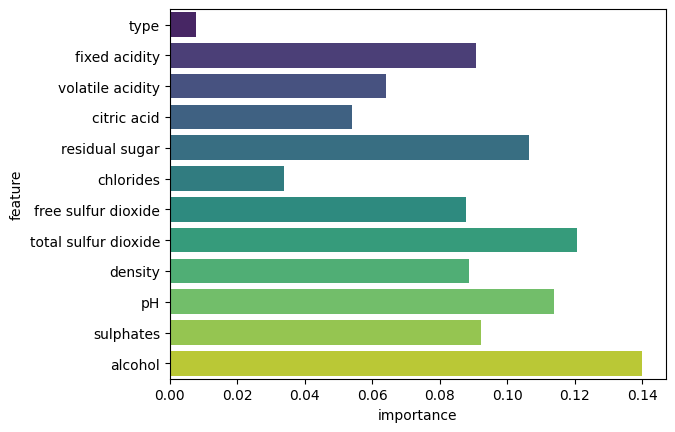

In [73]:
feat_imps = pd.DataFrame(list(zip(selected_subset_X_train.columns,rf.feature_importances_)),columns=['feature','importance'])
sns.barplot(x='importance',y='feature',data=feat_imps,palette='viridis',orient='h');

Alcohol is the most significant feature for predicting the quality of wines.

In [74]:
sfs = SequentialFeatureSelector(estimator=RandomForestClassifier(verbose=1),direction='forward',scoring='accuracy',cv=2)
sfs.fit(X_train,y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished


SequentialFeatureSelector(cv=2, estimator=RandomForestClassifier(verbose=1),
                          scoring='accuracy')

In [75]:
selected_features = sfs.get_feature_names_out()
selected_features

array(['residual sugar', 'free sulfur dioxide', 'total sulfur dioxide',
       'density', 'sulphates', 'alcohol'], dtype=object)

In [76]:
selected_subset_X_train = X_train[selected_features]
selected_subset_X_test = X_test[selected_features]

In [77]:
lr.fit(selected_subset_X_train,y_train)
lr_pred = lr.predict(selected_subset_X_test)
print(classification_report(y_test,lr_pred))

              precision    recall  f1-score   support

           0       0.17      0.08      0.11       897
           1       0.38      0.31      0.34       837
           2       0.22      0.15      0.17       847
           3       0.32      0.24      0.27       866
           4       0.33      0.34      0.34       842
           5       0.28      0.27      0.28       848
           6       0.35      0.82      0.49       819

    accuracy                           0.31      5956
   macro avg       0.29      0.32      0.29      5956
weighted avg       0.29      0.31      0.28      5956



In [78]:
sfm = SelectFromModel(LassoCV())
sfm.fit(X_train,y_train)

SelectFromModel(estimator=LassoCV())

In [79]:
selected_features = sfm.get_feature_names_out()
selected_features

array(['type', 'fixed acidity', 'volatile acidity', 'citric acid',
       'residual sugar', 'chlorides', 'free sulfur dioxide',
       'total sulfur dioxide', 'density', 'pH', 'sulphates', 'alcohol'],
      dtype=object)

In [80]:
selected_subset_X_train = X_train[selected_features]
selected_subset_X_test = X_test[selected_features]

In [81]:
lr.fit(selected_subset_X_train,y_train)
lr_pred = lr.predict(selected_subset_X_test)
print(classification_report(y_test,lr_pred))

              precision    recall  f1-score   support

           0       0.30      0.11      0.16       897
           1       0.35      0.37      0.36       837
           2       0.32      0.24      0.27       847
           3       0.46      0.47      0.46       866
           4       0.31      0.30      0.30       842
           5       0.39      0.47      0.43       848
           6       0.56      1.00      0.72       819

    accuracy                           0.42      5956
   macro avg       0.39      0.42      0.39      5956
weighted avg       0.39      0.42      0.38      5956



              precision    recall  f1-score   support

           0       0.79      0.67      0.73       897
           1       0.78      0.84      0.81       837
           2       0.88      0.94      0.91       847
           3       1.00      1.00      1.00       866
           4       0.98      1.00      0.99       842
           5       1.00      1.00      1.00       848
           6       1.00      1.00      1.00       819

    accuracy                           0.92      5956
   macro avg       0.92      0.92      0.92      5956
weighted avg       0.92      0.92      0.92      5956



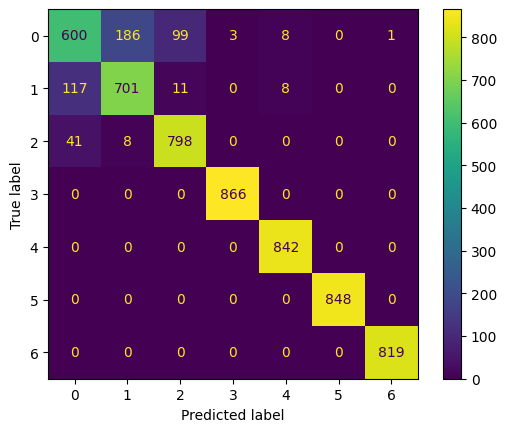

In [82]:
rf.fit(selected_subset_X_train,y_train)
rf_pred = rf.predict(selected_subset_X_test)
print(classification_report(y_test,rf_pred))
ConfusionMatrixDisplay.from_predictions(y_test,rf_pred)
plt.show();

In [83]:
final_selected_features = ['fixed acidity','density','pH','alcohol','free sulfur dioxide','total sulfur dioxide','sulphates']
rf.fit(X_train[final_selected_features],y_train)
rf_pred = rf.predict(X_test[final_selected_features])
print(classification_report(y_test,rf_pred))

              precision    recall  f1-score   support

           0       0.77      0.63      0.70       897
           1       0.78      0.82      0.80       837
           2       0.86      0.94      0.90       847
           3       0.99      1.00      1.00       866
           4       0.97      1.00      0.98       842
           5       1.00      1.00      1.00       848
           6       1.00      1.00      1.00       819

    accuracy                           0.91      5956
   macro avg       0.91      0.91      0.91      5956
weighted avg       0.91      0.91      0.91      5956



In [84]:
lr.fit(X_train[final_selected_features],y_train)
lr_pred = lr.predict(X_test[final_selected_features])
print(classification_report(y_test,lr_pred))

              precision    recall  f1-score   support

           0       0.22      0.07      0.11       897
           1       0.40      0.34      0.36       837
           2       0.22      0.18      0.20       847
           3       0.42      0.33      0.37       866
           4       0.23      0.21      0.22       842
           5       0.23      0.32      0.27       848
           6       0.41      0.82      0.54       819

    accuracy                           0.32      5956
   macro avg       0.30      0.32      0.30      5956
weighted avg       0.30      0.32      0.29      5956



In [85]:
X_train_fn = X_train[final_selected_features]
X_test_fn = X_test[final_selected_features]

## Model Training & Evaluation

In [86]:
models = []
accuracy_scores = []

In [87]:
# Custom function for fitting and evaluating the performance of each machine learning algorithm
def train_and_evaluate_model(model):
    model.fit(X_train_fn,y_train)
    pred = model.predict(X_test_fn)
    print(confusion_matrix(y_test,pred))
    print(classification_report(y_test,pred))
    models.append(model)
    accuracy_scores.append(accuracy_score(y_test,pred))
    ConfusionMatrixDisplay.from_predictions(y_test,pred)
    plt.show()

### Logistic Regression

[[ 67 145 131  94 141 194 125]
 [ 67 282  79  25 152 178  54]
 [ 39  41 155 183  57 108 264]
 [ 21  17  95 286  49  84 314]
 [ 59 154 169  46 173 175  66]
 [ 55  73  84  42 165 273 156]
 [  0   0   0   0   0 150 669]]
              precision    recall  f1-score   support

           0       0.22      0.07      0.11       897
           1       0.40      0.34      0.36       837
           2       0.22      0.18      0.20       847
           3       0.42      0.33      0.37       866
           4       0.23      0.21      0.22       842
           5       0.23      0.32      0.27       848
           6       0.41      0.82      0.54       819

    accuracy                           0.32      5956
   macro avg       0.30      0.32      0.30      5956
weighted avg       0.30      0.32      0.29      5956



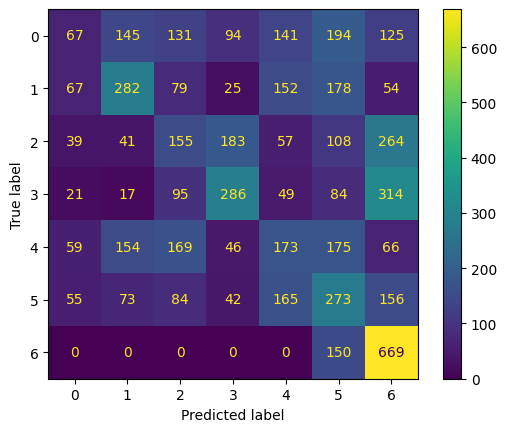

In [88]:
train_and_evaluate_model(LogisticRegression())

### K Nearest Neighbors Classifier

[[340 192 229  48  80   8   0]
 [183 504  68  17  60   5   0]
 [112  33 628  53  20   1   0]
 [  0   0   0 866   0   0   0]
 [  0   0   0   0 842   0   0]
 [  0   0   0   0   0 848   0]
 [  0   0   0   0   0   0 819]]
              precision    recall  f1-score   support

           0       0.54      0.38      0.44       897
           1       0.69      0.60      0.64       837
           2       0.68      0.74      0.71       847
           3       0.88      1.00      0.94       866
           4       0.84      1.00      0.91       842
           5       0.98      1.00      0.99       848
           6       1.00      1.00      1.00       819

    accuracy                           0.81      5956
   macro avg       0.80      0.82      0.81      5956
weighted avg       0.80      0.81      0.80      5956



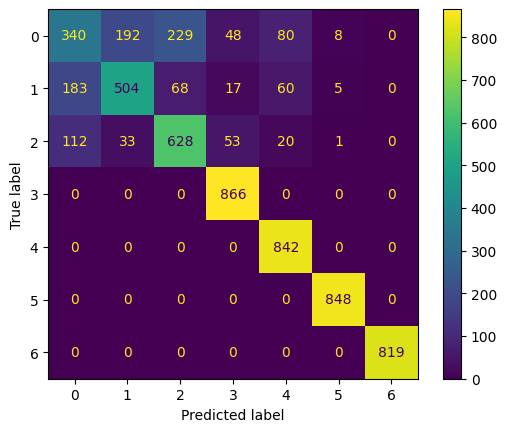

In [89]:
train_and_evaluate_model(KNeighborsClassifier())

### Support Vector Classifier

[[154 211 138 165 140  70  19]
 [ 93 409  65  68 115  83   4]
 [ 84  58 288 239  85  27  66]
 [ 25  11 106 563  23  17 121]
 [ 43  95  91  67 460  86   0]
 [  0   0  83  34   0 731   0]
 [  0   0   0   0   0   0 819]]
              precision    recall  f1-score   support

           0       0.39      0.17      0.24       897
           1       0.52      0.49      0.50       837
           2       0.37      0.34      0.36       847
           3       0.50      0.65      0.56       866
           4       0.56      0.55      0.55       842
           5       0.72      0.86      0.79       848
           6       0.80      1.00      0.89       819

    accuracy                           0.57      5956
   macro avg       0.55      0.58      0.55      5956
weighted avg       0.55      0.57      0.55      5956



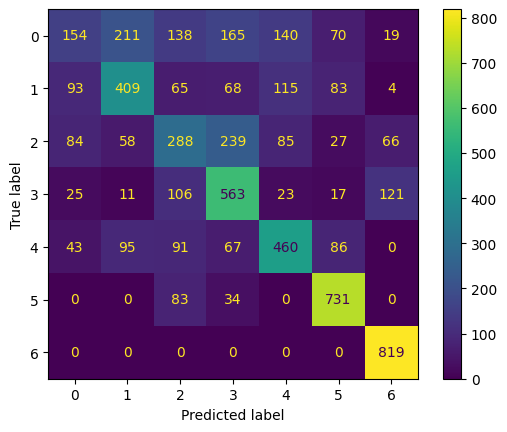

In [90]:
train_and_evaluate_model(SVC())

### Linear Support Vector Classifier

[[ 12 231  94 118 130 115 197]
 [ 26 365  61  46 123 112 104]
 [  2  67 104 176  71  62 365]
 [  0  22  56 235  60  46 447]
 [ 28 202 136  57 166 132 121]
 [  0 172  66  42 141 227 200]
 [  0   0   0   0   0 150 669]]
              precision    recall  f1-score   support

           0       0.18      0.01      0.02       897
           1       0.34      0.44      0.39       837
           2       0.20      0.12      0.15       847
           3       0.35      0.27      0.31       866
           4       0.24      0.20      0.22       842
           5       0.27      0.27      0.27       848
           6       0.32      0.82      0.46       819

    accuracy                           0.30      5956
   macro avg       0.27      0.30      0.26      5956
weighted avg       0.27      0.30      0.26      5956



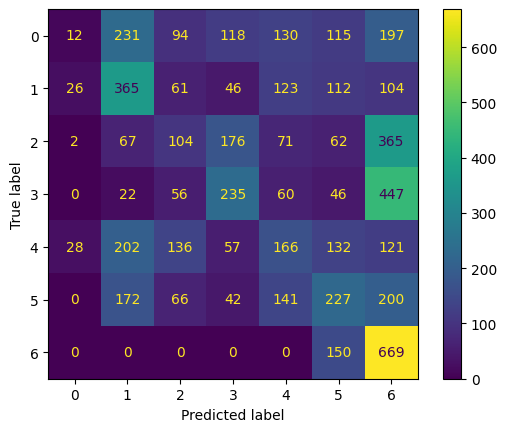

In [91]:
train_and_evaluate_model(LinearSVC())

### Gaussian Naive Bayes

[[ 23  82  33 108  52 479 120]
 [ 30 145  25  57  92 441  47]
 [ 14  25  25 166  31 323 263]
 [ 10  10  11 191  48 284 312]
 [ 31  69  37  58  85 489  73]
 [  0  31  29  48   0 626 114]
 [  0   0   0   0   0   0 819]]
              precision    recall  f1-score   support

           0       0.21      0.03      0.05       897
           1       0.40      0.17      0.24       837
           2       0.16      0.03      0.05       847
           3       0.30      0.22      0.26       866
           4       0.28      0.10      0.15       842
           5       0.24      0.74      0.36       848
           6       0.47      1.00      0.64       819

    accuracy                           0.32      5956
   macro avg       0.29      0.33      0.25      5956
weighted avg       0.29      0.32      0.24      5956



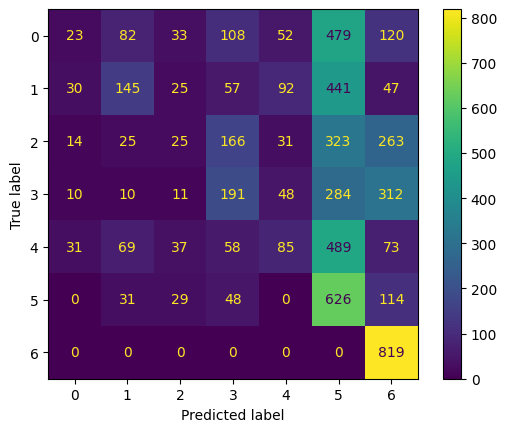

In [92]:
train_and_evaluate_model(GaussianNB())

### Bernoulli Naive Bayes

[[  0 218  75 223  89 110 182]
 [  0 263  48 116 143 133 134]
 [  0  75  86 263  43 102 278]
 [  0  32  87 402  45  58 242]
 [  0 163  70 126 197 152 134]
 [  0 157  27 220 133 192 119]
 [  0 150   0   0   0 169 500]]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       897
           1       0.25      0.31      0.28       837
           2       0.22      0.10      0.14       847
           3       0.30      0.46      0.36       866
           4       0.30      0.23      0.26       842
           5       0.21      0.23      0.22       848
           6       0.31      0.61      0.42       819

    accuracy                           0.28      5956
   macro avg       0.23      0.28      0.24      5956
weighted avg       0.23      0.28      0.24      5956



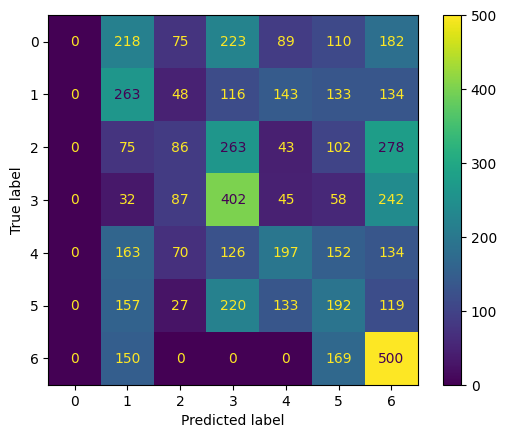

In [93]:
train_and_evaluate_model(BernoulliNB())

### Ridge Classifier

[[  8 224  72 133 130  63 267]
 [  7 362  32  67 118  71 180]
 [  5  55  99 161  74  45 408]
 [  4  17  78 222  63  27 455]
 [ 14 197 106  87 164  94 180]
 [  0 172  43  65 141 135 292]
 [  0   0   0   0   0 150 669]]
              precision    recall  f1-score   support

           0       0.21      0.01      0.02       897
           1       0.35      0.43      0.39       837
           2       0.23      0.12      0.16       847
           3       0.30      0.26      0.28       866
           4       0.24      0.19      0.21       842
           5       0.23      0.16      0.19       848
           6       0.27      0.82      0.41       819

    accuracy                           0.28      5956
   macro avg       0.26      0.28      0.24      5956
weighted avg       0.26      0.28      0.23      5956



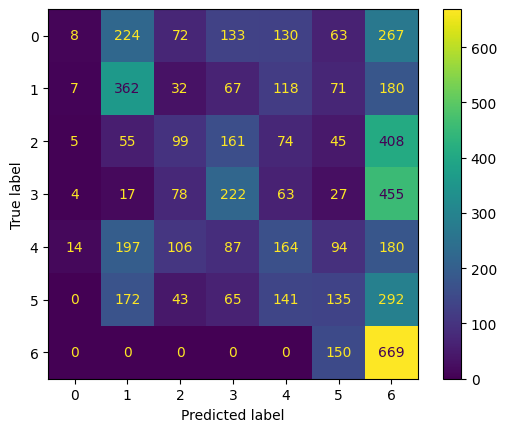

In [94]:
train_and_evaluate_model(RidgeClassifier())

### Stochastic Gradient Descent Classifier

[[ 34 290 167 119  44  55 188]
 [ 24 410  83  80  92  46 102]
 [ 52  88 202 158  20  40 287]
 [ 55  43 237 121  10   3 397]
 [ 43 299 134 123  68  96  79]
 [  0 134  65 116 181  34 318]
 [  0   0   0 156   0   0 663]]
              precision    recall  f1-score   support

           0       0.16      0.04      0.06       897
           1       0.32      0.49      0.39       837
           2       0.23      0.24      0.23       847
           3       0.14      0.14      0.14       866
           4       0.16      0.08      0.11       842
           5       0.12      0.04      0.06       848
           6       0.33      0.81      0.46       819

    accuracy                           0.26      5956
   macro avg       0.21      0.26      0.21      5956
weighted avg       0.21      0.26      0.21      5956



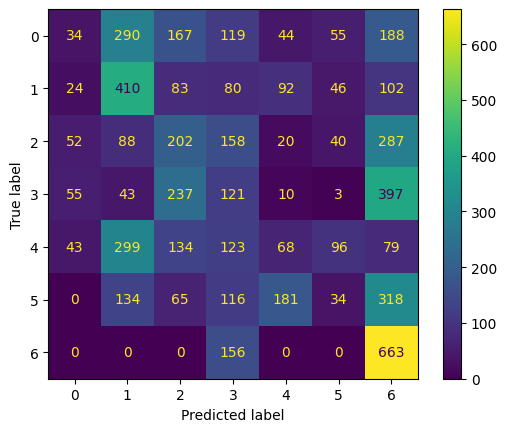

In [95]:
train_and_evaluate_model(SGDClassifier())

### Passive Aggressive Classifier

[[233 283  40  84  69 159  29]
 [181 336  24  51  83 160   2]
 [254 202  64  97  20 122  88]
 [288 115  45 119   0 152 147]
 [234 326  52  65  26 139   0]
 [281 165  91  54  31 226   0]
 [172   0   0 156   0 322 169]]
              precision    recall  f1-score   support

           0       0.14      0.26      0.18       897
           1       0.24      0.40      0.30       837
           2       0.20      0.08      0.11       847
           3       0.19      0.14      0.16       866
           4       0.11      0.03      0.05       842
           5       0.18      0.27      0.21       848
           6       0.39      0.21      0.27       819

    accuracy                           0.20      5956
   macro avg       0.21      0.20      0.18      5956
weighted avg       0.21      0.20      0.18      5956



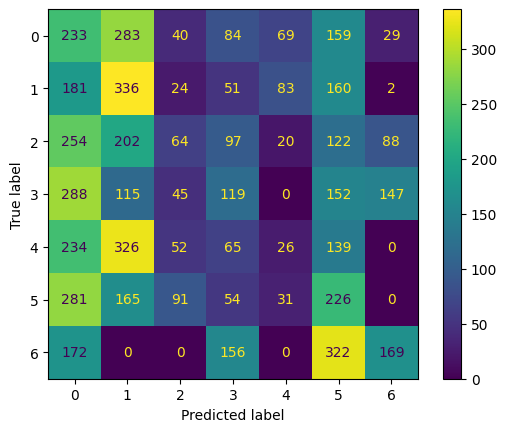

In [96]:
train_and_evaluate_model(PassiveAggressiveClassifier())

### Decision Tree Classifier

[[528 194 132  17  23   3   0]
 [142 614  34   7  35   3   2]
 [ 39  10 785   5   6   1   1]
 [  0   0   0 866   0   0   0]
 [  0   0   0   0 842   0   0]
 [  0   0   0   0   0 848   0]
 [  0   0   0   0   0   0 819]]
              precision    recall  f1-score   support

           0       0.74      0.59      0.66       897
           1       0.75      0.73      0.74       837
           2       0.83      0.93      0.87       847
           3       0.97      1.00      0.98       866
           4       0.93      1.00      0.96       842
           5       0.99      1.00      1.00       848
           6       1.00      1.00      1.00       819

    accuracy                           0.89      5956
   macro avg       0.89      0.89      0.89      5956
weighted avg       0.89      0.89      0.89      5956



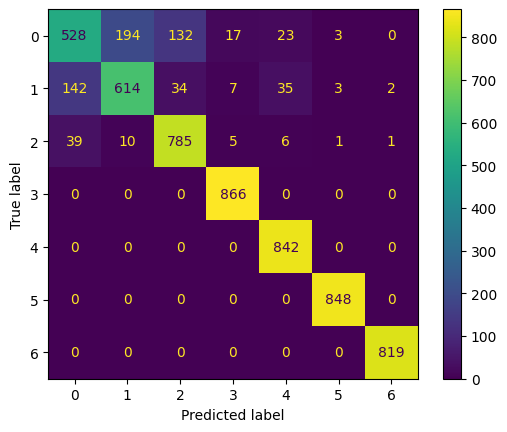

In [97]:
train_and_evaluate_model(DecisionTreeClassifier())

### Random Forest Classifier

[[574 191 115   5  12   0   0]
 [117 694  11   0  14   1   0]
 [ 40  13 792   1   1   0   0]
 [  0   0   0 866   0   0   0]
 [  0   0   0   0 842   0   0]
 [  0   0   0   0   0 848   0]
 [  0   0   0   0   0   0 819]]
              precision    recall  f1-score   support

           0       0.79      0.64      0.71       897
           1       0.77      0.83      0.80       837
           2       0.86      0.94      0.90       847
           3       0.99      1.00      1.00       866
           4       0.97      1.00      0.98       842
           5       1.00      1.00      1.00       848
           6       1.00      1.00      1.00       819

    accuracy                           0.91      5956
   macro avg       0.91      0.91      0.91      5956
weighted avg       0.91      0.91      0.91      5956



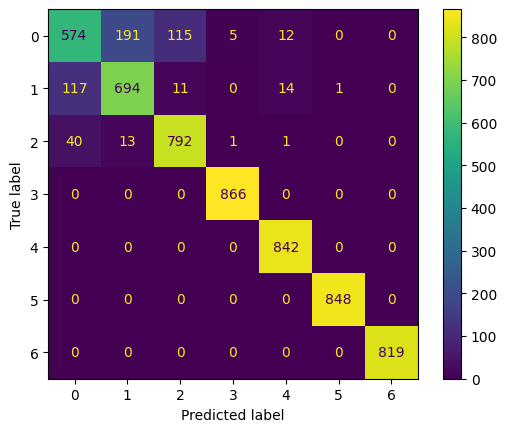

In [98]:
train_and_evaluate_model(RandomForestClassifier())

### Extra Trees Classifier

[[643 171  78   0   5   0   0]
 [153 671   9   0   4   0   0]
 [ 62   7 777   0   1   0   0]
 [  0   0   0 866   0   0   0]
 [  0   0   0   0 842   0   0]
 [  0   0   0   0   0 848   0]
 [  0   0   0   0   0   0 819]]
              precision    recall  f1-score   support

           0       0.75      0.72      0.73       897
           1       0.79      0.80      0.80       837
           2       0.90      0.92      0.91       847
           3       1.00      1.00      1.00       866
           4       0.99      1.00      0.99       842
           5       1.00      1.00      1.00       848
           6       1.00      1.00      1.00       819

    accuracy                           0.92      5956
   macro avg       0.92      0.92      0.92      5956
weighted avg       0.92      0.92      0.92      5956



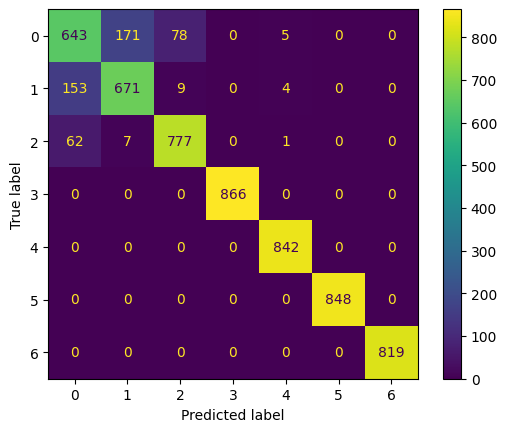

In [99]:
train_and_evaluate_model(ExtraTreesClassifier())

### eXtreme Gradient Boosting Classifier

[[547 205 121  13  11   0   0]
 [137 658  17   2  23   0   0]
 [ 61   6 775   3   2   0   0]
 [  0   0   0 866   0   0   0]
 [  0   0   0   0 842   0   0]
 [  0   0   0   0   0 848   0]
 [  0   0   0   0   0   0 819]]
              precision    recall  f1-score   support

           0       0.73      0.61      0.67       897
           1       0.76      0.79      0.77       837
           2       0.85      0.91      0.88       847
           3       0.98      1.00      0.99       866
           4       0.96      1.00      0.98       842
           5       1.00      1.00      1.00       848
           6       1.00      1.00      1.00       819

    accuracy                           0.90      5956
   macro avg       0.90      0.90      0.90      5956
weighted avg       0.90      0.90      0.90      5956



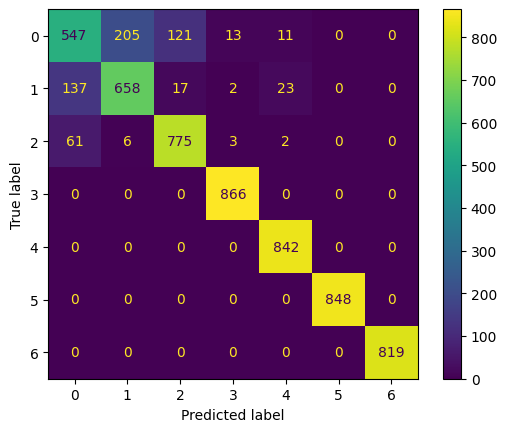

In [100]:
train_and_evaluate_model(XGBClassifier())

### Categorical Boosting Classifier

[[454 236 157  18  29   1   2]
 [130 635  39   2  31   0   0]
 [ 65  15 747  19   1   0   0]
 [  0   0   0 866   0   0   0]
 [  0   0   0   0 842   0   0]
 [  0   0   0   0   0 848   0]
 [  0   0   0   0   0   0 819]]
              precision    recall  f1-score   support

           0       0.70      0.51      0.59       897
           1       0.72      0.76      0.74       837
           2       0.79      0.88      0.83       847
           3       0.96      1.00      0.98       866
           4       0.93      1.00      0.97       842
           5       1.00      1.00      1.00       848
           6       1.00      1.00      1.00       819

    accuracy                           0.87      5956
   macro avg       0.87      0.88      0.87      5956
weighted avg       0.87      0.87      0.87      5956



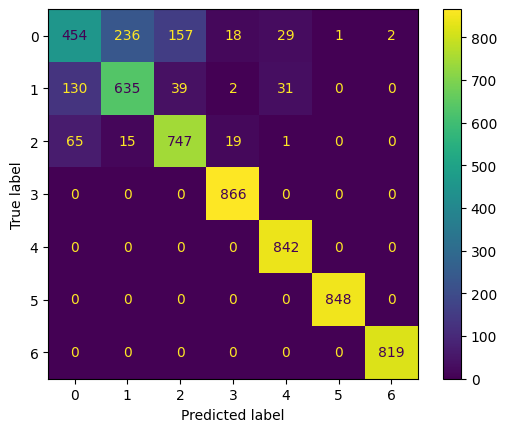

In [101]:
train_and_evaluate_model(CatBoostClassifier(silent=True))

### Light Gradient Boosting Classifier

[[492 222 144  15  21   0   3]
 [133 653  22   2  27   0   0]
 [ 66  13 755   4   8   0   1]
 [  0   0   0 866   0   0   0]
 [  0   0   0   0 842   0   0]
 [  0   0   0   0   0 848   0]
 [  0   0   0   0   0   0 819]]
              precision    recall  f1-score   support

           0       0.71      0.55      0.62       897
           1       0.74      0.78      0.76       837
           2       0.82      0.89      0.85       847
           3       0.98      1.00      0.99       866
           4       0.94      1.00      0.97       842
           5       1.00      1.00      1.00       848
           6       1.00      1.00      1.00       819

    accuracy                           0.89      5956
   macro avg       0.88      0.89      0.88      5956
weighted avg       0.88      0.89      0.88      5956



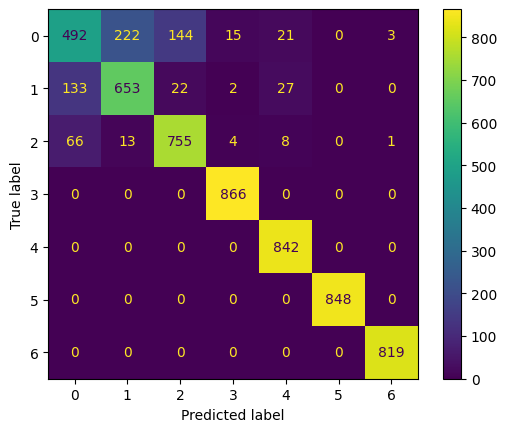

In [102]:
train_and_evaluate_model(LGBMClassifier())

### Bagging Classifier

[[556 191 115  16  14   5   0]
 [158 646  14   3  14   2   0]
 [ 43  10 786   6   0   1   1]
 [  0   0   0 866   0   0   0]
 [  0   0   0   0 842   0   0]
 [  0   0   0   0   0 848   0]
 [  0   0   0   0   0   0 819]]
              precision    recall  f1-score   support

           0       0.73      0.62      0.67       897
           1       0.76      0.77      0.77       837
           2       0.86      0.93      0.89       847
           3       0.97      1.00      0.99       866
           4       0.97      1.00      0.98       842
           5       0.99      1.00      1.00       848
           6       1.00      1.00      1.00       819

    accuracy                           0.90      5956
   macro avg       0.90      0.90      0.90      5956
weighted avg       0.90      0.90      0.90      5956



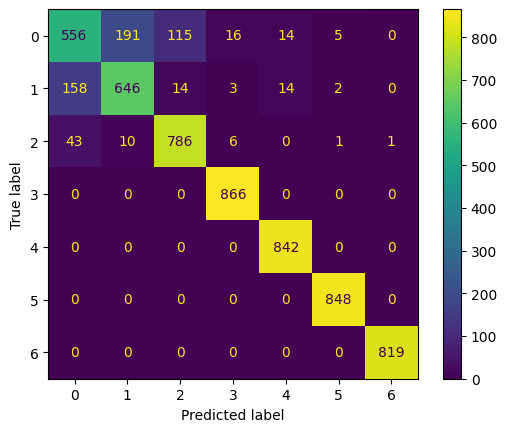

In [103]:
train_and_evaluate_model(BaggingClassifier())

### Gradient Boosting Classifier

[[256 249 183  81 114  11   3]
 [125 487  51  18 140  16   0]
 [ 88  47 548 112  46   3   3]
 [ 10   6  43 792  11   4   0]
 [ 11  43  12  18 741  17   0]
 [  0   0   0   0   0 848   0]
 [  0   0   0   0   0   0 819]]
              precision    recall  f1-score   support

           0       0.52      0.29      0.37       897
           1       0.59      0.58      0.58       837
           2       0.65      0.65      0.65       847
           3       0.78      0.91      0.84       866
           4       0.70      0.88      0.78       842
           5       0.94      1.00      0.97       848
           6       0.99      1.00      1.00       819

    accuracy                           0.75      5956
   macro avg       0.74      0.76      0.74      5956
weighted avg       0.74      0.75      0.74      5956



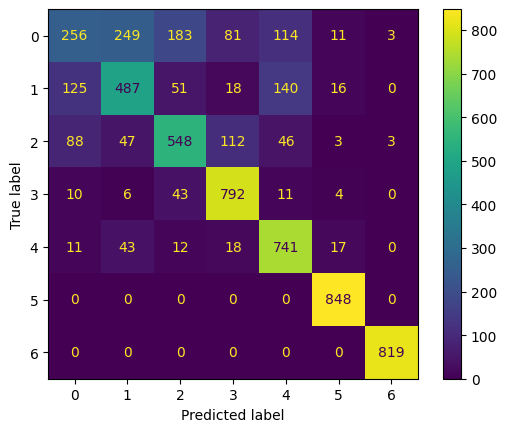

In [104]:
train_and_evaluate_model(GradientBoostingClassifier())

### Histogram Gradient Boosting Classifier

[[503 222 136  10  24   0   2]
 [139 647  19   2  30   0   0]
 [ 61   9 762  11   2   0   2]
 [  0   0   0 866   0   0   0]
 [  0   0   0   0 842   0   0]
 [  0   0   0   0   0 848   0]
 [  0   0   0   0   0   0 819]]
              precision    recall  f1-score   support

           0       0.72      0.56      0.63       897
           1       0.74      0.77      0.75       837
           2       0.83      0.90      0.86       847
           3       0.97      1.00      0.99       866
           4       0.94      1.00      0.97       842
           5       1.00      1.00      1.00       848
           6       1.00      1.00      1.00       819

    accuracy                           0.89      5956
   macro avg       0.88      0.89      0.89      5956
weighted avg       0.88      0.89      0.88      5956



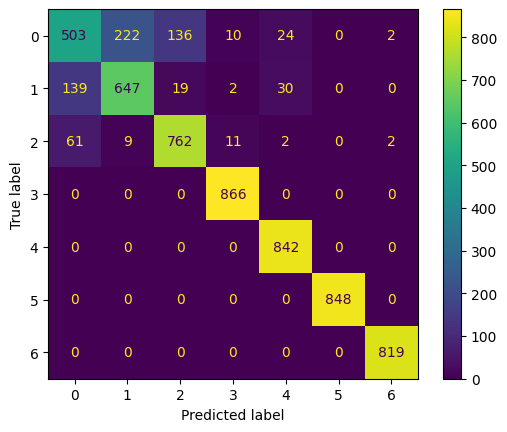

In [105]:
train_and_evaluate_model(HistGradientBoostingClassifier())

### Adaptive Boosting Classifier Model

[[245  45 168 138 170 124   7]
 [259  51  87  75 211 152   2]
 [108  57 206 248 118  79  31]
 [ 53  22 221 427  48  54  41]
 [162  43 114  70 286 167   0]
 [128  29  58  72 156 405   0]
 [  0   0   0 341   0   0 478]]
              precision    recall  f1-score   support

           0       0.26      0.27      0.26       897
           1       0.21      0.06      0.09       837
           2       0.24      0.24      0.24       847
           3       0.31      0.49      0.38       866
           4       0.29      0.34      0.31       842
           5       0.41      0.48      0.44       848
           6       0.86      0.58      0.69       819

    accuracy                           0.35      5956
   macro avg       0.37      0.35      0.35      5956
weighted avg       0.36      0.35      0.35      5956



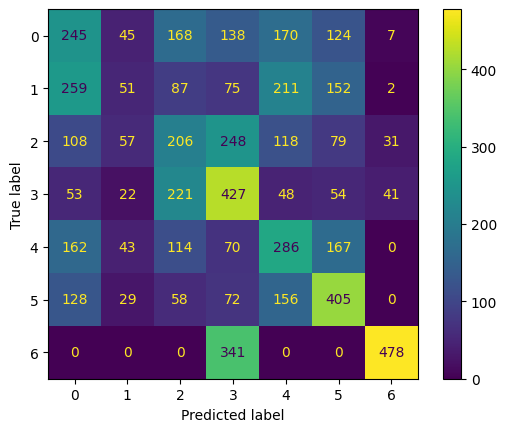

In [106]:
train_and_evaluate_model(AdaBoostClassifier())

### Multi-Layer Perceptron Classifier

[[114 274 228 104 154  22   1]
 [ 75 435  99  46 157  25   0]
 [ 45  81 429 174  95  22   1]
 [ 18  21 170 631  26   0   0]
 [ 18 109  71  33 596  15   0]
 [  0   0   0   0   0 848   0]
 [  0   0   0   0   0   0 819]]
              precision    recall  f1-score   support

           0       0.42      0.13      0.20       897
           1       0.47      0.52      0.50       837
           2       0.43      0.51      0.47       847
           3       0.64      0.73      0.68       866
           4       0.58      0.71      0.64       842
           5       0.91      1.00      0.95       848
           6       1.00      1.00      1.00       819

    accuracy                           0.65      5956
   macro avg       0.64      0.66      0.63      5956
weighted avg       0.63      0.65      0.63      5956



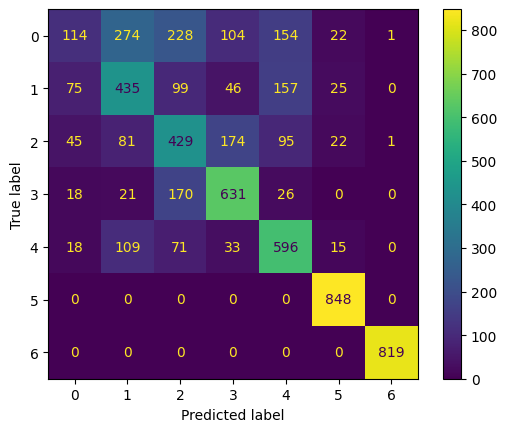

In [107]:
train_and_evaluate_model(MLPClassifier())

## Baseline Model Performance Comparison

In [108]:
model_perfs = pd.DataFrame(list(zip(models,accuracy_scores)),columns=['Model','Accuracy']).sort_values('Accuracy',ascending=False)
model_perfs

,Model,Accuracy
11,"(ExtraTreeClassifier(random_state=921570899), ...",0.917730
10,"(DecisionTreeClassifier(max_features='sqrt', r...",0.912525
15,(DecisionTreeClassifier(random_state=180063348...,0.900437
12,"XGBClassifier(base_score=None, booster=None, c...",0.899093
9,DecisionTreeClassifier(),0.890195
17,HistGradientBoostingClassifier(),0.887676
14,LGBMClassifier(),0.885662
13,<catboost.core.CatBoostClassifier object at 0x...,0.874916
1,KNeighborsClassifier(),0.813801
16,([DecisionTreeRegressor(criterion='friedman_ms...,0.754030


Among the baseline models, the Extra Trees Classifier outperforms every other model by a considerable margin, achieving a superb accuracy score of nearly 92%.

## Hyperparameter Tuning using GridSearchCV

### Random Forest Classifier

In [109]:
param_grid = {'n_estimators': [200,400,600,800,1000], 
              'criterion': ['gini','entropy'],
              'max_features': ['auto','sqrt','log2'],
              'class_weight': ['balanced','balanced_subsample']}
grid_rf = RandomizedSearchCV(RandomForestClassifier(),param_grid,verbose=2,cv=5)
grid_rf.fit(X_train_fn,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END class_weight=balanced, criterion=gini, max_features=log2, n_estimators=1000; total time=  12.6s
[CV] END class_weight=balanced, criterion=gini, max_features=log2, n_estimators=1000; total time=  12.6s
[CV] END class_weight=balanced, criterion=gini, max_features=log2, n_estimators=1000; total time=  12.6s
[CV] END class_weight=balanced, criterion=gini, max_features=log2, n_estimators=1000; total time=  12.3s
[CV] END class_weight=balanced, criterion=gini, max_features=log2, n_estimators=1000; total time=  12.5s
[CV] END class_weight=balanced, criterion=gini, max_features=auto, n_estimators=400; total time=   4.9s
[CV] END class_weight=balanced, criterion=gini, max_features=auto, n_estimators=400; total time=   4.8s
[CV] END class_weight=balanced, criterion=gini, max_features=auto, n_estimators=400; total time=   4.8s
[CV] END class_weight=balanced, criterion=gini, max_features=auto, n_estimators=400; total time=   4.8

RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(),
                   param_distributions={'class_weight': ['balanced',
                                                         'balanced_subsample'],
                                        'criterion': ['gini', 'entropy'],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000]},
                   verbose=2)

In [110]:
grid_rf.best_score_

0.8952935557275662

In [111]:
grid_rf.best_params_

{'n_estimators': 200,
 'max_features': 'sqrt',
 'criterion': 'entropy',
 'class_weight': 'balanced'}

[[577 195 109   6  10   0   0]
 [132 680  13   0  11   1   0]
 [ 51   6 789   0   1   0   0]
 [  0   0   0 866   0   0   0]
 [  0   0   0   0 842   0   0]
 [  0   0   0   0   0 848   0]
 [  0   0   0   0   0   0 819]]
              precision    recall  f1-score   support

           0       0.76      0.64      0.70       897
           1       0.77      0.81      0.79       837
           2       0.87      0.93      0.90       847
           3       0.99      1.00      1.00       866
           4       0.97      1.00      0.99       842
           5       1.00      1.00      1.00       848
           6       1.00      1.00      1.00       819

    accuracy                           0.91      5956
   macro avg       0.91      0.91      0.91      5956
weighted avg       0.91      0.91      0.91      5956



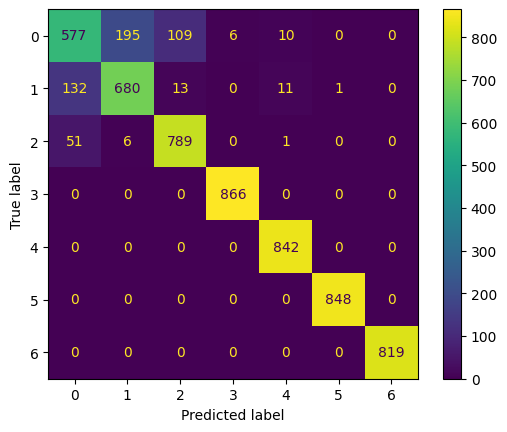

In [112]:
train_and_evaluate_model(grid_rf.best_estimator_)

### K Nearest Neighbors Classifier

In [113]:
param_grid = {'n_neighbors': [2,5,8,12,20],
              'weights': ['uniform','distance'],
              'algorithm': ['ball_tree', 'kd_tree', 'brute'],
              'metric': ['minkowski','manhattan','euclidean','chebyshev']
             }
grid_knn = RandomizedSearchCV(KNeighborsClassifier(),param_grid,cv=RepeatedStratifiedKFold(n_splits=2,n_repeats=6),verbose=2)
grid_knn.fit(X_train_fn,y_train)

Fitting 12 folds for each of 10 candidates, totalling 120 fits
[CV] END algorithm=ball_tree, metric=minkowski, n_neighbors=20, weights=uniform; total time=   0.7s
[CV] END algorithm=ball_tree, metric=minkowski, n_neighbors=20, weights=uniform; total time=   0.7s
[CV] END algorithm=ball_tree, metric=minkowski, n_neighbors=20, weights=uniform; total time=   0.7s
[CV] END algorithm=ball_tree, metric=minkowski, n_neighbors=20, weights=uniform; total time=   0.7s
[CV] END algorithm=ball_tree, metric=minkowski, n_neighbors=20, weights=uniform; total time=   0.7s
[CV] END algorithm=ball_tree, metric=minkowski, n_neighbors=20, weights=uniform; total time=   0.7s
[CV] END algorithm=ball_tree, metric=minkowski, n_neighbors=20, weights=uniform; total time=   0.7s
[CV] END algorithm=ball_tree, metric=minkowski, n_neighbors=20, weights=uniform; total time=   0.7s
[CV] END algorithm=ball_tree, metric=minkowski, n_neighbors=20, weights=uniform; total time=   0.7s
[CV] END algorithm=ball_tree, metric=

[CV] END algorithm=kd_tree, metric=chebyshev, n_neighbors=5, weights=distance; total time=   0.2s
[CV] END algorithm=kd_tree, metric=chebyshev, n_neighbors=5, weights=distance; total time=   0.2s
[CV] END algorithm=kd_tree, metric=chebyshev, n_neighbors=5, weights=distance; total time=   0.1s
[CV] END algorithm=kd_tree, metric=chebyshev, n_neighbors=5, weights=distance; total time=   0.2s
[CV] END algorithm=kd_tree, metric=chebyshev, n_neighbors=5, weights=distance; total time=   0.1s
[CV] END algorithm=kd_tree, metric=chebyshev, n_neighbors=5, weights=distance; total time=   0.2s
[CV] END algorithm=kd_tree, metric=chebyshev, n_neighbors=5, weights=distance; total time=   0.2s
[CV] END algorithm=kd_tree, metric=chebyshev, n_neighbors=5, weights=distance; total time=   0.1s
[CV] END algorithm=kd_tree, metric=chebyshev, n_neighbors=5, weights=distance; total time=   0.2s
[CV] END algorithm=kd_tree, metric=chebyshev, n_neighbors=5, weights=distance; total time=   0.1s
[CV] END algorithm=k

RandomizedSearchCV(cv=RepeatedStratifiedKFold(n_repeats=6, n_splits=2, random_state=None),
                   estimator=KNeighborsClassifier(),
                   param_distributions={'algorithm': ['ball_tree', 'kd_tree',
                                                      'brute'],
                                        'metric': ['minkowski', 'manhattan',
                                                   'euclidean', 'chebyshev'],
                                        'n_neighbors': [2, 5, 8, 12, 20],
                                        'weights': ['uniform', 'distance']},
                   verbose=2)

In [114]:
grid_knn.best_params_

{'weights': 'distance',
 'n_neighbors': 2,
 'metric': 'minkowski',
 'algorithm': 'ball_tree'}

In [115]:
grid_knn.best_score_

0.8419689119170984

[[567 163 113  22  31   1   0]
 [143 638  26   3  24   3   0]
 [ 44  14 772  13   3   1   0]
 [  0   0   0 866   0   0   0]
 [  0   0   0   0 842   0   0]
 [  0   0   0   0   0 848   0]
 [  0   0   0   0   0   0 819]]
              precision    recall  f1-score   support

           0       0.75      0.63      0.69       897
           1       0.78      0.76      0.77       837
           2       0.85      0.91      0.88       847
           3       0.96      1.00      0.98       866
           4       0.94      1.00      0.97       842
           5       0.99      1.00      1.00       848
           6       1.00      1.00      1.00       819

    accuracy                           0.90      5956
   macro avg       0.90      0.90      0.90      5956
weighted avg       0.89      0.90      0.90      5956



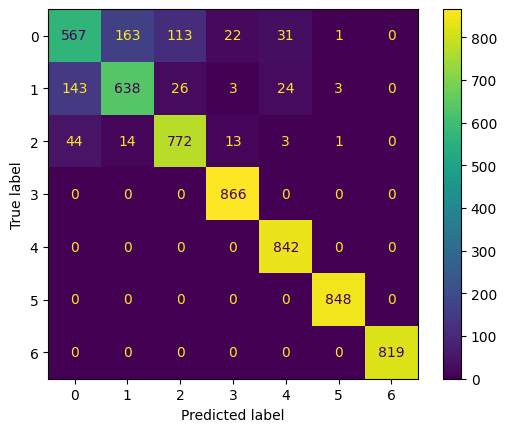

In [116]:
train_and_evaluate_model(grid_knn.best_estimator_)

### Histogram Gradient Boosting Classifier

In [117]:
param_grid = {'learning_rate': [0.2,0.4,0.5,0.8,1.0],
              'loss': ['auto', 'binary_crossentropy', 'categorical_crossentropy']}
grid_hgb = RandomizedSearchCV(HistGradientBoostingClassifier(),param_grid,cv=StratifiedKFold(n_splits=4,shuffle=True),verbose=2)
grid_hgb.fit(X_train_fn,y_train)

Fitting 4 folds for each of 10 candidates, totalling 40 fits
[CV] END .......................learning_rate=0.5, loss=auto; total time=   1.5s
[CV] END .......................learning_rate=0.5, loss=auto; total time=   1.2s
[CV] END .......................learning_rate=0.5, loss=auto; total time=   1.6s
[CV] END .......................learning_rate=0.5, loss=auto; total time=   1.8s
[CV] END .......................learning_rate=0.4, loss=auto; total time=   2.1s
[CV] END .......................learning_rate=0.4, loss=auto; total time=   2.7s
[CV] END .......................learning_rate=0.4, loss=auto; total time=   2.0s
[CV] END .......................learning_rate=0.4, loss=auto; total time=   2.0s
[CV] END ........learning_rate=1.0, loss=binary_crossentropy; total time=   0.0s
[CV] END ........learning_rate=1.0, loss=binary_crossentropy; total time=   0.0s
[CV] END ........learning_rate=1.0, loss=binary_crossentropy; total time=   0.0s
[CV] END ........learning_rate=1.0, loss=binary_

RandomizedSearchCV(cv=StratifiedKFold(n_splits=4, random_state=None, shuffle=True),
                   estimator=HistGradientBoostingClassifier(),
                   param_distributions={'learning_rate': [0.2, 0.4, 0.5, 0.8,
                                                          1.0],
                                        'loss': ['auto', 'binary_crossentropy',
                                                 'categorical_crossentropy']},
                   verbose=2)

In [118]:
grid_hgb.best_params_

{'loss': 'categorical_crossentropy', 'learning_rate': 0.4}

In [119]:
grid_hgb.best_score_

0.8837075417386299

Fitting 4 folds for each of 10 candidates, totalling 40 fits
[CV] END .......................learning_rate=0.2, loss=auto; total time=   3.8s
[CV] END .......................learning_rate=0.2, loss=auto; total time=   3.8s
[CV] END .......................learning_rate=0.2, loss=auto; total time=   3.8s
[CV] END .......................learning_rate=0.2, loss=auto; total time=   3.5s
[CV] END .......................learning_rate=1.0, loss=auto; total time=   0.4s
[CV] END .......................learning_rate=1.0, loss=auto; total time=   0.4s
[CV] END .......................learning_rate=1.0, loss=auto; total time=   0.4s
[CV] END .......................learning_rate=1.0, loss=auto; total time=   0.4s
[CV] END ...learning_rate=0.5, loss=categorical_crossentropy; total time=   1.0s
[CV] END ...learning_rate=0.5, loss=categorical_crossentropy; total time=   1.9s
[CV] END ...learning_rate=0.5, loss=categorical_crossentropy; total time=   1.9s
[CV] END ...learning_rate=0.5, loss=categorical_

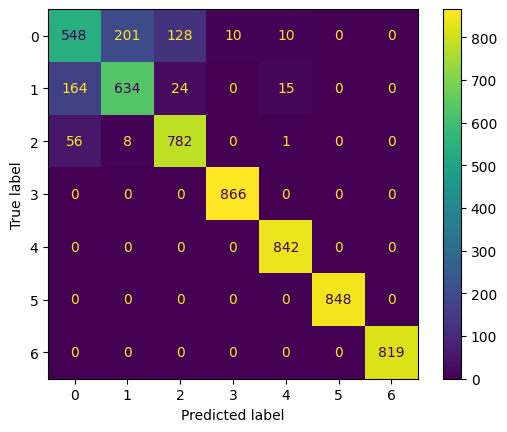

In [120]:
train_and_evaluate_model(grid_hgb)

### Support Vector Classifier

In [121]:
param_grid = {'C': [0.001,0.01,0.1,1,5],
             'gamma': ['scale','auto'],
             'kernel': ['linear','poly','rbf','sigmoid'],
             'degree': [2,3,4,5],
             'shrinking': [True,False]
             }

grid_svm = RandomizedSearchCV(SVC(),param_grid,verbose=2,cv=KFold(shuffle=True))
grid_svm.fit(X_train_fn,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END C=0.1, degree=5, gamma=scale, kernel=poly, shrinking=True; total time=   6.0s
[CV] END C=0.1, degree=5, gamma=scale, kernel=poly, shrinking=True; total time=   5.8s
[CV] END C=0.1, degree=5, gamma=scale, kernel=poly, shrinking=True; total time=   5.7s
[CV] END C=0.1, degree=5, gamma=scale, kernel=poly, shrinking=True; total time=   6.0s
[CV] END C=0.1, degree=5, gamma=scale, kernel=poly, shrinking=True; total time=   5.7s
[CV] END C=0.001, degree=3, gamma=scale, kernel=poly, shrinking=False; total time=   5.1s
[CV] END C=0.001, degree=3, gamma=scale, kernel=poly, shrinking=False; total time=   5.1s
[CV] END C=0.001, degree=3, gamma=scale, kernel=poly, shrinking=False; total time=   5.1s
[CV] END C=0.001, degree=3, gamma=scale, kernel=poly, shrinking=False; total time=   5.1s
[CV] END C=0.001, degree=3, gamma=scale, kernel=poly, shrinking=False; total time=   5.1s
[CV] END C=0.1, degree=4, gamma=scale, kernel=poly, sh

RandomizedSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=True),
                   estimator=SVC(),
                   param_distributions={'C': [0.001, 0.01, 0.1, 1, 5],
                                        'degree': [2, 3, 4, 5],
                                        'gamma': ['scale', 'auto'],
                                        'kernel': ['linear', 'poly', 'rbf',
                                                   'sigmoid'],
                                        'shrinking': [True, False]},
                   verbose=2)

In [122]:
grid_svm.best_params_

{'shrinking': False, 'kernel': 'rbf', 'gamma': 'auto', 'degree': 5, 'C': 0.01}

In [123]:
grid_svm.best_score_

0.36859666926408496

[[  6 263 113  84 129 140 162]
 [  5 381  64  51 104 146  86]
 [  3  93 151  74  90 135 301]
 [  0  87 161 127  52  76 363]
 [  0 234  96  67 210 161  74]
 [  0 108  34  54  54 518  80]
 [  0   0   0   0   0   0 819]]
              precision    recall  f1-score   support

           0       0.43      0.01      0.01       897
           1       0.33      0.46      0.38       837
           2       0.24      0.18      0.21       847
           3       0.28      0.15      0.19       866
           4       0.33      0.25      0.28       842
           5       0.44      0.61      0.51       848
           6       0.43      1.00      0.61       819

    accuracy                           0.37      5956
   macro avg       0.35      0.38      0.31      5956
weighted avg       0.35      0.37      0.31      5956



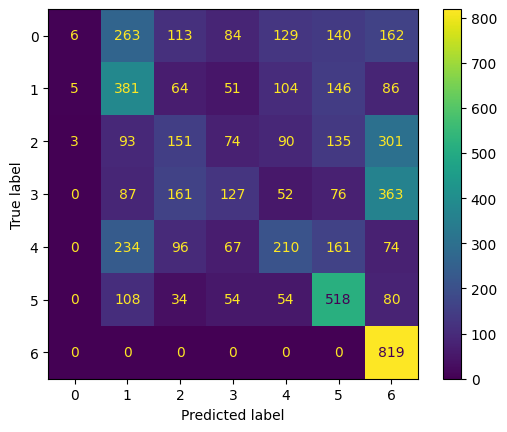

In [124]:
train_and_evaluate_model(grid_svm.best_estimator_)

### Logistic Regression

In [125]:
param_grid = {'penalty': ['l1','l2','elasticnet'],
              'C': [0.001,0.01,0.1,0.5],
              'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
              'multi_class': ['ovr', 'multinomial'],
              'l1_ratio': [0.2,0.5,0.8]
             }

grid_lr = RandomizedSearchCV(LogisticRegression(),param_grid,verbose=2,cv=5)
grid_lr.fit(X_train_fn,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END C=0.001, l1_ratio=0.2, multi_class=multinomial, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END C=0.001, l1_ratio=0.2, multi_class=multinomial, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END C=0.001, l1_ratio=0.2, multi_class=multinomial, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END C=0.001, l1_ratio=0.2, multi_class=multinomial, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END C=0.001, l1_ratio=0.2, multi_class=multinomial, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END C=0.5, l1_ratio=0.2, multi_class=ovr, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END C=0.5, l1_ratio=0.2, multi_class=ovr, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END C=0.5, l1_ratio=0.2, multi_class=ovr, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END C=0.5, l1_ratio=0.2, multi_class=ovr, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END C=0.5, l1_ratio=0.2, multi_class=ovr, penalty=l2, so

RandomizedSearchCV(cv=5, estimator=LogisticRegression(),
                   param_distributions={'C': [0.001, 0.01, 0.1, 0.5],
                                        'l1_ratio': [0.2, 0.5, 0.8],
                                        'multi_class': ['ovr', 'multinomial'],
                                        'penalty': ['l1', 'l2', 'elasticnet'],
                                        'solver': ['newton-cg', 'lbfgs',
                                                   'liblinear', 'sag',
                                                   'saga']},
                   verbose=2)

In [126]:
grid_lr.best_params_

{'solver': 'lbfgs',
 'penalty': 'l2',
 'multi_class': 'ovr',
 'l1_ratio': 0.2,
 'C': 0.5}

In [127]:
grid_lr.best_score_

0.32426627248039636

[[ 38 182 116  93 144 183 141]
 [ 57 303  64  31 148 168  66]
 [ 28  52 148 159  69  97 294]
 [  7  17 100 255  63  84 340]
 [ 47 181 156  44 185 160  69]
 [ 55  73  43  42 168 311 156]
 [  0   0   0   0   0 150 669]]
              precision    recall  f1-score   support

           0       0.16      0.04      0.07       897
           1       0.38      0.36      0.37       837
           2       0.24      0.17      0.20       847
           3       0.41      0.29      0.34       866
           4       0.24      0.22      0.23       842
           5       0.27      0.37      0.31       848
           6       0.39      0.82      0.52       819

    accuracy                           0.32      5956
   macro avg       0.30      0.33      0.29      5956
weighted avg       0.30      0.32      0.29      5956



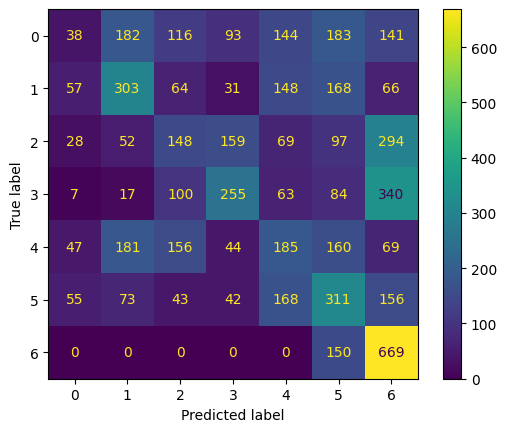

In [128]:
train_and_evaluate_model(grid_lr.best_estimator_)

### Linear Support Vector Classifier

In [129]:
param_grid = {'penalty': ['l1','l2'],
             'loss': ['hinge','squared_hinge'],
             'C': [0.0001,0.001,0.01,0.1,1],
             'multi_class': ['ovr','crammer_singer']}

grid_lsvc = RandomizedSearchCV(LinearSVC(),param_grid,cv=KFold(shuffle=True),verbose=2)
grid_lsvc.fit(X_train_fn,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END C=0.01, loss=squared_hinge, multi_class=ovr, penalty=l1; total time=   0.0s
[CV] END C=0.01, loss=squared_hinge, multi_class=ovr, penalty=l1; total time=   0.0s
[CV] END C=0.01, loss=squared_hinge, multi_class=ovr, penalty=l1; total time=   0.0s
[CV] END C=0.01, loss=squared_hinge, multi_class=ovr, penalty=l1; total time=   0.0s
[CV] END C=0.01, loss=squared_hinge, multi_class=ovr, penalty=l1; total time=   0.0s
[CV] END C=0.1, loss=hinge, multi_class=crammer_singer, penalty=l2; total time=   0.0s
[CV] END C=0.1, loss=hinge, multi_class=crammer_singer, penalty=l2; total time=   0.0s
[CV] END C=0.1, loss=hinge, multi_class=crammer_singer, penalty=l2; total time=   0.0s
[CV] END C=0.1, loss=hinge, multi_class=crammer_singer, penalty=l2; total time=   0.0s
[CV] END C=0.1, loss=hinge, multi_class=crammer_singer, penalty=l2; total time=   0.0s
[CV] END C=0.0001, loss=squared_hinge, multi_class=crammer_singer, penalty=l2; 

RandomizedSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=True),
                   estimator=LinearSVC(),
                   param_distributions={'C': [0.0001, 0.001, 0.01, 0.1, 1],
                                        'loss': ['hinge', 'squared_hinge'],
                                        'multi_class': ['ovr',
                                                        'crammer_singer'],
                                        'penalty': ['l1', 'l2']},
                   verbose=2)

In [130]:
grid_lsvc.best_params_

{'penalty': 'l1', 'multi_class': 'crammer_singer', 'loss': 'hinge', 'C': 0.001}

In [131]:
grid_lsvc.best_score_

0.27655507260258727

[[  1 203  25 148 177 258  85]
 [  0 307  21  92 165 239  13]
 [  0  74  21 139 174 185 254]
 [  0  48   5 148  64 261 340]
 [  0 192  42 148 206 202  52]
 [  0 124   0  85 301 311  27]
 [  0 150   0   0   0   0 669]]
              precision    recall  f1-score   support

           0       1.00      0.00      0.00       897
           1       0.28      0.37      0.32       837
           2       0.18      0.02      0.04       847
           3       0.19      0.17      0.18       866
           4       0.19      0.24      0.21       842
           5       0.21      0.37      0.27       848
           6       0.46      0.82      0.59       819

    accuracy                           0.28      5956
   macro avg       0.36      0.28      0.23      5956
weighted avg       0.37      0.28      0.23      5956



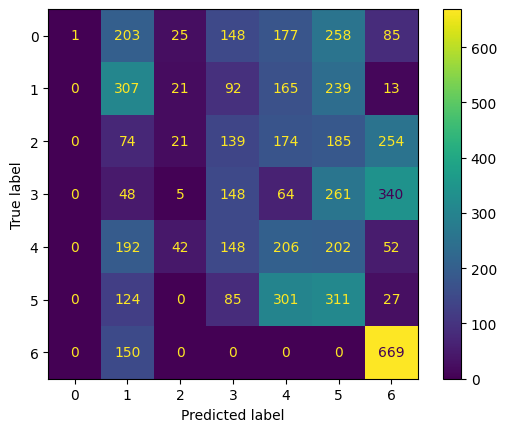

In [132]:
train_and_evaluate_model(grid_lsvc.best_estimator_)

### Decision Tree Classifier

In [133]:
param_grid = {'criterion': ['gini','entropy'],
              'max_features': ['sqrt','log2'],
              'max_depth': [2,12,38,68,98,128,201]
             }

grid_dt = RandomizedSearchCV(DecisionTreeClassifier(),param_grid,verbose=4,cv=RepeatedStratifiedKFold(n_splits=6,n_repeats=3))
grid_dt.fit(X_train_fn,y_train)

Fitting 18 folds for each of 10 candidates, totalling 180 fits
[CV 1/18] END criterion=entropy, max_depth=98, max_features=sqrt;, score=0.881 total time=   0.0s
[CV 2/18] END criterion=entropy, max_depth=98, max_features=sqrt;, score=0.877 total time=   0.0s
[CV 3/18] END criterion=entropy, max_depth=98, max_features=sqrt;, score=0.883 total time=   0.0s
[CV 4/18] END criterion=entropy, max_depth=98, max_features=sqrt;, score=0.881 total time=   0.0s
[CV 5/18] END criterion=entropy, max_depth=98, max_features=sqrt;, score=0.883 total time=   0.0s
[CV 6/18] END criterion=entropy, max_depth=98, max_features=sqrt;, score=0.886 total time=   0.0s
[CV 7/18] END criterion=entropy, max_depth=98, max_features=sqrt;, score=0.878 total time=   0.0s
[CV 8/18] END criterion=entropy, max_depth=98, max_features=sqrt;, score=0.879 total time=   0.0s
[CV 9/18] END criterion=entropy, max_depth=98, max_features=sqrt;, score=0.881 total time=   0.0s
[CV 10/18] END criterion=entropy, max_depth=98, max_fea

[CV 1/18] END criterion=gini, max_depth=128, max_features=sqrt;, score=0.887 total time=   0.0s
[CV 2/18] END criterion=gini, max_depth=128, max_features=sqrt;, score=0.879 total time=   0.0s
[CV 3/18] END criterion=gini, max_depth=128, max_features=sqrt;, score=0.878 total time=   0.0s
[CV 4/18] END criterion=gini, max_depth=128, max_features=sqrt;, score=0.877 total time=   0.0s
[CV 5/18] END criterion=gini, max_depth=128, max_features=sqrt;, score=0.880 total time=   0.0s
[CV 6/18] END criterion=gini, max_depth=128, max_features=sqrt;, score=0.885 total time=   0.0s
[CV 7/18] END criterion=gini, max_depth=128, max_features=sqrt;, score=0.875 total time=   0.0s
[CV 8/18] END criterion=gini, max_depth=128, max_features=sqrt;, score=0.885 total time=   0.0s
[CV 9/18] END criterion=gini, max_depth=128, max_features=sqrt;, score=0.875 total time=   0.0s
[CV 10/18] END criterion=gini, max_depth=128, max_features=sqrt;, score=0.883 total time=   0.0s
[CV 11/18] END criterion=gini, max_dept

[CV 17/18] END criterion=gini, max_depth=68, max_features=sqrt;, score=0.884 total time=   0.0s
[CV 18/18] END criterion=gini, max_depth=68, max_features=sqrt;, score=0.878 total time=   0.0s


RandomizedSearchCV(cv=RepeatedStratifiedKFold(n_repeats=3, n_splits=6, random_state=None),
                   estimator=DecisionTreeClassifier(),
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': [2, 12, 38, 68, 98, 128,
                                                      201],
                                        'max_features': ['sqrt', 'log2']},
                   verbose=4)

In [134]:
grid_dt.best_params_

{'max_features': 'log2', 'max_depth': 128, 'criterion': 'gini'}

In [135]:
grid_dt.best_score_

0.8838994434849359

[[521 182 136  24  28   3   3]
 [131 624  43   8  29   2   0]
 [ 36  16 778   5   6   2   4]
 [  0   0   0 866   0   0   0]
 [  0   0   0   0 842   0   0]
 [  0   0   0   0   0 848   0]
 [  0   0   0   0   0   0 819]]
              precision    recall  f1-score   support

           0       0.76      0.58      0.66       897
           1       0.76      0.75      0.75       837
           2       0.81      0.92      0.86       847
           3       0.96      1.00      0.98       866
           4       0.93      1.00      0.96       842
           5       0.99      1.00      1.00       848
           6       0.99      1.00      1.00       819

    accuracy                           0.89      5956
   macro avg       0.89      0.89      0.89      5956
weighted avg       0.88      0.89      0.88      5956



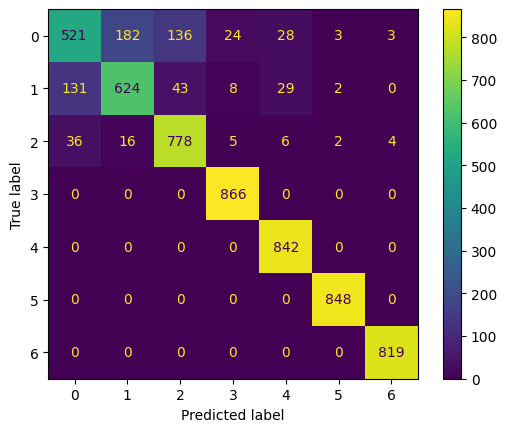

In [136]:
train_and_evaluate_model(grid_dt.best_estimator_)

### Gradient Boosting Classifier

In [137]:
param_grid = {'loss': ['deviance','exponential'],
              'n_estimators': [100,400,700,1000],
              'learning_rate': [0.2,0.4,0.7,1],
              'criterion': ['friedman_mse', 'squared_error'],
              'max_depth': [15,50,100,150],
              'max_features': ['auto','log2']
             }

grid_gb = RandomizedSearchCV(GradientBoostingClassifier(),param_grid,verbose=3,cv=2)
grid_gb.fit(X_train_fn,y_train)

Fitting 2 folds for each of 10 candidates, totalling 20 fits
[CV 1/2] END criterion=squared_error, learning_rate=1, loss=deviance, max_depth=50, max_features=log2, n_estimators=700;, score=0.853 total time=  11.8s
[CV 2/2] END criterion=squared_error, learning_rate=1, loss=deviance, max_depth=50, max_features=log2, n_estimators=700;, score=0.855 total time=  11.9s
[CV 1/2] END criterion=squared_error, learning_rate=1, loss=deviance, max_depth=100, max_features=log2, n_estimators=400;, score=0.857 total time=   7.7s
[CV 2/2] END criterion=squared_error, learning_rate=1, loss=deviance, max_depth=100, max_features=log2, n_estimators=400;, score=0.854 total time=   7.6s
[CV 1/2] END criterion=friedman_mse, learning_rate=0.4, loss=exponential, max_depth=100, max_features=auto, n_estimators=700;, score=nan total time=   0.0s
[CV 2/2] END criterion=friedman_mse, learning_rate=0.4, loss=exponential, max_depth=100, max_features=auto, n_estimators=700;, score=nan total time=   0.0s
[CV 1/2] END 

RandomizedSearchCV(cv=2, estimator=GradientBoostingClassifier(),
                   param_distributions={'criterion': ['friedman_mse',
                                                      'squared_error'],
                                        'learning_rate': [0.2, 0.4, 0.7, 1],
                                        'loss': ['deviance', 'exponential'],
                                        'max_depth': [15, 50, 100, 150],
                                        'max_features': ['auto', 'log2'],
                                        'n_estimators': [100, 400, 700, 1000]},
                   verbose=3)

In [138]:
grid_gb.best_params_

{'n_estimators': 700,
 'max_features': 'log2',
 'max_depth': 150,
 'loss': 'deviance',
 'learning_rate': 0.2,
 'criterion': 'squared_error'}

In [139]:
grid_gb.best_score_

0.8685952792170408

[[627 183  77   5   5   0   0]
 [146 670  15   0   6   0   0]
 [ 55   8 784   0   0   0   0]
 [  0   0   0 866   0   0   0]
 [  0   0   0   0 842   0   0]
 [  0   0   0   0   0 848   0]
 [  0   0   0   0   0   0 819]]
              precision    recall  f1-score   support

           0       0.76      0.70      0.73       897
           1       0.78      0.80      0.79       837
           2       0.89      0.93      0.91       847
           3       0.99      1.00      1.00       866
           4       0.99      1.00      0.99       842
           5       1.00      1.00      1.00       848
           6       1.00      1.00      1.00       819

    accuracy                           0.92      5956
   macro avg       0.92      0.92      0.92      5956
weighted avg       0.91      0.92      0.92      5956



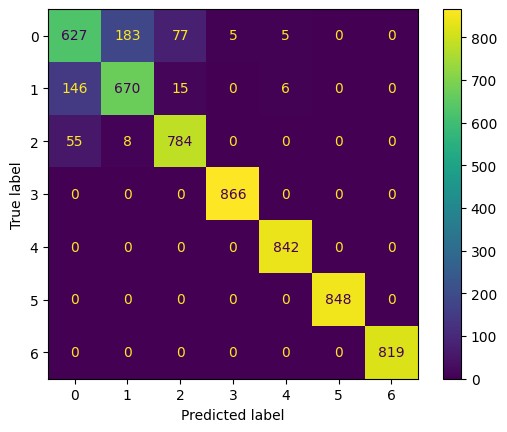

In [140]:
train_and_evaluate_model(grid_gb.best_estimator_)

### Categorical Boosting Classifier

In [141]:
param_grid = {'learning_rate': [0.2,0.4,0.7,1],
              'n_estimators': [200,500,1000]
             }
grid_cat = RandomizedSearchCV(CatBoostClassifier(silent=True),param_grid,verbose=5,cv=4)
grid_cat.fit(X_train_fn,y_train)

Fitting 4 folds for each of 10 candidates, totalling 40 fits
[CV 1/4] END learning_rate=0.4, n_estimators=500;, score=0.882 total time=   5.1s
[CV 2/4] END learning_rate=0.4, n_estimators=500;, score=0.877 total time=   5.5s
[CV 3/4] END learning_rate=0.4, n_estimators=500;, score=0.879 total time=   9.5s
[CV 4/4] END learning_rate=0.4, n_estimators=500;, score=0.880 total time=   6.0s
[CV 1/4] END learning_rate=0.4, n_estimators=200;, score=0.852 total time=   2.3s
[CV 2/4] END learning_rate=0.4, n_estimators=200;, score=0.849 total time=   3.7s
[CV 3/4] END learning_rate=0.4, n_estimators=200;, score=0.849 total time=   3.9s
[CV 4/4] END learning_rate=0.4, n_estimators=200;, score=0.858 total time=   3.8s
[CV 1/4] END learning_rate=0.2, n_estimators=200;, score=0.829 total time=   3.2s
[CV 2/4] END learning_rate=0.2, n_estimators=200;, score=0.824 total time=   3.0s
[CV 3/4] END learning_rate=0.2, n_estimators=200;, score=0.821 total time=   5.2s
[CV 4/4] END learning_rate=0.2, n_est

RandomizedSearchCV(cv=4,
                   estimator=<catboost.core.CatBoostClassifier object at 0x0000022AA6DA8D00>,
                   param_distributions={'learning_rate': [0.2, 0.4, 0.7, 1],
                                        'n_estimators': [200, 500, 1000]},
                   verbose=5)

In [142]:
grid_cat.best_params_

{'n_estimators': 1000, 'learning_rate': 1}

In [143]:
grid_cat.best_score_

0.8839234312032239

[[561 185 121  11  17   2   0]
 [137 649  27   1  23   0   0]
 [ 55   5 780   5   2   0   0]
 [  0   0   0 866   0   0   0]
 [  0   0   0   0 842   0   0]
 [  0   0   0   0   0 848   0]
 [  0   0   0   0   0   0 819]]
              precision    recall  f1-score   support

           0       0.75      0.63      0.68       897
           1       0.77      0.78      0.77       837
           2       0.84      0.92      0.88       847
           3       0.98      1.00      0.99       866
           4       0.95      1.00      0.98       842
           5       1.00      1.00      1.00       848
           6       1.00      1.00      1.00       819

    accuracy                           0.90      5956
   macro avg       0.90      0.90      0.90      5956
weighted avg       0.90      0.90      0.90      5956



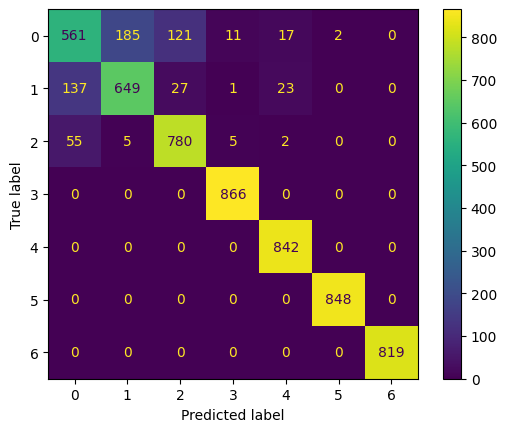

In [144]:
train_and_evaluate_model(grid_cat.best_estimator_)

### Bagging Classifier

In [145]:
param_grid = {'n_estimators': [200,500,800,1000],
              'max_samples': [0.24,0.58,0.71,0.96],
              'max_features': np.linspace(0,1,5),
              'bootstrap': [True,False],
              'warm_start': [True,False]
             }

grid_bag = RandomizedSearchCV(BaggingClassifier(),param_grid,verbose=4)
grid_bag.fit(X_train_fn,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END bootstrap=False, max_features=0.25, max_samples=0.58, n_estimators=200, warm_start=True;, score=0.673 total time=   2.1s
[CV 2/5] END bootstrap=False, max_features=0.25, max_samples=0.58, n_estimators=200, warm_start=True;, score=0.672 total time=   2.1s
[CV 3/5] END bootstrap=False, max_features=0.25, max_samples=0.58, n_estimators=200, warm_start=True;, score=0.689 total time=   2.2s
[CV 4/5] END bootstrap=False, max_features=0.25, max_samples=0.58, n_estimators=200, warm_start=True;, score=0.689 total time=   2.2s
[CV 5/5] END bootstrap=False, max_features=0.25, max_samples=0.58, n_estimators=200, warm_start=True;, score=0.665 total time=   2.2s
[CV 1/5] END bootstrap=True, max_features=0.25, max_samples=0.24, n_estimators=200, warm_start=False;, score=0.660 total time=   0.7s
[CV 2/5] END bootstrap=True, max_features=0.25, max_samples=0.24, n_estimators=200, warm_start=False;, score=0.671 total time=   0.6s
[

RandomizedSearchCV(estimator=BaggingClassifier(),
                   param_distributions={'bootstrap': [True, False],
                                        'max_features': array([0.  , 0.25, 0.5 , 0.75, 1.  ]),
                                        'max_samples': [0.24, 0.58, 0.71, 0.96],
                                        'n_estimators': [200, 500, 800, 1000],
                                        'warm_start': [True, False]},
                   verbose=4)

In [146]:
grid_bag.best_params_

{'warm_start': True,
 'n_estimators': 800,
 'max_samples': 0.58,
 'max_features': 0.5,
 'bootstrap': False}

In [147]:
grid_bag.best_score_

0.8976685625231372

[[579 205 107   2   4   0   0]
 [123 695  14   0   5   0   0]
 [ 46  10 790   0   1   0   0]
 [  0   0   0 866   0   0   0]
 [  0   0   0   0 842   0   0]
 [  0   0   0   0   0 848   0]
 [  0   0   0   0   0   0 819]]
              precision    recall  f1-score   support

           0       0.77      0.65      0.70       897
           1       0.76      0.83      0.80       837
           2       0.87      0.93      0.90       847
           3       1.00      1.00      1.00       866
           4       0.99      1.00      0.99       842
           5       1.00      1.00      1.00       848
           6       1.00      1.00      1.00       819

    accuracy                           0.91      5956
   macro avg       0.91      0.92      0.91      5956
weighted avg       0.91      0.91      0.91      5956



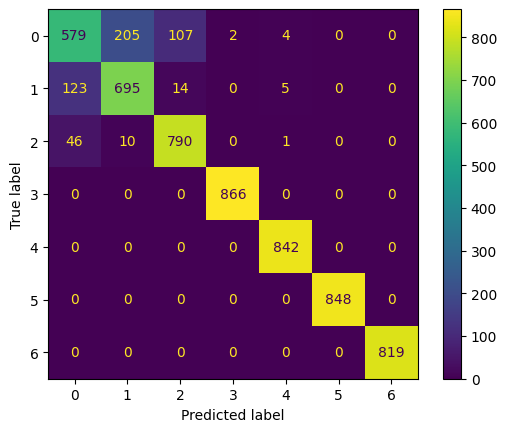

In [148]:
train_and_evaluate_model(grid_bag.best_estimator_)

### Light Gradient Boosting Model

In [149]:
param_grid = {'boosting_type': ['gbdt','dart','goss','rf'],
              'learning_rate': np.linspace(0,1,6)[1:],
              'n_estimators': [200,500,600,1000],
              'importance_type': ['split','gain'],
              'min_split_gain': [0.68,0.79,0.87,1]}

grid_lgbm = RandomizedSearchCV(LGBMClassifier(),param_grid,verbose=3)
grid_lgbm.fit(X_train_fn,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END boosting_type=rf, importance_type=gain, learning_rate=0.6000000000000001, min_split_gain=0.68, n_estimators=200;, score=nan total time=   0.0s
[CV 2/5] END boosting_type=rf, importance_type=gain, learning_rate=0.6000000000000001, min_split_gain=0.68, n_estimators=200;, score=nan total time=   0.0s
[CV 3/5] END boosting_type=rf, importance_type=gain, learning_rate=0.6000000000000001, min_split_gain=0.68, n_estimators=200;, score=nan total time=   0.0s
[CV 4/5] END boosting_type=rf, importance_type=gain, learning_rate=0.6000000000000001, min_split_gain=0.68, n_estimators=200;, score=nan total time=   0.0s
[CV 5/5] END boosting_type=rf, importance_type=gain, learning_rate=0.6000000000000001, min_split_gain=0.68, n_estimators=200;, score=nan total time=   0.0s
[CV 1/5] END boosting_type=gbdt, importance_type=split, learning_rate=0.6000000000000001, min_split_gain=0.87, n_estimators=1000;, score=0.847 total time=   0.

RandomizedSearchCV(estimator=LGBMClassifier(),
                   param_distributions={'boosting_type': ['gbdt', 'dart',
                                                          'goss', 'rf'],
                                        'importance_type': ['split', 'gain'],
                                        'learning_rate': array([0.2, 0.4, 0.6, 0.8, 1. ]),
                                        'min_split_gain': [0.68, 0.79, 0.87, 1],
                                        'n_estimators': [200, 500, 600, 1000]},
                   verbose=3)

In [150]:
grid_lgbm.best_params_

{'n_estimators': 600,
 'min_split_gain': 0.79,
 'learning_rate': 0.2,
 'importance_type': 'split',
 'boosting_type': 'goss'}

In [151]:
grid_lgbm.best_score_

0.8854344635123136

[[579 174 118  12  12   0   2]
 [146 657  15   0  18   1   0]
 [ 48  12 777   6   1   0   3]
 [  0   0   0 866   0   0   0]
 [  0   0   0   0 842   0   0]
 [  0   0   0   0   0 848   0]
 [  0   0   0   0   0   0 819]]
              precision    recall  f1-score   support

           0       0.75      0.65      0.69       897
           1       0.78      0.78      0.78       837
           2       0.85      0.92      0.88       847
           3       0.98      1.00      0.99       866
           4       0.96      1.00      0.98       842
           5       1.00      1.00      1.00       848
           6       0.99      1.00      1.00       819

    accuracy                           0.90      5956
   macro avg       0.90      0.91      0.90      5956
weighted avg       0.90      0.90      0.90      5956



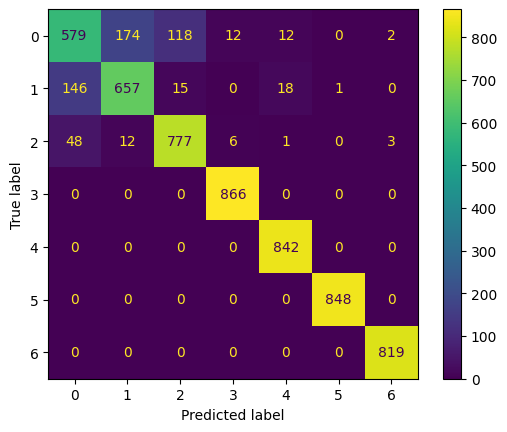

In [152]:
train_and_evaluate_model(grid_lgbm.best_estimator_)

### Extra Trees Classifier

In [153]:
param_grid = {'n_estimators': [100,300,600,1000],
             'criterion': ['gini','entropy'],
             'max_features': ['sqrt','log2'],
             'bootstrap': [True,False],
             'class_weight': ['balanced','balanced_subsample'],
             'warm_start': [True,False],
             'max_samples': [0.2,0.45,0.7,0.95]
             }

grid_et = RandomizedSearchCV(ExtraTreesClassifier(),param_grid,verbose=4)
grid_et.fit(X_train_fn,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END bootstrap=True, class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.45, n_estimators=600, warm_start=False;, score=0.888 total time=   4.4s
[CV 2/5] END bootstrap=True, class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.45, n_estimators=600, warm_start=False;, score=0.893 total time=   4.3s
[CV 3/5] END bootstrap=True, class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.45, n_estimators=600, warm_start=False;, score=0.890 total time=   4.8s
[CV 4/5] END bootstrap=True, class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.45, n_estimators=600, warm_start=False;, score=0.884 total time=   5.5s
[CV 5/5] END bootstrap=True, class_weight=balanced, criterion=entropy, max_features=log2, max_samples=0.45, n_estimators=600, warm_start=False;, score=0.892 total time=   5.9s
[CV 1/5] END bootstrap=False, class_weight=balanced, criter

RandomizedSearchCV(estimator=ExtraTreesClassifier(),
                   param_distributions={'bootstrap': [True, False],
                                        'class_weight': ['balanced',
                                                         'balanced_subsample'],
                                        'criterion': ['gini', 'entropy'],
                                        'max_features': ['sqrt', 'log2'],
                                        'max_samples': [0.2, 0.45, 0.7, 0.95],
                                        'n_estimators': [100, 300, 600, 1000],
                                        'warm_start': [True, False]},
                   verbose=4)

In [154]:
grid_et.best_params_

{'warm_start': True,
 'n_estimators': 300,
 'max_samples': 0.7,
 'max_features': 'log2',
 'criterion': 'gini',
 'class_weight': 'balanced_subsample',
 'bootstrap': True}

In [155]:
grid_et.best_score_

0.8950778578288862

[[568 192 125   3   9   0   0]
 [112 699  18   0   8   0   0]
 [ 52   6 787   1   1   0   0]
 [  0   0   0 866   0   0   0]
 [  0   0   0   0 842   0   0]
 [  0   0   0   0   0 848   0]
 [  0   0   0   0   0   0 819]]
              precision    recall  f1-score   support

           0       0.78      0.63      0.70       897
           1       0.78      0.84      0.81       837
           2       0.85      0.93      0.89       847
           3       1.00      1.00      1.00       866
           4       0.98      1.00      0.99       842
           5       1.00      1.00      1.00       848
           6       1.00      1.00      1.00       819

    accuracy                           0.91      5956
   macro avg       0.91      0.91      0.91      5956
weighted avg       0.91      0.91      0.91      5956



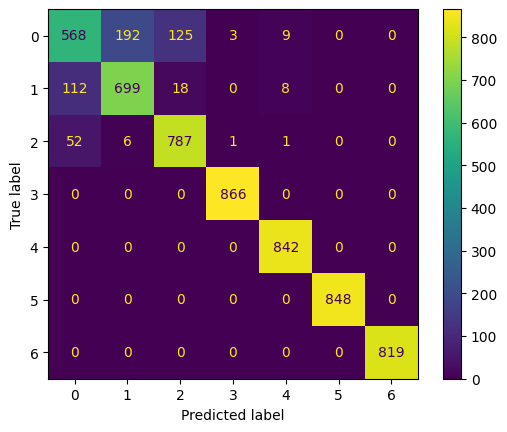

In [156]:
train_and_evaluate_model(grid_et.best_estimator_)

### Bernoulli Naive Bayes

In [157]:
param_grid = {'alpha': np.linspace(0,1,6),
              'binarize': np.linspace(0,1,5),
              'fit_prior': [True,False]
             }

grid_bnb = RandomizedSearchCV(BernoulliNB(),param_grid,verbose=3,cv=RepeatedKFold(n_splits=5,n_repeats=2))
grid_bnb.fit(X_train_fn,y_train)

Fitting 10 folds for each of 10 candidates, totalling 100 fits
[CV 1/10] END alpha=0.0, binarize=0.25, fit_prior=True;, score=0.307 total time=   0.0s
[CV 2/10] END alpha=0.0, binarize=0.25, fit_prior=True;, score=0.298 total time=   0.0s
[CV 3/10] END alpha=0.0, binarize=0.25, fit_prior=True;, score=0.293 total time=   0.0s
[CV 4/10] END alpha=0.0, binarize=0.25, fit_prior=True;, score=0.317 total time=   0.0s
[CV 5/10] END alpha=0.0, binarize=0.25, fit_prior=True;, score=0.301 total time=   0.0s
[CV 6/10] END alpha=0.0, binarize=0.25, fit_prior=True;, score=0.299 total time=   0.0s
[CV 7/10] END alpha=0.0, binarize=0.25, fit_prior=True;, score=0.313 total time=   0.0s
[CV 8/10] END alpha=0.0, binarize=0.25, fit_prior=True;, score=0.295 total time=   0.0s
[CV 9/10] END alpha=0.0, binarize=0.25, fit_prior=True;, score=0.309 total time=   0.0s
[CV 10/10] END alpha=0.0, binarize=0.25, fit_prior=True;, score=0.311 total time=   0.0s
[CV 1/10] END alpha=0.2, binarize=1.0, fit_prior=False;,

[CV 8/10] END alpha=0.2, binarize=0.0, fit_prior=True;, score=0.269 total time=   0.0s
[CV 9/10] END alpha=0.2, binarize=0.0, fit_prior=True;, score=0.283 total time=   0.0s
[CV 10/10] END alpha=0.2, binarize=0.0, fit_prior=True;, score=0.263 total time=   0.0s


RandomizedSearchCV(cv=RepeatedKFold(n_repeats=2, n_splits=5, random_state=None),
                   estimator=BernoulliNB(),
                   param_distributions={'alpha': array([0. , 0.2, 0.4, 0.6, 0.8, 1. ]),
                                        'binarize': array([0.  , 0.25, 0.5 , 0.75, 1.  ]),
                                        'fit_prior': [True, False]},
                   verbose=3)

In [158]:
grid_bnb.best_params_

{'fit_prior': False, 'binarize': 0.5, 'alpha': 1.0}

In [159]:
grid_bnb.best_score_

0.3300583513038436

[[ 55 262   7  33 303 120 117]
 [ 17 317   1   0 304 173  25]
 [ 50 144   9  65 220  51 308]
 [ 71 133   6 134 133  20 369]
 [ 36 123   0   5 445 174  59]
 [  0 256   0   0 263 247  82]
 [  0   0   0   0   0 150 669]]
              precision    recall  f1-score   support

           0       0.24      0.06      0.10       897
           1       0.26      0.38      0.31       837
           2       0.39      0.01      0.02       847
           3       0.57      0.15      0.24       866
           4       0.27      0.53      0.35       842
           5       0.26      0.29      0.28       848
           6       0.41      0.82      0.55       819

    accuracy                           0.31      5956
   macro avg       0.34      0.32      0.26      5956
weighted avg       0.34      0.31      0.26      5956



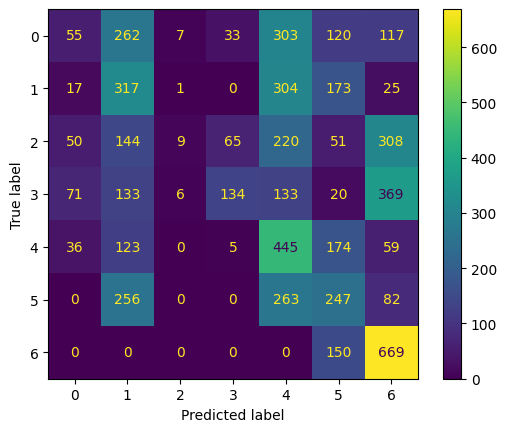

In [160]:
train_and_evaluate_model(grid_bnb.best_estimator_)

## Optimized Model Performance Comparisons

In [161]:
model_perfs = pd.DataFrame(list(zip(models,accuracy_scores)),columns=['Model','Accuracy']).sort_values('Accuracy',ascending=False)
model_perfs

,Model,Accuracy
11,"(ExtraTreeClassifier(random_state=921570899), ...",0.917730
27,"([DecisionTreeRegressor(max_depth=150, max_fea...",0.916051
29,(DecisionTreeClassifier(random_state=182200909...,0.913197
10,"(DecisionTreeClassifier(max_features='sqrt', r...",0.912525
31,"(ExtraTreeClassifier(max_features='log2', rand...",0.911518
20,"(DecisionTreeClassifier(criterion='entropy', m...",0.910175
30,"LGBMClassifier(boosting_type='goss', learning_...",0.904634
28,<catboost.core.CatBoostClassifier object at 0x...,0.900772
15,(DecisionTreeClassifier(random_state=180063348...,0.900437
12,"XGBClassifier(base_score=None, booster=None, c...",0.899093


In [181]:
model_perfs.iloc[1]['Model']

GradientBoostingClassifier(criterion='squared_error', learning_rate=0.2,
                           loss='deviance', max_depth=150, max_features='log2',
                           n_estimators=700)

The best performing model, after tuning the hyperparameters, is the baseline Extra Trees Classifier model, which produced a fascinating accuracy score of more than 92%.

## Deep Learning Artificial Neural Networks (ANN) Model Training & Evaluation

In [163]:
model = Sequential()
model.add(Dense(units=32,activation='relu',input_dim=X_train_fn.shape[1]))
model.add(Dense(units=64,activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(units=128,activation='relu'))
model.add(Dropout(0.25))
model.add(Dense(units=256,activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(units=7,activation='softmax'))
adam = Adam(learning_rate=1e-3,epsilon=1e-8,weight_decay=1e-2,clipnorm=1.0)
model.compile(loss='sparse_categorical_crossentropy',optimizer=adam,metrics='accuracy')
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32)                256       
                                                                 
 dense_1 (Dense)             (None, 64)                2112      
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense_2 (Dense)             (None, 128)               8320      
                                                                 
 dropout_1 (Dropout)         (None, 128)               0         
                                                                 
 dense_3 (Dense)             (None, 256)               33024     
                                                                 
 dropout_2 (Dropout)         (None, 256)               0

In [164]:
rl = ReduceLROnPlateau(monitor='val_accuracy',mode='max',factor=0.1,patience=10,min_lr=1e-3)
mc = ModelCheckpoint('wine_quality_predictor.h5',monitor='val_accuracy',save_best_only=True,mode='max',verbose=1)
es = EarlyStopping(monitor='val_accuracy',patience=32,mode='max',start_from_epoch=450,restore_best_weights=True)

r = model.fit(X_train_fn,
             y_train,
             batch_size=32,
             epochs=500,
             callbacks=[es,rl,mc],
             validation_data=(X_test_fn,y_test))

Epoch 1/500
432/435 [============================>.] - ETA: 0s - loss: 1.5523 - accuracy: 0.3699
Epoch 1: val_accuracy improved from -inf to 0.46407, saving model to wine_quality_predictor.h5
435/435 [==============================] - 6s 6ms/step - loss: 1.5518 - accuracy: 0.3698 - val_loss: 1.3010 - val_accuracy: 0.4641 - lr: 0.0010
Epoch 2/500
421/435 [============================>.] - ETA: 0s - loss: 1.2964 - accuracy: 0.4708
Epoch 2: val_accuracy improved from 0.46407 to 0.52267, saving model to wine_quality_predictor.h5
435/435 [==============================] - 2s 4ms/step - loss: 1.2947 - accuracy: 0.4713 - val_loss: 1.1634 - val_accuracy: 0.5227 - lr: 0.0010
Epoch 3/500
429/435 [============================>.] - ETA: 0s - loss: 1.1783 - accuracy: 0.5140
Epoch 3: val_accuracy improved from 0.52267 to 0.55860, saving model to wine_quality_predictor.h5
435/435 [==============================] - 2s 4ms/step - loss: 1.1775 - accuracy: 0.5146 - val_loss: 1.0697 - val_accuracy: 0.5586

Epoch 26/500
434/435 [============================>.] - ETA: 0s - loss: 0.7199 - accuracy: 0.7009
Epoch 26: val_accuracy improved from 0.73237 to 0.73455, saving model to wine_quality_predictor.h5
435/435 [==============================] - 2s 5ms/step - loss: 0.7197 - accuracy: 0.7009 - val_loss: 0.6437 - val_accuracy: 0.7346 - lr: 0.0010
Epoch 27/500
432/435 [============================>.] - ETA: 0s - loss: 0.7171 - accuracy: 0.7028
Epoch 27: val_accuracy did not improve from 0.73455
435/435 [==============================] - 2s 4ms/step - loss: 0.7166 - accuracy: 0.7028 - val_loss: 0.6468 - val_accuracy: 0.7288 - lr: 0.0010
Epoch 28/500
421/435 [============================>.] - ETA: 0s - loss: 0.7028 - accuracy: 0.7127
Epoch 28: val_accuracy improved from 0.73455 to 0.73489, saving model to wine_quality_predictor.h5
435/435 [==============================] - 2s 4ms/step - loss: 0.7035 - accuracy: 0.7124 - val_loss: 0.6445 - val_accuracy: 0.7349 - lr: 0.0010
Epoch 29/500
427/435 [==

Epoch 52/500
432/435 [============================>.] - ETA: 0s - loss: 0.6252 - accuracy: 0.7457
Epoch 52: val_accuracy did not improve from 0.77938
435/435 [==============================] - 2s 4ms/step - loss: 0.6249 - accuracy: 0.7458 - val_loss: 0.5484 - val_accuracy: 0.7666 - lr: 0.0010
Epoch 53/500
435/435 [==============================] - ETA: 0s - loss: 0.6183 - accuracy: 0.7458
Epoch 53: val_accuracy did not improve from 0.77938
435/435 [==============================] - 2s 4ms/step - loss: 0.6183 - accuracy: 0.7458 - val_loss: 0.5473 - val_accuracy: 0.7705 - lr: 0.0010
Epoch 54/500
433/435 [============================>.] - ETA: 0s - loss: 0.6105 - accuracy: 0.7510
Epoch 54: val_accuracy improved from 0.77938 to 0.78711, saving model to wine_quality_predictor.h5
435/435 [==============================] - 2s 5ms/step - loss: 0.6106 - accuracy: 0.7509 - val_loss: 0.5211 - val_accuracy: 0.7871 - lr: 0.0010
Epoch 55/500
422/435 [============================>.] - ETA: 0s - loss:

Epoch 79/500
427/435 [============================>.] - ETA: 0s - loss: 0.5706 - accuracy: 0.7668
Epoch 79: val_accuracy did not improve from 0.79919
435/435 [==============================] - 2s 3ms/step - loss: 0.5710 - accuracy: 0.7666 - val_loss: 0.4961 - val_accuracy: 0.7908 - lr: 0.0010
Epoch 80/500
434/435 [============================>.] - ETA: 0s - loss: 0.5753 - accuracy: 0.7681
Epoch 80: val_accuracy improved from 0.79919 to 0.79953, saving model to wine_quality_predictor.h5
435/435 [==============================] - 2s 4ms/step - loss: 0.5752 - accuracy: 0.7681 - val_loss: 0.4870 - val_accuracy: 0.7995 - lr: 0.0010
Epoch 81/500
430/435 [============================>.] - ETA: 0s - loss: 0.5636 - accuracy: 0.7711
Epoch 81: val_accuracy did not improve from 0.79953
435/435 [==============================] - 2s 4ms/step - loss: 0.5630 - accuracy: 0.7712 - val_loss: 0.4935 - val_accuracy: 0.7977 - lr: 0.0010
Epoch 82/500
423/435 [============================>.] - ETA: 0s - loss:

429/435 [============================>.] - ETA: 0s - loss: 0.5464 - accuracy: 0.7806
Epoch 106: val_accuracy did not improve from 0.81279
435/435 [==============================] - 2s 4ms/step - loss: 0.5458 - accuracy: 0.7811 - val_loss: 0.4606 - val_accuracy: 0.8125 - lr: 0.0010
Epoch 107/500
422/435 [============================>.] - ETA: 0s - loss: 0.5369 - accuracy: 0.7818
Epoch 107: val_accuracy did not improve from 0.81279
435/435 [==============================] - 2s 4ms/step - loss: 0.5356 - accuracy: 0.7827 - val_loss: 0.4701 - val_accuracy: 0.8047 - lr: 0.0010
Epoch 108/500
416/435 [===========================>..] - ETA: 0s - loss: 0.5398 - accuracy: 0.7818
Epoch 108: val_accuracy did not improve from 0.81279
435/435 [==============================] - 2s 3ms/step - loss: 0.5393 - accuracy: 0.7824 - val_loss: 0.4650 - val_accuracy: 0.8062 - lr: 0.0010
Epoch 109/500
433/435 [============================>.] - ETA: 0s - loss: 0.5419 - accuracy: 0.7822
Epoch 109: val_accuracy did

420/435 [===========================>..] - ETA: 0s - loss: 0.5227 - accuracy: 0.7866
Epoch 133: val_accuracy did not improve from 0.81632
435/435 [==============================] - 2s 4ms/step - loss: 0.5214 - accuracy: 0.7872 - val_loss: 0.4528 - val_accuracy: 0.8125 - lr: 0.0010
Epoch 134/500
430/435 [============================>.] - ETA: 0s - loss: 0.5214 - accuracy: 0.7898
Epoch 134: val_accuracy did not improve from 0.81632
435/435 [==============================] - 1s 3ms/step - loss: 0.5211 - accuracy: 0.7897 - val_loss: 0.4612 - val_accuracy: 0.8106 - lr: 0.0010
Epoch 135/500
430/435 [============================>.] - ETA: 0s - loss: 0.5165 - accuracy: 0.7944
Epoch 135: val_accuracy did not improve from 0.81632
435/435 [==============================] - 2s 5ms/step - loss: 0.5170 - accuracy: 0.7941 - val_loss: 0.4485 - val_accuracy: 0.8158 - lr: 0.0010
Epoch 136/500
435/435 [==============================] - ETA: 0s - loss: 0.5215 - accuracy: 0.7909
Epoch 136: val_accuracy imp

435/435 [==============================] - 2s 4ms/step - loss: 0.5085 - accuracy: 0.7949 - val_loss: 0.4438 - val_accuracy: 0.8203 - lr: 0.0010
Epoch 161/500
422/435 [============================>.] - ETA: 0s - loss: 0.5020 - accuracy: 0.7999
Epoch 161: val_accuracy did not improve from 0.82471
435/435 [==============================] - 1s 3ms/step - loss: 0.5032 - accuracy: 0.7991 - val_loss: 0.4585 - val_accuracy: 0.8083 - lr: 0.0010
Epoch 162/500
432/435 [============================>.] - ETA: 0s - loss: 0.5057 - accuracy: 0.7969
Epoch 162: val_accuracy did not improve from 0.82471
435/435 [==============================] - 3s 7ms/step - loss: 0.5054 - accuracy: 0.7972 - val_loss: 0.4470 - val_accuracy: 0.8172 - lr: 0.0010
Epoch 163/500
419/435 [===========================>..] - ETA: 0s - loss: 0.5031 - accuracy: 0.7995
Epoch 163: val_accuracy did not improve from 0.82471
435/435 [==============================] - 2s 4ms/step - loss: 0.5019 - accuracy: 0.7999 - val_loss: 0.4543 - va

Epoch 188/500
426/435 [============================>.] - ETA: 0s - loss: 0.4950 - accuracy: 0.8004
Epoch 188: val_accuracy did not improve from 0.82555
435/435 [==============================] - 2s 4ms/step - loss: 0.4954 - accuracy: 0.8007 - val_loss: 0.4317 - val_accuracy: 0.8222 - lr: 0.0010
Epoch 189/500
434/435 [============================>.] - ETA: 0s - loss: 0.4959 - accuracy: 0.8018
Epoch 189: val_accuracy did not improve from 0.82555
435/435 [==============================] - 2s 4ms/step - loss: 0.4956 - accuracy: 0.8019 - val_loss: 0.4382 - val_accuracy: 0.8207 - lr: 0.0010
Epoch 190/500
424/435 [============================>.] - ETA: 0s - loss: 0.4857 - accuracy: 0.8043
Epoch 190: val_accuracy did not improve from 0.82555
435/435 [==============================] - 2s 4ms/step - loss: 0.4883 - accuracy: 0.8036 - val_loss: 0.4407 - val_accuracy: 0.8180 - lr: 0.0010
Epoch 191/500
425/435 [============================>.] - ETA: 0s - loss: 0.4998 - accuracy: 0.8018
Epoch 191: va

426/435 [============================>.] - ETA: 0s - loss: 0.4932 - accuracy: 0.8034
Epoch 215: val_accuracy did not improve from 0.83277
435/435 [==============================] - 1s 3ms/step - loss: 0.4935 - accuracy: 0.8027 - val_loss: 0.4393 - val_accuracy: 0.8214 - lr: 0.0010
Epoch 216/500
428/435 [============================>.] - ETA: 0s - loss: 0.4853 - accuracy: 0.8044
Epoch 216: val_accuracy did not improve from 0.83277
435/435 [==============================] - 1s 3ms/step - loss: 0.4853 - accuracy: 0.8045 - val_loss: 0.4277 - val_accuracy: 0.8287 - lr: 0.0010
Epoch 217/500
434/435 [============================>.] - ETA: 0s - loss: 0.4855 - accuracy: 0.8047
Epoch 217: val_accuracy did not improve from 0.83277
435/435 [==============================] - 2s 4ms/step - loss: 0.4854 - accuracy: 0.8047 - val_loss: 0.4271 - val_accuracy: 0.8242 - lr: 0.0010
Epoch 218/500
429/435 [============================>.] - ETA: 0s - loss: 0.4878 - accuracy: 0.8032
Epoch 218: val_accuracy did

Epoch 243/500
432/435 [============================>.] - ETA: 0s - loss: 0.4827 - accuracy: 0.8045
Epoch 243: val_accuracy did not improve from 0.83277
435/435 [==============================] - 1s 3ms/step - loss: 0.4826 - accuracy: 0.8043 - val_loss: 0.4322 - val_accuracy: 0.8298 - lr: 0.0010
Epoch 244/500
421/435 [============================>.] - ETA: 0s - loss: 0.4831 - accuracy: 0.8079
Epoch 244: val_accuracy did not improve from 0.83277
435/435 [==============================] - 1s 3ms/step - loss: 0.4823 - accuracy: 0.8079 - val_loss: 0.4317 - val_accuracy: 0.8271 - lr: 0.0010
Epoch 245/500
424/435 [============================>.] - ETA: 0s - loss: 0.4813 - accuracy: 0.8067
Epoch 245: val_accuracy did not improve from 0.83277
435/435 [==============================] - 2s 3ms/step - loss: 0.4821 - accuracy: 0.8065 - val_loss: 0.4353 - val_accuracy: 0.8214 - lr: 0.0010
Epoch 246/500
434/435 [============================>.] - ETA: 0s - loss: 0.4774 - accuracy: 0.8044
Epoch 246: va

435/435 [==============================] - 2s 5ms/step - loss: 0.4720 - accuracy: 0.8126 - val_loss: 0.4345 - val_accuracy: 0.8251 - lr: 0.0010
Epoch 271/500
428/435 [============================>.] - ETA: 0s - loss: 0.4743 - accuracy: 0.8128
Epoch 271: val_accuracy did not improve from 0.83462
435/435 [==============================] - 2s 6ms/step - loss: 0.4735 - accuracy: 0.8132 - val_loss: 0.4255 - val_accuracy: 0.8261 - lr: 0.0010
Epoch 272/500
424/435 [============================>.] - ETA: 0s - loss: 0.4731 - accuracy: 0.8076
Epoch 272: val_accuracy did not improve from 0.83462
435/435 [==============================] - 2s 5ms/step - loss: 0.4715 - accuracy: 0.8081 - val_loss: 0.4259 - val_accuracy: 0.8301 - lr: 0.0010
Epoch 273/500
426/435 [============================>.] - ETA: 0s - loss: 0.4732 - accuracy: 0.8077
Epoch 273: val_accuracy did not improve from 0.83462
435/435 [==============================] - 1s 3ms/step - loss: 0.4721 - accuracy: 0.8081 - val_loss: 0.4322 - va

428/435 [============================>.] - ETA: 0s - loss: 0.4662 - accuracy: 0.8134
Epoch 298: val_accuracy did not improve from 0.83546
435/435 [==============================] - 2s 4ms/step - loss: 0.4658 - accuracy: 0.8130 - val_loss: 0.4289 - val_accuracy: 0.8308 - lr: 0.0010
Epoch 299/500
431/435 [============================>.] - ETA: 0s - loss: 0.4675 - accuracy: 0.8150
Epoch 299: val_accuracy did not improve from 0.83546
435/435 [==============================] - 2s 3ms/step - loss: 0.4676 - accuracy: 0.8149 - val_loss: 0.4247 - val_accuracy: 0.8274 - lr: 0.0010
Epoch 300/500
433/435 [============================>.] - ETA: 0s - loss: 0.4679 - accuracy: 0.8122
Epoch 300: val_accuracy did not improve from 0.83546
435/435 [==============================] - 1s 3ms/step - loss: 0.4673 - accuracy: 0.8125 - val_loss: 0.4206 - val_accuracy: 0.8318 - lr: 0.0010
Epoch 301/500
418/435 [===========================>..] - ETA: 0s - loss: 0.4678 - accuracy: 0.8146
Epoch 301: val_accuracy did

435/435 [==============================] - 1s 3ms/step - loss: 0.4660 - accuracy: 0.8165 - val_loss: 0.4219 - val_accuracy: 0.8292 - lr: 0.0010
Epoch 326/500
423/435 [============================>.] - ETA: 0s - loss: 0.4623 - accuracy: 0.8154
Epoch 326: val_accuracy did not improve from 0.83831
435/435 [==============================] - 2s 4ms/step - loss: 0.4627 - accuracy: 0.8151 - val_loss: 0.4164 - val_accuracy: 0.8316 - lr: 0.0010
Epoch 327/500
422/435 [============================>.] - ETA: 0s - loss: 0.4632 - accuracy: 0.8143
Epoch 327: val_accuracy did not improve from 0.83831
435/435 [==============================] - 2s 4ms/step - loss: 0.4639 - accuracy: 0.8140 - val_loss: 0.4111 - val_accuracy: 0.8353 - lr: 0.0010
Epoch 328/500
422/435 [============================>.] - ETA: 0s - loss: 0.4675 - accuracy: 0.8133
Epoch 328: val_accuracy did not improve from 0.83831
435/435 [==============================] - 2s 4ms/step - loss: 0.4669 - accuracy: 0.8128 - val_loss: 0.4141 - va

434/435 [============================>.] - ETA: 0s - loss: 0.4623 - accuracy: 0.8145
Epoch 353: val_accuracy did not improve from 0.84117
435/435 [==============================] - 1s 3ms/step - loss: 0.4624 - accuracy: 0.8145 - val_loss: 0.4181 - val_accuracy: 0.8298 - lr: 0.0010
Epoch 354/500
428/435 [============================>.] - ETA: 0s - loss: 0.4671 - accuracy: 0.8124
Epoch 354: val_accuracy did not improve from 0.84117
435/435 [==============================] - 1s 3ms/step - loss: 0.4666 - accuracy: 0.8125 - val_loss: 0.4258 - val_accuracy: 0.8281 - lr: 0.0010
Epoch 355/500
431/435 [============================>.] - ETA: 0s - loss: 0.4572 - accuracy: 0.8198
Epoch 355: val_accuracy did not improve from 0.84117
435/435 [==============================] - 2s 4ms/step - loss: 0.4573 - accuracy: 0.8197 - val_loss: 0.4369 - val_accuracy: 0.8244 - lr: 0.0010
Epoch 356/500
422/435 [============================>.] - ETA: 0s - loss: 0.4598 - accuracy: 0.8173
Epoch 356: val_accuracy did

Epoch 381/500
433/435 [============================>.] - ETA: 0s - loss: 0.4523 - accuracy: 0.8175
Epoch 381: val_accuracy did not improve from 0.84117
435/435 [==============================] - 1s 3ms/step - loss: 0.4522 - accuracy: 0.8176 - val_loss: 0.4210 - val_accuracy: 0.8318 - lr: 0.0010
Epoch 382/500
425/435 [============================>.] - ETA: 0s - loss: 0.4559 - accuracy: 0.8190
Epoch 382: val_accuracy did not improve from 0.84117
435/435 [==============================] - 1s 3ms/step - loss: 0.4558 - accuracy: 0.8192 - val_loss: 0.4136 - val_accuracy: 0.8358 - lr: 0.0010
Epoch 383/500
421/435 [============================>.] - ETA: 0s - loss: 0.4489 - accuracy: 0.8209
Epoch 383: val_accuracy did not improve from 0.84117
435/435 [==============================] - 1s 3ms/step - loss: 0.4500 - accuracy: 0.8204 - val_loss: 0.4187 - val_accuracy: 0.8323 - lr: 0.0010
Epoch 384/500
427/435 [============================>.] - ETA: 0s - loss: 0.4678 - accuracy: 0.8160
Epoch 384: va

Epoch 409/500
420/435 [===========================>..] - ETA: 0s - loss: 0.4580 - accuracy: 0.8173
Epoch 409: val_accuracy did not improve from 0.84117
435/435 [==============================] - 1s 3ms/step - loss: 0.4567 - accuracy: 0.8180 - val_loss: 0.4046 - val_accuracy: 0.8324 - lr: 0.0010
Epoch 410/500
421/435 [============================>.] - ETA: 0s - loss: 0.4579 - accuracy: 0.8165
Epoch 410: val_accuracy did not improve from 0.84117
435/435 [==============================] - 2s 4ms/step - loss: 0.4570 - accuracy: 0.8170 - val_loss: 0.4224 - val_accuracy: 0.8282 - lr: 0.0010
Epoch 411/500
419/435 [===========================>..] - ETA: 0s - loss: 0.4587 - accuracy: 0.8180
Epoch 411: val_accuracy did not improve from 0.84117
435/435 [==============================] - 2s 4ms/step - loss: 0.4605 - accuracy: 0.8169 - val_loss: 0.4132 - val_accuracy: 0.8318 - lr: 0.0010
Epoch 412/500
423/435 [============================>.] - ETA: 0s - loss: 0.4490 - accuracy: 0.8201
Epoch 412: va

Epoch 437/500
431/435 [============================>.] - ETA: 0s - loss: 0.4519 - accuracy: 0.8219
Epoch 437: val_accuracy did not improve from 0.84117
435/435 [==============================] - 2s 4ms/step - loss: 0.4511 - accuracy: 0.8223 - val_loss: 0.4229 - val_accuracy: 0.8326 - lr: 0.0010
Epoch 438/500
433/435 [============================>.] - ETA: 0s - loss: 0.4548 - accuracy: 0.8220
Epoch 438: val_accuracy did not improve from 0.84117
435/435 [==============================] - 1s 3ms/step - loss: 0.4546 - accuracy: 0.8220 - val_loss: 0.4047 - val_accuracy: 0.8373 - lr: 0.0010
Epoch 439/500
427/435 [============================>.] - ETA: 0s - loss: 0.4571 - accuracy: 0.8171
Epoch 439: val_accuracy did not improve from 0.84117
435/435 [==============================] - 2s 4ms/step - loss: 0.4563 - accuracy: 0.8175 - val_loss: 0.4110 - val_accuracy: 0.8321 - lr: 0.0010
Epoch 440/500
422/435 [============================>.] - ETA: 0s - loss: 0.4482 - accuracy: 0.8208
Epoch 440: va

Epoch 465/500
433/435 [============================>.] - ETA: 0s - loss: 0.4586 - accuracy: 0.8191
Epoch 465: val_accuracy did not improve from 0.84285
435/435 [==============================] - 1s 3ms/step - loss: 0.4588 - accuracy: 0.8190 - val_loss: 0.4104 - val_accuracy: 0.8376 - lr: 0.0010
Epoch 466/500
427/435 [============================>.] - ETA: 0s - loss: 0.4492 - accuracy: 0.8210
Epoch 466: val_accuracy did not improve from 0.84285
435/435 [==============================] - 2s 4ms/step - loss: 0.4475 - accuracy: 0.8215 - val_loss: 0.4124 - val_accuracy: 0.8360 - lr: 0.0010
Epoch 467/500
422/435 [============================>.] - ETA: 0s - loss: 0.4469 - accuracy: 0.8233
Epoch 467: val_accuracy did not improve from 0.84285
435/435 [==============================] - 2s 4ms/step - loss: 0.4471 - accuracy: 0.8234 - val_loss: 0.4185 - val_accuracy: 0.8294 - lr: 0.0010
Epoch 468/500
420/435 [===========================>..] - ETA: 0s - loss: 0.4520 - accuracy: 0.8205
Epoch 468: va

Epoch 493/500
431/435 [============================>.] - ETA: 0s - loss: 0.4459 - accuracy: 0.8248
Epoch 493: val_accuracy did not improve from 0.84285
435/435 [==============================] - 3s 8ms/step - loss: 0.4467 - accuracy: 0.8246 - val_loss: 0.4160 - val_accuracy: 0.8346 - lr: 0.0010
Epoch 494/500
431/435 [============================>.] - ETA: 0s - loss: 0.4508 - accuracy: 0.8218
Epoch 494: val_accuracy did not improve from 0.84285
435/435 [==============================] - 4s 9ms/step - loss: 0.4507 - accuracy: 0.8218 - val_loss: 0.3973 - val_accuracy: 0.8353 - lr: 0.0010
Epoch 495/500
432/435 [============================>.] - ETA: 0s - loss: 0.4484 - accuracy: 0.8192
Epoch 495: val_accuracy did not improve from 0.84285
435/435 [==============================] - 3s 7ms/step - loss: 0.4488 - accuracy: 0.8190 - val_loss: 0.4122 - val_accuracy: 0.8328 - lr: 0.0010
Epoch 496/500
428/435 [============================>.] - ETA: 0s - loss: 0.4441 - accuracy: 0.8248
Epoch 496: va

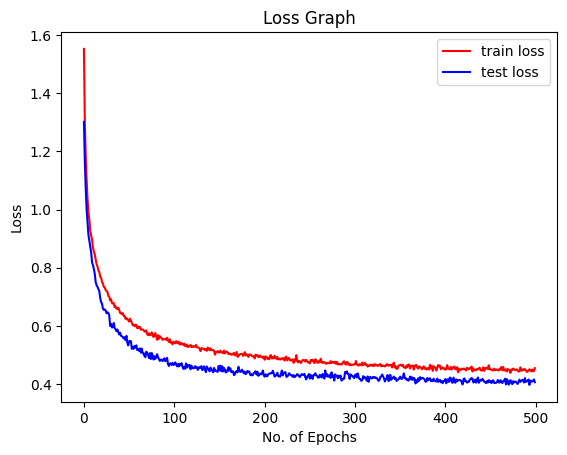

In [165]:
plt.plot(r.history['loss'],'r',label='train loss')
plt.plot(r.history['val_loss'],'b',label='test loss')
plt.xlabel('No. of Epochs')
plt.ylabel('Loss')
plt.title('Loss Graph')
plt.legend();

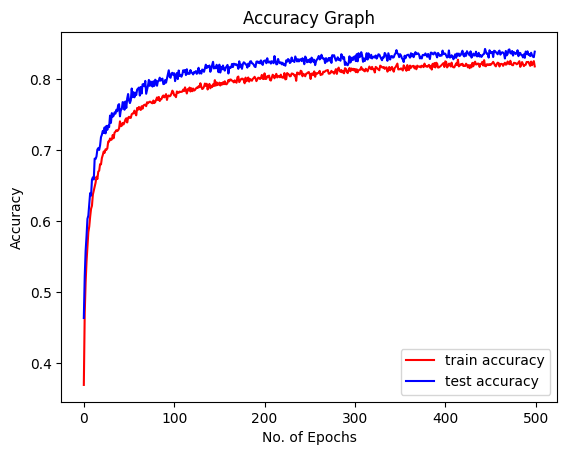

In [166]:
plt.plot(r.history['accuracy'],'r',label='train accuracy')
plt.plot(r.history['val_accuracy'],'b',label='test accuracy')
plt.xlabel('No. of Epochs')
plt.ylabel('Accuracy')
plt.title('Accuracy Graph')
plt.legend();

## Cross validating the performance of the best performing model

In [167]:
avg_cv_scores = cross_val_score(grid_gb,X_test_fn,y_test,scoring='accuracy',cv=RepeatedKFold(n_repeats=3,n_splits=4),verbose=1)
avg_cv_scores

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Fitting 2 folds for each of 10 candidates, totalling 20 fits
[CV 1/2] END criterion=squared_error, learning_rate=0.2, loss=exponential, max_depth=50, max_features=auto, n_estimators=400;, score=nan total time=   0.0s
[CV 2/2] END criterion=squared_error, learning_rate=0.2, loss=exponential, max_depth=50, max_features=auto, n_estimators=400;, score=nan total time=   0.0s
[CV 1/2] END criterion=friedman_mse, learning_rate=0.7, loss=exponential, max_depth=150, max_features=auto, n_estimators=1000;, score=nan total time=   0.0s
[CV 2/2] END criterion=friedman_mse, learning_rate=0.7, loss=exponential, max_depth=150, max_features=auto, n_estimators=1000;, score=nan total time=   0.0s
[CV 1/2] END criterion=squared_error, learning_rate=0.7, loss=exponential, max_depth=50, max_features=auto, n_estimators=1000;, score=nan total time=   0.0s
[CV 2/2] END criterion=squared_error, learning_rate=0.7, loss=exponential, max_depth=50, max_features=auto, n_estimators=1000;, score=nan total time=   0.0s

[CV 1/2] END criterion=friedman_mse, learning_rate=0.2, loss=deviance, max_depth=50, max_features=log2, n_estimators=700;, score=0.760 total time=  10.5s
[CV 2/2] END criterion=friedman_mse, learning_rate=0.2, loss=deviance, max_depth=50, max_features=log2, n_estimators=700;, score=0.783 total time=  10.7s
[CV 1/2] END criterion=friedman_mse, learning_rate=0.2, loss=deviance, max_depth=50, max_features=auto, n_estimators=1000;, score=0.715 total time=  13.3s
[CV 2/2] END criterion=friedman_mse, learning_rate=0.2, loss=deviance, max_depth=50, max_features=auto, n_estimators=1000;, score=0.745 total time=  13.3s
[CV 1/2] END criterion=squared_error, learning_rate=1, loss=deviance, max_depth=150, max_features=auto, n_estimators=700;, score=0.708 total time=   5.9s
[CV 2/2] END criterion=squared_error, learning_rate=1, loss=deviance, max_depth=150, max_features=auto, n_estimators=700;, score=0.738 total time=   6.1s
[CV 1/2] END criterion=squared_error, learning_rate=0.4, loss=deviance, ma

[CV 1/2] END criterion=friedman_mse, learning_rate=1, loss=deviance, max_depth=15, max_features=auto, n_estimators=400;, score=0.744 total time=   5.7s
[CV 2/2] END criterion=friedman_mse, learning_rate=1, loss=deviance, max_depth=15, max_features=auto, n_estimators=400;, score=0.763 total time=   4.5s
[CV 1/2] END criterion=squared_error, learning_rate=0.2, loss=deviance, max_depth=50, max_features=auto, n_estimators=400;, score=0.739 total time=  12.6s
[CV 2/2] END criterion=squared_error, learning_rate=0.2, loss=deviance, max_depth=50, max_features=auto, n_estimators=400;, score=0.732 total time=  10.4s
[CV 1/2] END criterion=squared_error, learning_rate=0.4, loss=deviance, max_depth=100, max_features=log2, n_estimators=1000;, score=0.758 total time=  11.8s
[CV 2/2] END criterion=squared_error, learning_rate=0.4, loss=deviance, max_depth=100, max_features=log2, n_estimators=1000;, score=0.772 total time=  12.7s
[CV 1/2] END criterion=squared_error, learning_rate=1, loss=exponential,

[CV 1/2] END criterion=squared_error, learning_rate=0.2, loss=deviance, max_depth=15, max_features=log2, n_estimators=400;, score=0.756 total time=  12.4s
[CV 2/2] END criterion=squared_error, learning_rate=0.2, loss=deviance, max_depth=15, max_features=log2, n_estimators=400;, score=0.777 total time=  13.9s
[CV 1/2] END criterion=squared_error, learning_rate=0.2, loss=deviance, max_depth=150, max_features=log2, n_estimators=100;, score=0.752 total time=   8.2s
[CV 2/2] END criterion=squared_error, learning_rate=0.2, loss=deviance, max_depth=150, max_features=log2, n_estimators=100;, score=0.782 total time=  10.6s
Fitting 2 folds for each of 10 candidates, totalling 20 fits
[CV 1/2] END criterion=squared_error, learning_rate=0.7, loss=exponential, max_depth=100, max_features=log2, n_estimators=100;, score=nan total time=   0.0s
[CV 2/2] END criterion=squared_error, learning_rate=0.7, loss=exponential, max_depth=100, max_features=log2, n_estimators=100;, score=nan total time=   0.0s
[CV

[CV 1/2] END criterion=friedman_mse, learning_rate=0.7, loss=deviance, max_depth=15, max_features=auto, n_estimators=700;, score=0.754 total time=   9.4s
[CV 2/2] END criterion=friedman_mse, learning_rate=0.7, loss=deviance, max_depth=15, max_features=auto, n_estimators=700;, score=0.760 total time=  10.3s
[CV 1/2] END criterion=squared_error, learning_rate=0.4, loss=deviance, max_depth=100, max_features=log2, n_estimators=700;, score=0.767 total time=  10.6s
[CV 2/2] END criterion=squared_error, learning_rate=0.4, loss=deviance, max_depth=100, max_features=log2, n_estimators=700;, score=0.771 total time=  10.2s
[CV 1/2] END criterion=squared_error, learning_rate=0.2, loss=deviance, max_depth=50, max_features=auto, n_estimators=100;, score=0.726 total time=   8.1s
[CV 2/2] END criterion=squared_error, learning_rate=0.2, loss=deviance, max_depth=50, max_features=auto, n_estimators=100;, score=0.745 total time=   9.2s
[CV 1/2] END criterion=squared_error, learning_rate=0.2, loss=exponent

[Parallel(n_jobs=1)]: Done  12 out of  12 | elapsed: 21.7min finished


array([0.81732707, 0.82807253, 0.84150437, 0.83344527, 0.83680322,
       0.83814641, 0.83143049, 0.82337139, 0.8065816 , 0.83210208,
       0.83008731, 0.83478845])

In [168]:
mean_score = round(np.mean(avg_cv_scores),4)
print(f"Mean Cross Validation Performance of Gradient Boosting Classifier: {mean_score*100}%")

Mean Cross Validation Performance of Gradient Boosting Classifier: 82.95%


## Saving the best performing model for future use

In [169]:
et = ExtraTreesClassifier()
et.fit(X_train_fn,y_train)

ExtraTreesClassifier()

              precision    recall  f1-score   support

           0       0.75      0.74      0.74       897
           1       0.80      0.79      0.79       837
           2       0.90      0.91      0.91       847
           3       1.00      1.00      1.00       866
           4       0.99      1.00      0.99       842
           5       1.00      1.00      1.00       848
           6       1.00      1.00      1.00       819

    accuracy                           0.92      5956
   macro avg       0.92      0.92      0.92      5956
weighted avg       0.92      0.92      0.92      5956



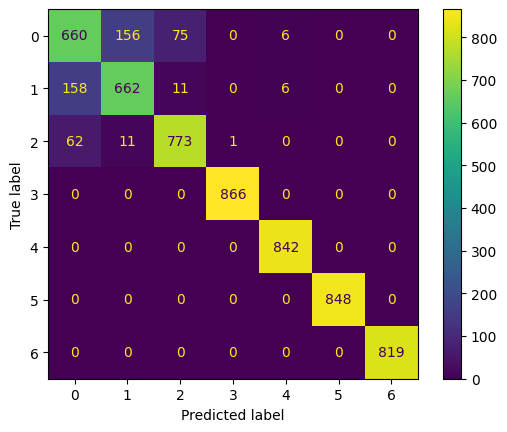

In [170]:
et_pred = et.predict(X_test_fn)
print(classification_report(y_test,et_pred))
ConfusionMatrixDisplay.from_predictions(y_test,et_pred)
plt.show();

In [184]:
joblib.dump(et,'model.pkl')

['model.pkl']

In [185]:
model = joblib.load('model.pkl')
model

ExtraTreesClassifier()